In [1]:
#Importing packages

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from scipy import stats
from scipy.stats import chi2_contingency
from scipy.stats import pearsonr
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.preprocessing import PolynomialFeatures
from scipy.stats import linregress, pearsonr

from tabulate import tabulate
from collections import Counter

from wordcloud import WordCloud

import statsmodels.api as sm

sns.set(style="whitegrid")
%matplotlib inline

!!! EDA for Initial Dataset !!!

In [2]:
#Importing dataset
file_path = "C:/Users/USER/Desktop/Thesis/data/raw data/Initial_marketing_campaign_dataset.csv"
df = pd.read_csv(file_path)

Overviewing

In [3]:
df.head()

,campaign_item_id,no_of_days,time,ext_service_id,ext_service_name,creative_id,creative_width,creative_height,search_tags,template_id,...,exchange_rate,media_cost_usd,position_in_content,unique_reach,total_reach,search_tag_cat,cmi_currency_code,timezone,weekday_cat,keywords
0,2733,7,2022-05-01,128,Facebook Ads,1000,300.0,250.0,#The Power of X,90.0,...,1,14.058514,NaN,NaN,NaN,Others,SGD,Asia/Singapore,week_end,delicate bracelets
1,2733,8,2022-05-02,16,DV360,1000,300.0,250.0,#Be Bold. Be X,90.0,...,1,99.633496,NaN,NaN,NaN,Others,SGD,Asia/Singapore,week_day,summer jewelry
2,2733,9,2022-05-03,128,Facebook Ads,1000,300.0,250.0,#Embrace Your Individuality with X,90.0,...,1,109.419677,NaN,NaN,NaN,Others,SGD,Asia/Singapore,week_day,artisan jewelry
3,2733,10,2022-05-04,128,Facebook Ads,1000,300.0,250.0,#Be Bold. Be X,90.0,...,1,115.209499,NaN,NaN,NaN,Others,SGD,Asia/Singapore,week_day,layered bracelets
4,2733,11,2022-05-05,4,Google Ads,1000,300.0,250.0,#Be Bold. Be X,90.0,...,1,66.990104,NaN,NaN,NaN,Others,SGD,Asia/Singapore,week_day,minimalist jewelry


In [4]:
df.shape

(72612, 35)

In [5]:
df.columns

Index(['campaign_item_id', 'no_of_days', 'time', 'ext_service_id',
       'ext_service_name', 'creative_id', 'creative_width', 'creative_height',
       'search_tags', 'template_id', 'landing_page', 'advertiser_id',
       'advertiser_name', 'network_id', 'approved_budget',
       'advertiser_currency', 'channel_id', 'channel_name', 'max_bid_cpm',
       'network_margin', 'campaign_budget_usd', 'impressions', 'clicks',
       'stats_currency', 'currency_code', 'exchange_rate', 'media_cost_usd',
       'position_in_content', 'unique_reach', 'total_reach', 'search_tag_cat',
       'cmi_currency_code', 'timezone', 'weekday_cat', 'keywords'],
      dtype='object')

In [6]:
df.info

<bound method DataFrame.info of        campaign_item_id  no_of_days        time  ext_service_id  \
0                  2733           7  2022-05-01             128   
1                  2733           8  2022-05-02              16   
2                  2733           9  2022-05-03             128   
3                  2733          10  2022-05-04             128   
4                  2733          11  2022-05-05               4   
...                 ...         ...         ...             ...   
72607              3567          11  2022-11-28               4   
72608              3567          12  2022-11-29             128   
72609              3567          13  2022-11-30             128   
72610              3567          14  2022-12-01               4   
72611              3567          15  2022-12-02              16   

      ext_service_name  creative_id  creative_width  creative_height  \
0         Facebook Ads         1000           300.0            250.0   
1                DV

In [7]:
# Categorical, Numeric, Binary
categorical = df.select_dtypes(include='object').columns.tolist()
numeric = df.select_dtypes(include='number').columns.tolist()


# Check binary (0/1 or Yes/No types)
binary_vars = [col for col in df.columns if df[col].nunique() == 2]
print("Categorical:", categorical)
print("Numeric:", numeric)
print("Binary:", binary_vars)


Categorical: ['time', 'ext_service_name', 'search_tags', 'landing_page', 'advertiser_name', 'advertiser_currency', 'channel_name', 'stats_currency', 'currency_code', 'search_tag_cat', 'cmi_currency_code', 'timezone', 'weekday_cat', 'keywords']
Numeric: ['campaign_item_id', 'no_of_days', 'ext_service_id', 'creative_id', 'creative_width', 'creative_height', 'template_id', 'advertiser_id', 'network_id', 'approved_budget', 'channel_id', 'max_bid_cpm', 'network_margin', 'campaign_budget_usd', 'impressions', 'clicks', 'exchange_rate', 'media_cost_usd', 'position_in_content', 'unique_reach', 'total_reach']
Binary: ['creative_width', 'creative_height', 'weekday_cat']


In [8]:
#Checking numerical values

float = df.select_dtypes(include='float64').columns.tolist()
integer = df.select_dtypes(include='int64').columns.tolist()

print("Float:", float)
print("Integer:", integer)

Float: ['creative_width', 'creative_height', 'template_id', 'approved_budget', 'max_bid_cpm', 'network_margin', 'campaign_budget_usd', 'media_cost_usd', 'position_in_content', 'unique_reach', 'total_reach']
Integer: ['campaign_item_id', 'no_of_days', 'ext_service_id', 'creative_id', 'advertiser_id', 'network_id', 'channel_id', 'impressions', 'clicks', 'exchange_rate']


In [9]:
df.nunique()

campaign_item_id         157
no_of_days               119
time                     224
ext_service_id             3
ext_service_name           3
creative_id             2922
creative_width             2
creative_height            2
search_tags                6
template_id                5
landing_page              45
advertiser_id             47
advertiser_name           44
network_id                 6
approved_budget           61
advertiser_currency        5
channel_id                 5
channel_name               5
max_bid_cpm                1
network_margin             1
campaign_budget_usd      696
impressions             6624
clicks                  1284
stats_currency             5
currency_code              5
exchange_rate              1
media_cost_usd         71753
position_in_content        0
unique_reach               0
total_reach                0
search_tag_cat             5
cmi_currency_code          5
timezone                   7
weekday_cat                2
keywords      

C L E A N I N G

In [10]:
# Check data types
print(df[['max_bid_cpm', 'network_margin', 'exchange_rate', 'position_in_content', 'unique_reach', 'total_reach']].dtypes)

# Check missing values
print(df[['max_bid_cpm', 'network_margin', 'exchange_rate', 'position_in_content', 'unique_reach', 'total_reach']].isnull().sum())

# Peek at unique values or sample
print(df[['max_bid_cpm', 'network_margin', 'exchange_rate', 'position_in_content', 'unique_reach', 'total_reach']].head(10))


max_bid_cpm            float64
network_margin         float64
exchange_rate            int64
position_in_content    float64
unique_reach           float64
total_reach            float64
dtype: object
max_bid_cpm            65206
network_margin             0
exchange_rate              0
position_in_content    72612
unique_reach           72612
total_reach            72612
dtype: int64
   max_bid_cpm  network_margin  exchange_rate  position_in_content  \
0          NaN             0.0              1                  NaN   
1          NaN             0.0              1                  NaN   
2          NaN             0.0              1                  NaN   
3          NaN             0.0              1                  NaN   
4          NaN             0.0              1                  NaN   
5          1.0             0.0              1                  NaN   
6          1.0             0.0              1                  NaN   
7          1.0             0.0              1        

    This shows that unique_reach, total_reach and position_in_content have all null values, so they must be dropped.
    exchange_rate, max_bid_comp and network_margin have all constant values, and they offer no information for correlation and statistics => they must be dropped.

In [11]:
df.drop(['unique_reach', 'total_reach', 'position_in_content'], axis=1, inplace=True)
df.drop(['exchange_rate', 'max_bid_cpm', 'network_margin'], axis=1, inplace=True)


In [12]:

# Clean and split keywords into lists
df['keywords'] = df['keywords'].astype(str).str.lower().str.replace(r'[^\w\s,]', '', regex=True)
df['keywords_list'] = df['keywords'].str.split(',')

# Clean and split search_tags into lists
df['search_tags'] = df['search_tags'].astype(str).str.lower().str.replace(r'[^\w\s,]', '', regex=True)
df['search_tags_list'] = df['search_tags'].str.split(',')


S T A T I S T I C S

In [13]:
df.describe(include='all')

,campaign_item_id,no_of_days,time,ext_service_id,ext_service_name,creative_id,creative_width,creative_height,search_tags,template_id,...,stats_currency,currency_code,media_cost_usd,search_tag_cat,cmi_currency_code,timezone,weekday_cat,keywords,keywords_list,search_tags_list
count,72612.000000,72612.000000,72612,72612.000000,72612,72612.000000,69200.000000,69200.000000,72612,69200.000000,...,72612,72612,72612.000000,72612,72612,72612,72612,72612,72612,72612
unique,NaN,NaN,224,NaN,3,NaN,NaN,NaN,6,NaN,...,5,5,NaN,5,5,7,2,118,118,6
top,NaN,NaN,2022-10-22,NaN,Facebook Ads,NaN,NaN,NaN,the ultimate fashion statement with x,NaN,...,AED,AED,NaN,Others,AED,Asia/Kolkata,week_day,beaded jewelry,[beaded jewelry],[the ultimate fashion statement with x]
freq,NaN,NaN,955,NaN,24275,NaN,NaN,NaN,12293,NaN,...,53661,53661,NaN,49008,53661,64264,62424,674,674,12293
mean,3130.143282,27.036344,NaN,49.449127,NaN,7450.124842,267.810694,223.175578,NaN,83.082659,...,NaN,NaN,11.819999,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,142.154918,25.479175,NaN,55.881324,NaN,4062.384982,92.848075,77.373396,NaN,20.847618,...,NaN,NaN,48.370659,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,2733.000000,0.000000,NaN,4.000000,NaN,1000.000000,0.000000,0.000000,NaN,23.000000,...,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,3148.000000,9.000000,NaN,4.000000,NaN,3725.000000,300.000000,250.000000,NaN,90.000000,...,NaN,NaN,0.435791,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,3173.000000,19.000000,NaN,16.000000,NaN,7855.000000,300.000000,250.000000,NaN,90.000000,...,NaN,NaN,1.709001,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,3202.000000,37.000000,NaN,128.000000,NaN,10995.000000,300.000000,250.000000,NaN,90.000000,...,NaN,NaN,8.276369,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [14]:
# Look for potential constraint columns
constraint_like = [col for col in df.columns if any(x in col.lower() for x in ['budget', 'limit', 'cap', 'min', 'max'])]
print("Possible constraint variables:", constraint_like)


Possible constraint variables: ['approved_budget', 'campaign_budget_usd']


In [15]:
#Defining CTR, CPC and CPM for further analysis
numeric_df = df.select_dtypes(include=['float64', 'int64'])

numeric_df['CTR'] = df['clicks'] / df['impressions']
numeric_df['CPC'] = df['media_cost_usd'] / df['clicks']
numeric_df['CPM'] = (df['media_cost_usd'] / df['impressions']) * 1000


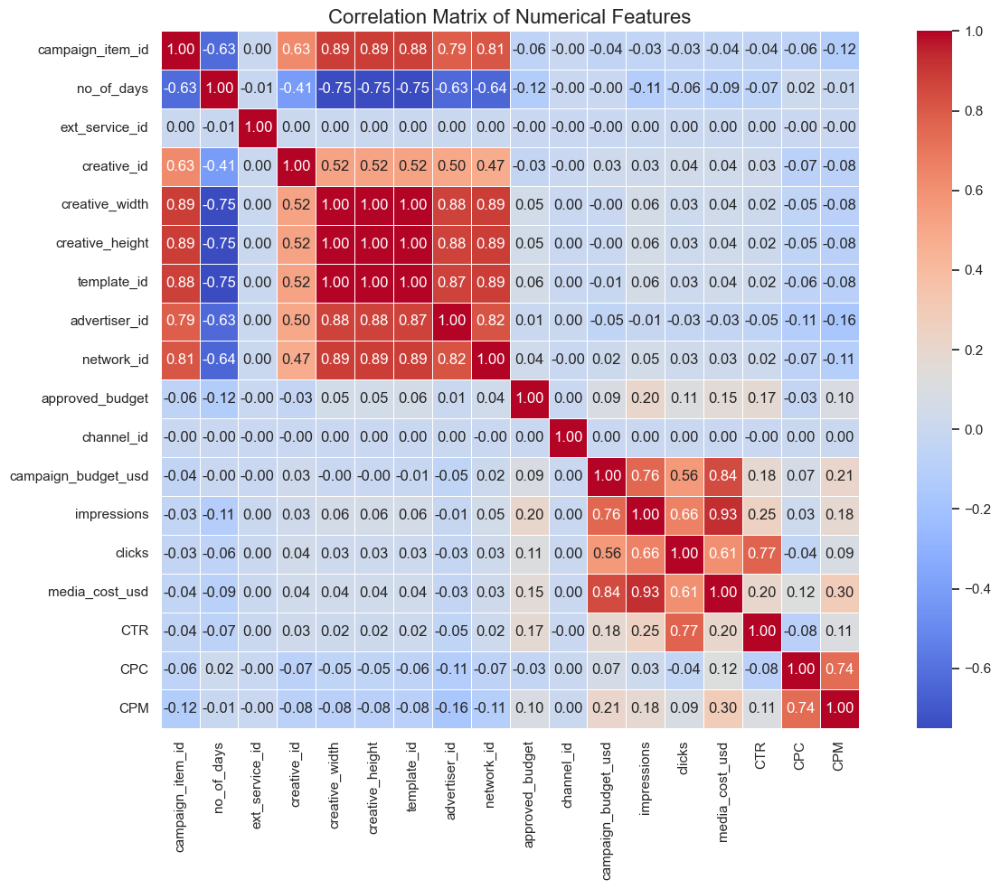

In [16]:
#Correlation matrix
corr = numeric_df.corr()
plt.figure(figsize=(14, 10))

# Heatmap
sns.heatmap(corr, annot=True, fmt=".2f", cmap='coolwarm', linewidths=0.5, square=True)

plt.title("Correlation Matrix of Numerical Features", fontsize=16)
plt.tight_layout()
plt.show()

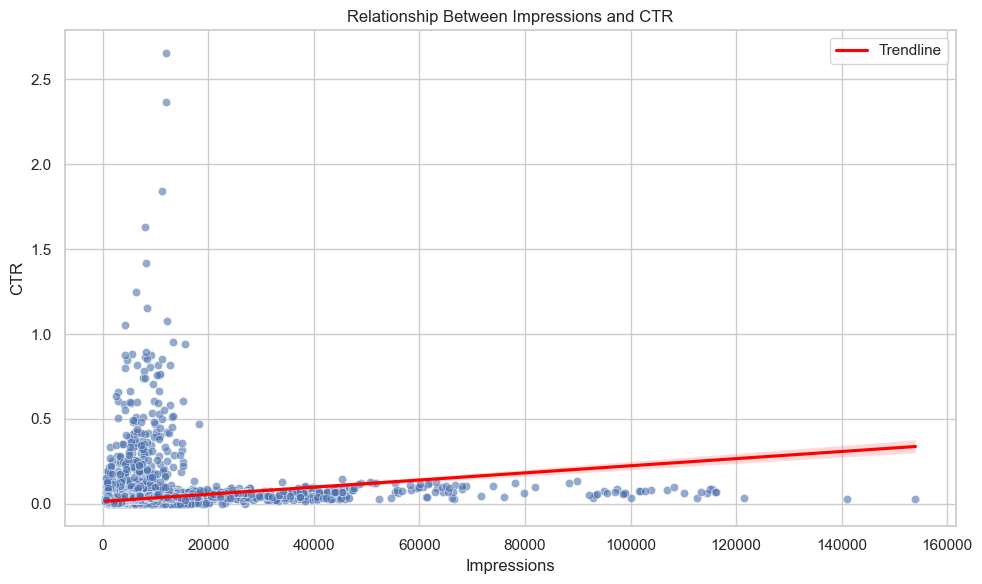

Pearson Correlation Coefficient between Impressions and CTR: 0.2515 (p-value: 0.0000e+00)


In [17]:
# Ensure CTR is calculated (clicks / impressions)
df['CTR'] = (df['clicks'] / df['impressions']).replace([np.inf, -np.inf], 0).fillna(0)

# Plotting the relationship
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='impressions', y='CTR', alpha=0.6)
sns.regplot(data=df, x='impressions', y='CTR', scatter=False, color='red', label='Trendline')
plt.title('Relationship Between Impressions and CTR')
plt.xlabel('Impressions')
plt.ylabel('CTR')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

# Correlation analysis
corr_coef, p_value = stats.pearsonr(df['impressions'], df['CTR'])
print(f"Pearson Correlation Coefficient between Impressions and CTR: {corr_coef:.4f} (p-value: {p_value:.4e})")

    Time-Series Analysis

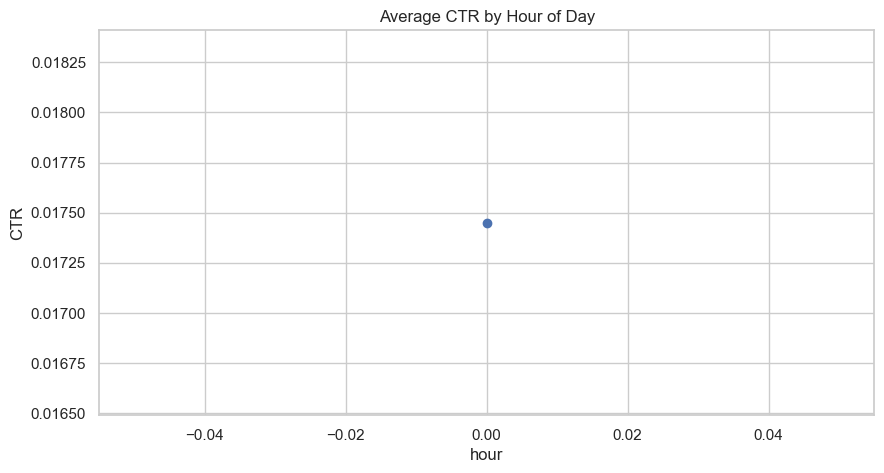

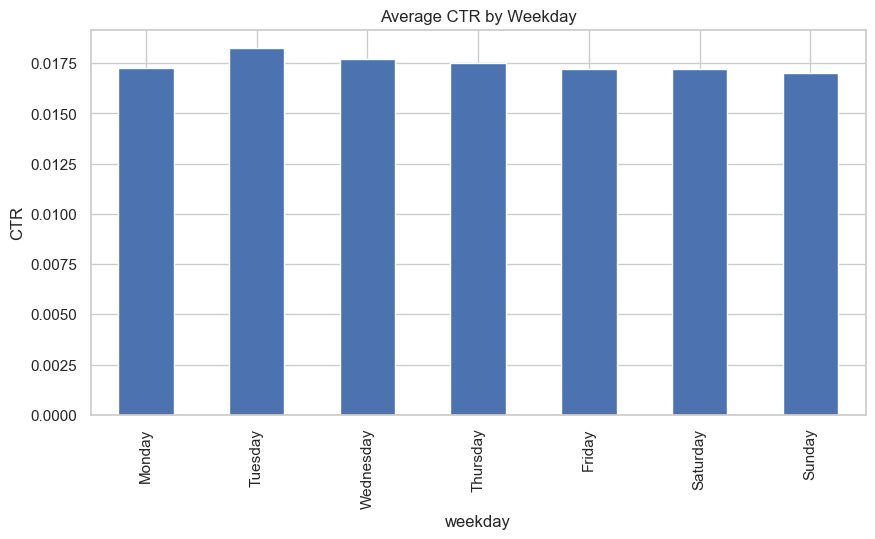

In [18]:
df['time'] = pd.to_datetime(df['time'])
df['hour'] = df['time'].dt.hour
df['weekday'] = df['time'].dt.day_name()

df['CTR'] = numeric_df['CTR']
df['CPC'] = numeric_df['CPC']
df['CPM'] = numeric_df['CPM']

# CTR by hour
df.groupby('hour')['CTR'].mean().plot(figsize=(10,5), marker='o', title='Average CTR by Hour of Day')
plt.ylabel('CTR')
plt.grid(True)
plt.show()

# CTR by weekday
df.groupby('weekday')['CTR'].mean().reindex(
    ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
).plot(kind='bar', figsize=(10,5), title='Average CTR by Weekday')
plt.ylabel('CTR')
plt.grid(True)
plt.show()


In [19]:
# Ensure 'time' is datetime
df['time'] = pd.to_datetime(df['time'])

# Extract the day of the week
df['weekday'] = df['time'].dt.day_name()

# Calculate average CTR, CPM, CPC per weekday
weekday_summary = df.groupby('weekday').agg(
    mean_CTR=('CTR', 'mean'),
    mean_CPM=('CPM', 'mean'),
    mean_CPC=('CPC', 'mean')
).reset_index()

# Sort the weekdays in proper order
weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
weekday_summary['weekday'] = pd.Categorical(weekday_summary['weekday'], categories=weekday_order, ordered=True)

# Sort the result by weekdays
weekday_summary = weekday_summary.sort_values('weekday')

# Display the table
print(weekday_summary)

     weekday  mean_CTR  mean_CPM  mean_CPC
1     Monday  0.017262  5.246925  0.395561
5    Tuesday  0.018254  5.419364  0.406191
6  Wednesday  0.017695  5.473662  0.411998
4   Thursday  0.017524  5.241019  0.399882
0     Friday  0.017203  5.072081  0.387003
2   Saturday  0.017203  5.229769  0.405934
3     Sunday  0.017026  5.382918  0.407582


<Axes: xlabel='time'>

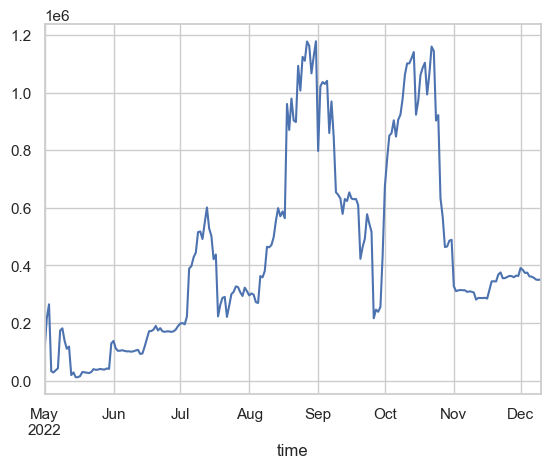

In [20]:
df.groupby('time')['impressions'].sum().plot()

<Axes: xlabel='time'>

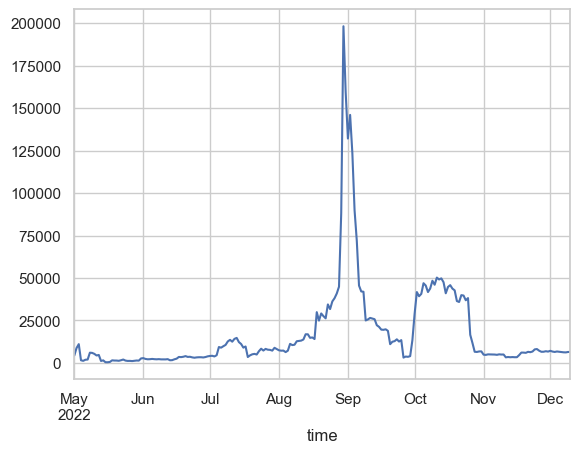

In [21]:
df.groupby('time')['clicks'].sum().plot()

<Axes: xlabel='time'>

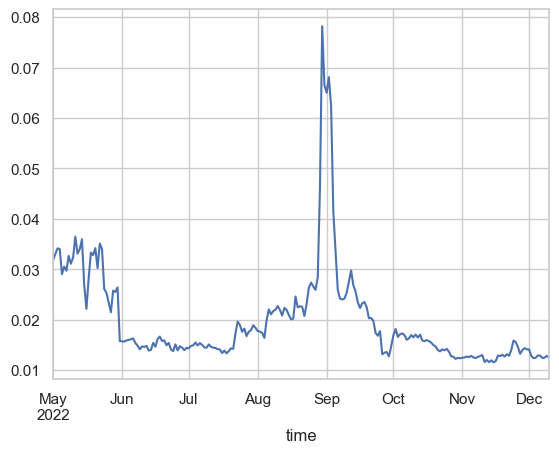

In [22]:
df.groupby('time')['CTR'].mean().plot()

<Axes: xlabel='time'>

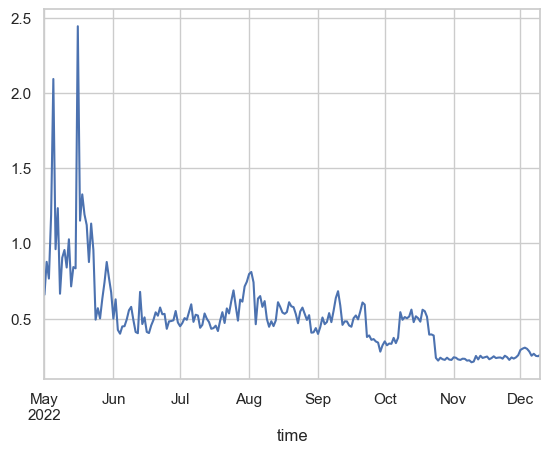

In [23]:
df.groupby('time')['CPC'].mean().plot()

<Axes: xlabel='time'>

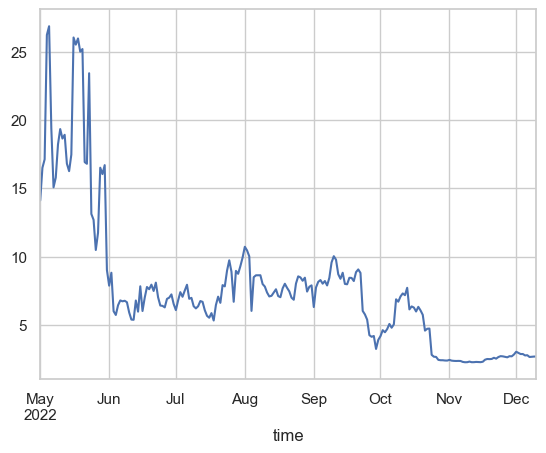

In [24]:
df.groupby('time')['CPM'].mean().plot()


<Axes: xlabel='time'>

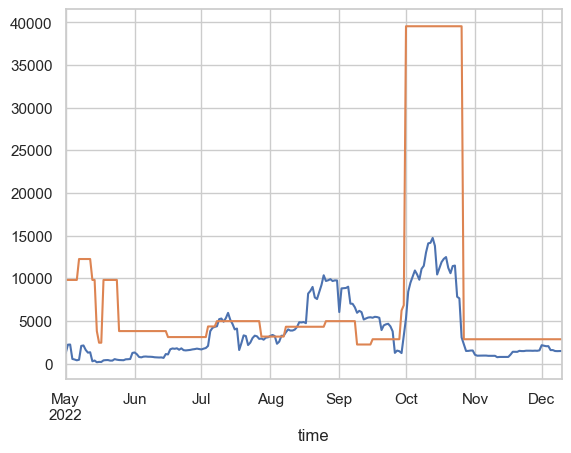

In [25]:
df.groupby('time')['media_cost_usd'].sum().plot()
df.groupby('time')['campaign_budget_usd'].max().plot()  # Assuming you have one budget per campaign per time period


In [26]:
print(df.columns)


Index(['campaign_item_id', 'no_of_days', 'time', 'ext_service_id',
       'ext_service_name', 'creative_id', 'creative_width', 'creative_height',
       'search_tags', 'template_id', 'landing_page', 'advertiser_id',
       'advertiser_name', 'network_id', 'approved_budget',
       'advertiser_currency', 'channel_id', 'channel_name',
       'campaign_budget_usd', 'impressions', 'clicks', 'stats_currency',
       'currency_code', 'media_cost_usd', 'search_tag_cat',
       'cmi_currency_code', 'timezone', 'weekday_cat', 'keywords',
       'keywords_list', 'search_tags_list', 'CTR', 'hour', 'weekday', 'CPC',
       'CPM'],
      dtype='object')


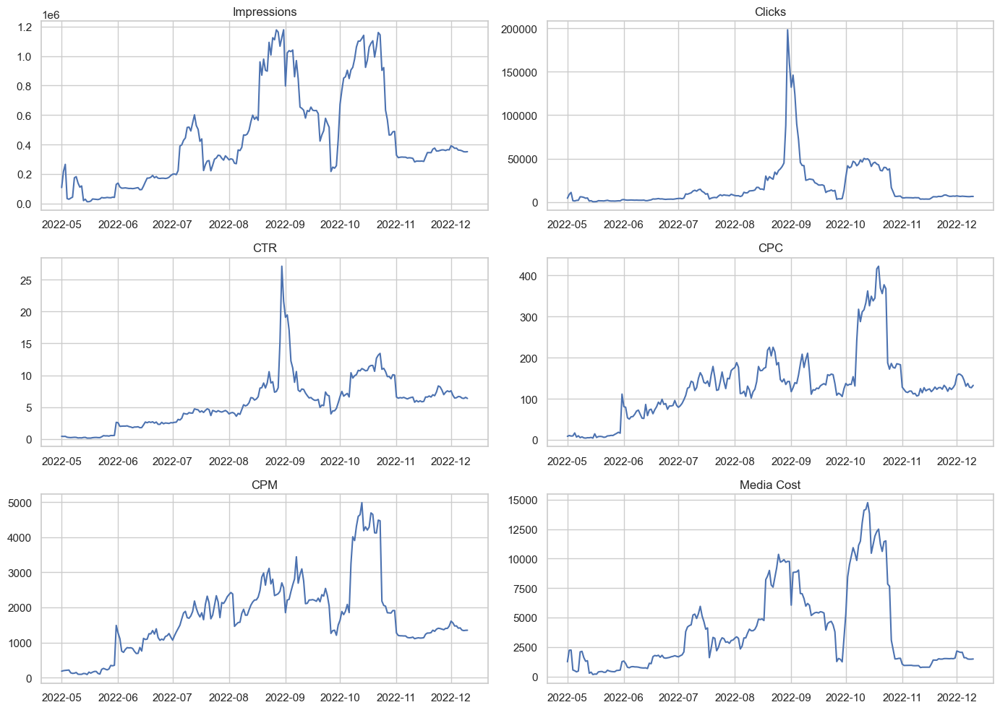

In [27]:

df['time'] = pd.to_datetime(df['time'])              # Ensure datetime
df = df.set_index('time')                            # Set as index
numeric_cols = df.select_dtypes(include='number')    # Filter only numeric columns
df_resampled = numeric_cols.resample('D').sum()      # Safe to sum now

fig, axes = plt.subplots(3, 2, figsize=(14, 10))

axes[0, 0].plot(df_resampled['impressions'])
axes[0, 0].set_title('Impressions')

axes[0, 1].plot(df_resampled['clicks'])
axes[0, 1].set_title('Clicks')

axes[1, 0].plot(df_resampled['CTR'])
axes[1, 0].set_title('CTR')

axes[1, 1].plot(df_resampled['CPC'])
axes[1, 1].set_title('CPC')

axes[2, 0].plot(df_resampled['CPM'])
axes[2, 0].set_title('CPM')

axes[2, 1].plot(df_resampled['media_cost_usd'])
axes[2, 1].set_title('Media Cost')

plt.tight_layout()
plt.show()


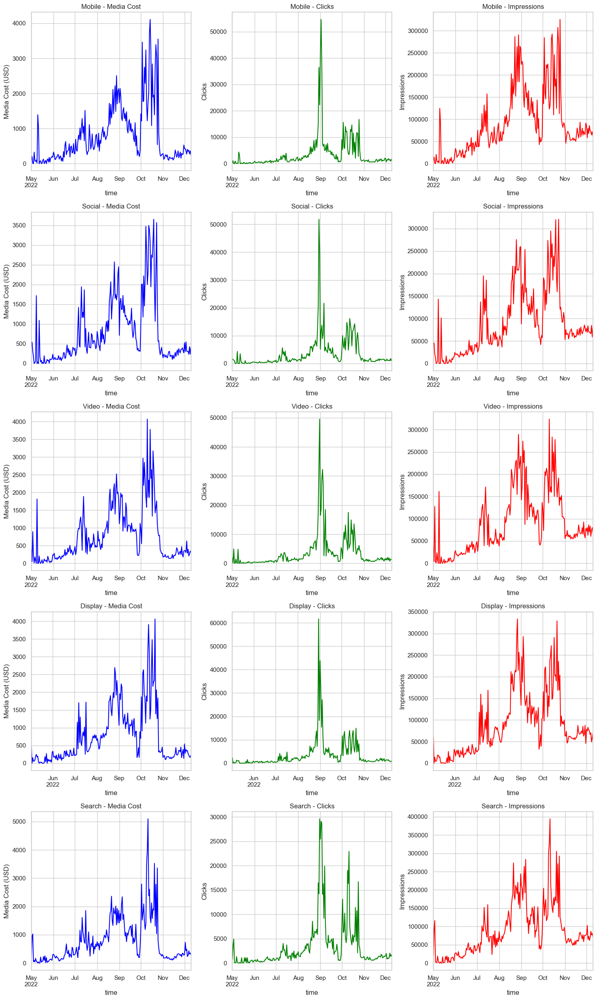

In [28]:
#Metrics comparison of channels over time
channels = df['channel_name'].unique()

# Create a figure and set up the subplots
fig, axes = plt.subplots(nrows=len(channels), ncols=3, figsize=(15, 5 * len(channels)))

# Loop through each channel and plot the time series for media cost, clicks, and impressions
for i, channel in enumerate(channels):
    ax1, ax2, ax3 = axes[i]  # Each row corresponds to one channel

    # Filter the data for the current channel
    channel_data = df[df['channel_name'] == channel]

    # Plot media cost
    channel_data.resample('D')['media_cost_usd'].sum().plot(ax=ax1, title=f'{channel} - Media Cost', color='blue')
    ax1.set_ylabel('Media Cost (USD)')

    # Plot clicks
    channel_data.resample('D')['clicks'].sum().plot(ax=ax2, title=f'{channel} - Clicks', color='green')
    ax2.set_ylabel('Clicks')

    # Plot impressions
    channel_data.resample('D')['impressions'].sum().plot(ax=ax3, title=f'{channel} - Impressions', color='red')
    ax3.set_ylabel('Impressions')

# Improve layout
plt.tight_layout()
plt.show()

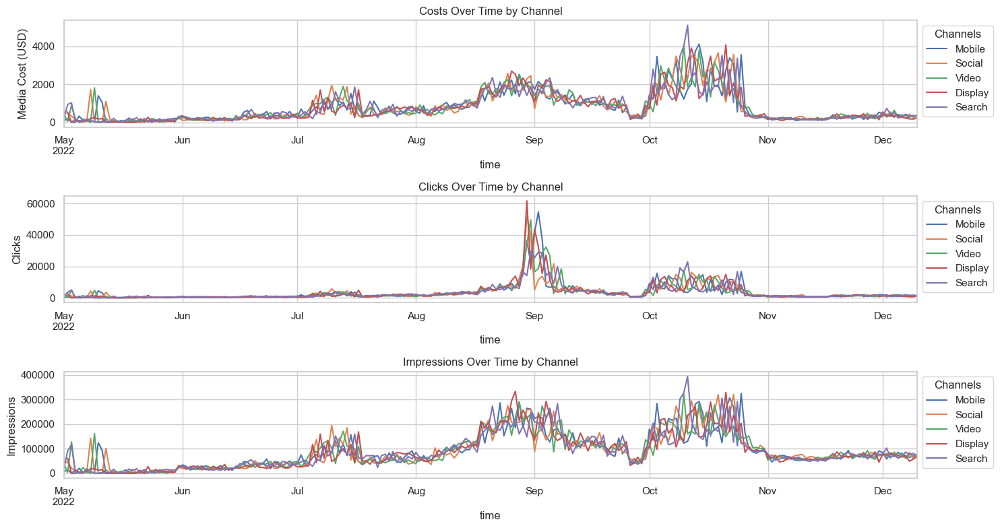

In [29]:

plt.figure(figsize=(15, 8))

# (1) Plot media costs over time for each channel
plt.subplot(3, 1, 1)
for channel in df['channel_name'].unique():
    channel_data = df[df['channel_name'] == channel]
    channel_data.resample('D')['media_cost_usd'].sum().plot(label=channel)
plt.title('Costs Over Time by Channel')
plt.ylabel('Media Cost (USD)')
plt.legend(title='Channels', bbox_to_anchor=(1, 1), loc='upper left')

# (2) Plot clicks over time for each channel
plt.subplot(3, 1, 2)
for channel in df['channel_name'].unique():
    channel_data = df[df['channel_name'] == channel]
    channel_data.resample('D')['clicks'].sum().plot(label=channel)
plt.title('Clicks Over Time by Channel')
plt.ylabel('Clicks')
plt.legend(title='Channels', bbox_to_anchor=(1, 1), loc='upper left')

# (3) Plot impressions over time for each channel
plt.subplot(3, 1, 3)
for channel in df['channel_name'].unique():
    channel_data = df[df['channel_name'] == channel]
    channel_data.resample('D')['impressions'].sum().plot(label=channel)
plt.title('Impressions Over Time by Channel')
plt.ylabel('Impressions')
plt.legend(title='Channels', bbox_to_anchor=(1, 1), loc='upper left')

# Improve layout to prevent overlap
plt.tight_layout()
plt.show()

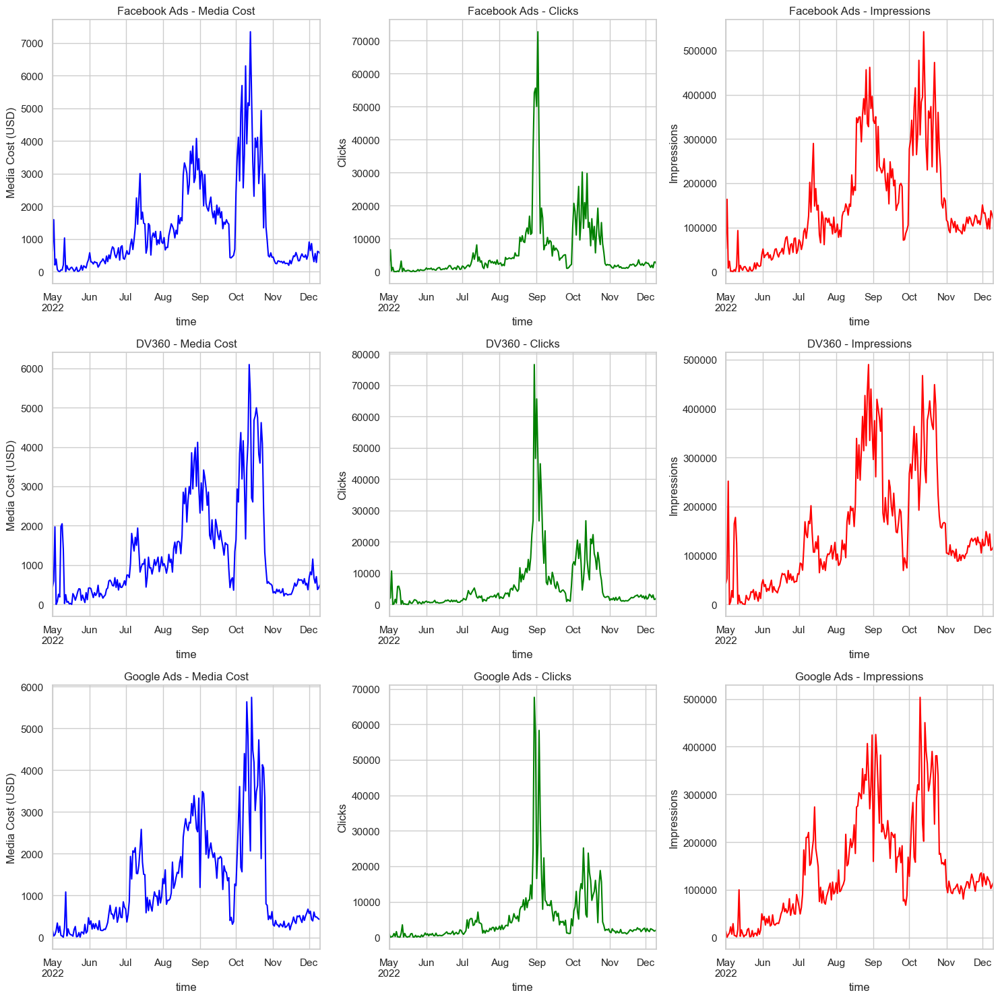

In [30]:
#Time series analysis for advertising platforms
platforms = df['ext_service_name'].unique()

# Create a figure and set up the subplots
fig, axes = plt.subplots(nrows=len(platforms), ncols=3, figsize=(15, 5 * len(platforms)))

# Loop through each platform and plot the time series for media cost, clicks, and impressions
for i, platform in enumerate(platforms):
    ax1, ax2, ax3 = axes[i]  # Each row corresponds to one platform

    # Filter the data for the current platform
    platform_data = df[df['ext_service_name'] == platform]

    # Plot media cost
    platform_data.resample('D')['media_cost_usd'].sum().plot(ax=ax1, title=f'{platform} - Media Cost', color='blue')
    ax1.set_ylabel('Media Cost (USD)')

    # Plot clicks
    platform_data.resample('D')['clicks'].sum().plot(ax=ax2, title=f'{platform} - Clicks', color='green')
    ax2.set_ylabel('Clicks')

    # Plot impressions
    platform_data.resample('D')['impressions'].sum().plot(ax=ax3, title=f'{platform} - Impressions', color='red')
    ax3.set_ylabel('Impressions')

# Improve layout
plt.tight_layout()
plt.show()

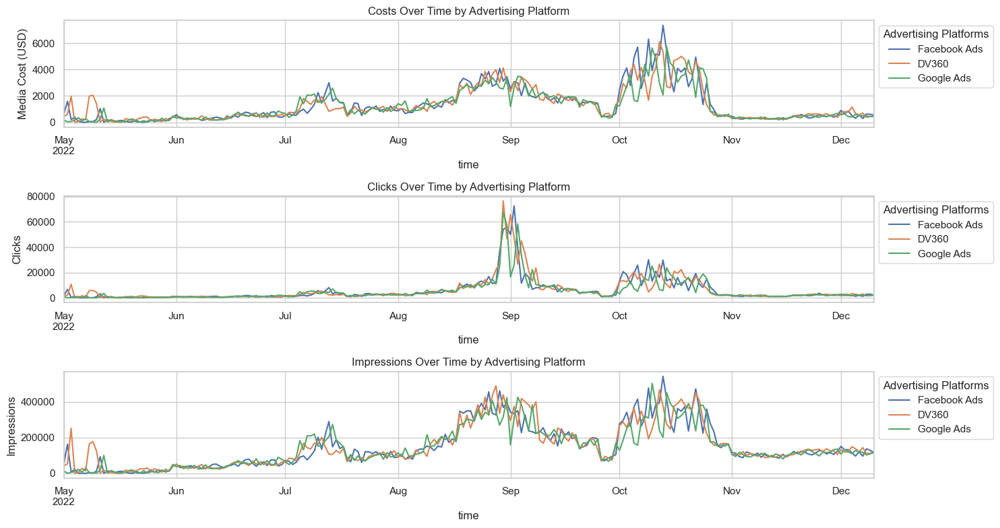

In [31]:
plt.figure(figsize=(15, 8))

# (1) Plot media costs over time for each advertising platform
plt.subplot(3, 1, 1)
for platform in df['ext_service_name'].unique():
    platform_data = df[df['ext_service_name'] == platform]
    platform_data.resample('D')['media_cost_usd'].sum().plot(label=platform)
plt.title('Costs Over Time by Advertising Platform')
plt.ylabel('Media Cost (USD)')
plt.legend(title='Advertising Platforms', bbox_to_anchor=(1, 1), loc='upper left')

# (2) Plot clicks over time for each advertising platform
plt.subplot(3, 1, 2)
for platform in df['ext_service_name'].unique():
    platform_data = df[df['ext_service_name'] == platform]
    platform_data.resample('D')['clicks'].sum().plot(label=platform)
plt.title('Clicks Over Time by Advertising Platform')
plt.ylabel('Clicks')
plt.legend(title='Advertising Platforms', bbox_to_anchor=(1, 1), loc='upper left')

# (3) Plot impressions over time for each advertising platform
plt.subplot(3, 1, 3)
for platform in df['ext_service_name'].unique():
    platform_data = df[df['ext_service_name'] == platform]
    platform_data.resample('D')['impressions'].sum().plot(label=platform)
plt.title('Impressions Over Time by Advertising Platform')
plt.ylabel('Impressions')
plt.legend(title='Advertising Platforms', bbox_to_anchor=(1, 1), loc='upper left')

# Improve layout
plt.tight_layout()
plt.show()

        Single Channel Campaign Analysis

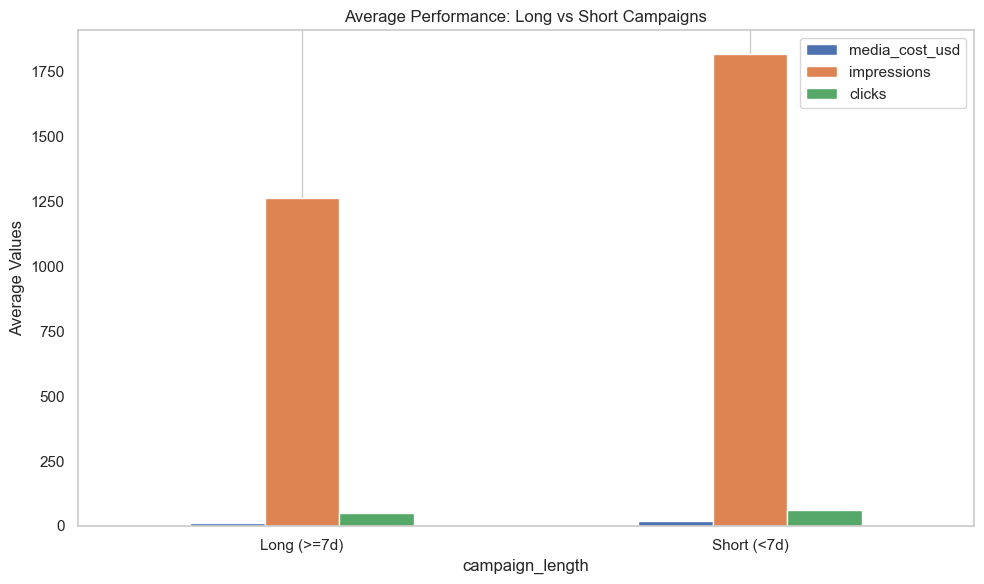

In [32]:
# Define campaign duration groups
df['campaign_length'] = df['no_of_days'].apply(lambda x: 'Long (>=7d)' if x >= 7 else 'Short (<7d)')

# Group by campaign length and calculate average metrics
duration_grouped = df.groupby('campaign_length')[['media_cost_usd', 'impressions', 'clicks']].mean().round(2)

# Plot comparison
duration_grouped.plot(kind='bar', figsize=(10, 6), title='Average Performance: Long vs Short Campaigns')
plt.ylabel('Average Values')
plt.xticks(rotation=0)
plt.grid(axis='y')
plt.tight_layout()
plt.show()


In [33]:
# Ensure clicks and impressions > 0 to avoid division by zero
df_filtered = df[(df['impressions'] > 0) & (df['clicks'] > 0)]

# Define campaign duration groups
df_filtered['campaign_length'] = df_filtered['no_of_days'].apply(lambda x: 'Long (>=7d)' if x >= 7 else 'Short (<7d)')

# Calculate metrics
df_filtered['CTR'] = df_filtered['clicks'] / df_filtered['impressions']
df_filtered['CPC'] = df_filtered['media_cost_usd'] / df_filtered['clicks']
df_filtered['CPM'] = df_filtered['media_cost_usd'] / df_filtered['impressions'] * 1000

# Average per group
metrics = df_filtered.groupby('campaign_length')[['CTR', 'CPC', 'CPM']].mean().round(4)

# Calculate % differences (Short compared to Long)
percent_diff = ((metrics.loc['Short (<7d)'] - metrics.loc['Long (>=7d)']) / metrics.loc['Long (>=7d)'] * 100).round(2)

# Combine for display
comparison = metrics.copy()
comparison.loc['% Difference (Short vs Long)'] = percent_diff

print(comparison)


                                 CTR      CPC      CPM
campaign_length                                       
Long (>=7d)                   0.0171   0.3853   4.9724
Short (<7d)                   0.0188   0.4717   6.6348
% Difference (Short vs Long)  9.9400  22.4200  33.4300


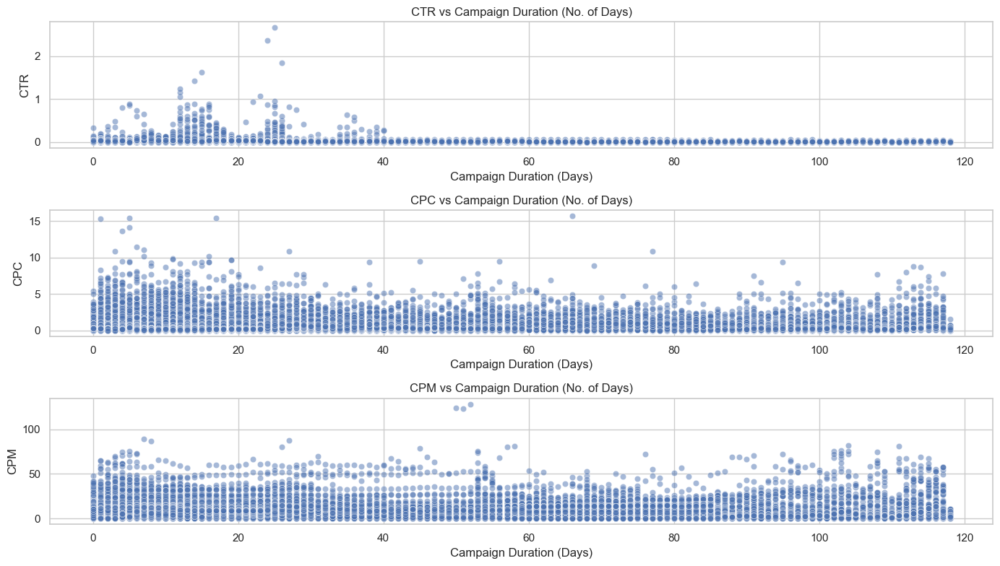

C:\Users\USER\AppData\Local\Temp\ipykernel_15556\2342847278.py:49: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_filtered['CTR_pct_change'].fillna(0, inplace=True)
C:\Users\USER\AppData\Local\Temp\ipykernel_15556\2342847278.py:50: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

Fo

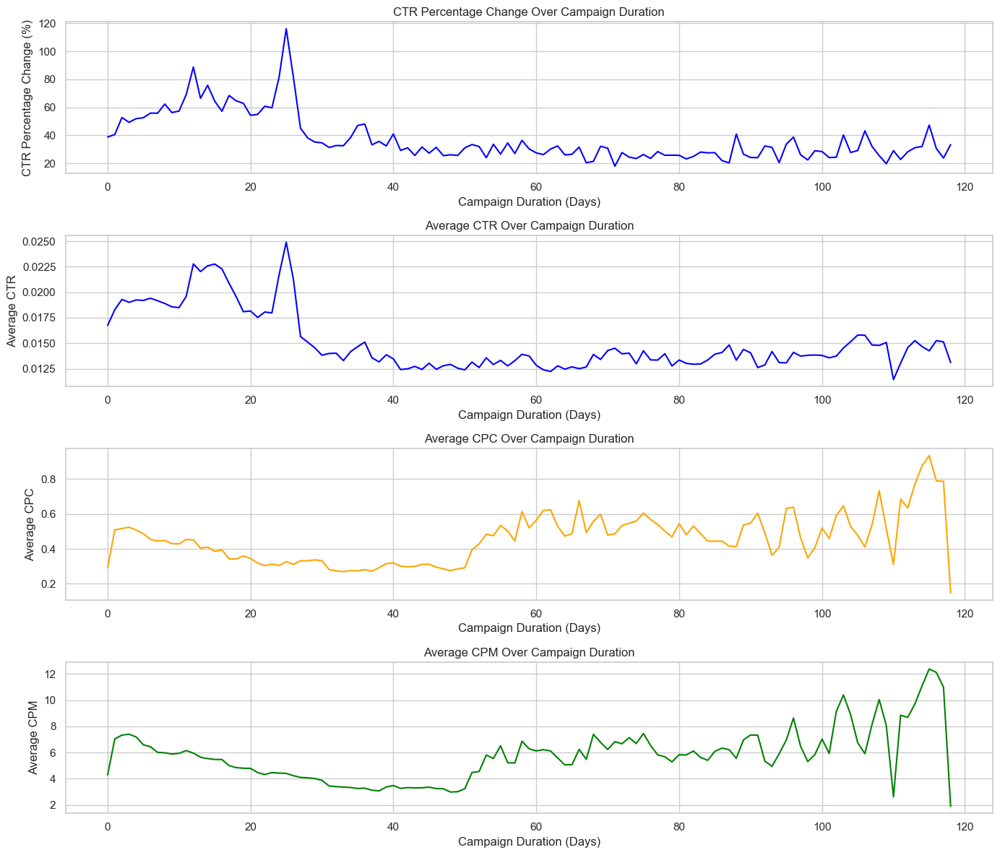

In [34]:
#Analyzing to extract the diminishing returns
import matplotlib.pyplot as plt
import seaborn as sns

# Ensure necessary columns are available
df_filtered = df[(df['impressions'] > 0) & (df['clicks'] > 0)]
df_filtered['CTR'] = df_filtered['clicks'] / df_filtered['impressions']
df_filtered['CPC'] = df_filtered['media_cost_usd'] / df_filtered['clicks']
df_filtered['CPM'] = df_filtered['media_cost_usd'] / df_filtered['impressions'] * 1000

# Plot CTR, CPC, CPM over campaign duration (no_of_days)
plt.figure(figsize=(14, 8))

# CTR plot
plt.subplot(3, 1, 1)
sns.scatterplot(x='no_of_days', y='CTR', data=df_filtered, alpha=0.5)
plt.title('CTR vs Campaign Duration (No. of Days)')
plt.xlabel('Campaign Duration (Days)')
plt.ylabel('CTR')

# CPC plot
plt.subplot(3, 1, 2)
sns.scatterplot(x='no_of_days', y='CPC', data=df_filtered, alpha=0.5)
plt.title('CPC vs Campaign Duration (No. of Days)')
plt.xlabel('Campaign Duration (Days)')
plt.ylabel('CPC')

# CPM plot
plt.subplot(3, 1, 3)
sns.scatterplot(x='no_of_days', y='CPM', data=df_filtered, alpha=0.5)
plt.title('CPM vs Campaign Duration (No. of Days)')
plt.xlabel('Campaign Duration (Days)')
plt.ylabel('CPM')

plt.tight_layout()
plt.show()

# Sort by campaign length
df_filtered = df_filtered.sort_values(by='no_of_days')

# Calculate the percentage change of CTR, CPC, and CPM over campaign length
df_filtered['CTR_pct_change'] = df_filtered['CTR'].pct_change() * 100
df_filtered['CPC_pct_change'] = df_filtered['CPC'].pct_change() * 100
df_filtered['CPM_pct_change'] = df_filtered['CPM'].pct_change() * 100

avg_metrics = df_filtered.groupby('no_of_days')[['CPC', 'CPM']].mean()

# To prevent NaN values at the start, we can fill them with 0 or any suitable value
df_filtered['CTR_pct_change'].fillna(0, inplace=True)
df_filtered['CPC_pct_change'].fillna(0, inplace=True)
df_filtered['CPM_pct_change'].fillna(0, inplace=True)

# Group by 'no_of_days' to get average percentage change for each day
avg_pct_change = df_filtered.groupby('no_of_days')[['CTR_pct_change', 'CPC_pct_change', 'CPM_pct_change']].mean()

# Group by 'no_of_days' to calculate average CPC and CPM for each day
avg_metrics = df_filtered.groupby('no_of_days')[['CTR', 'CPC', 'CPM']].mean()

# Create a figure with 3 subplots for separate metrics
fig, axes = plt.subplots(4, 1, figsize=(14, 12))

# CTR Percentage Change Plot
axes[0].plot(avg_pct_change.index, avg_pct_change['CTR_pct_change'], color='blue')
axes[0].set_title("CTR Percentage Change Over Campaign Duration")
axes[0].set_xlabel("Campaign Duration (Days)")
axes[0].set_ylabel("CTR Percentage Change (%)")
axes[0].grid(True)

# Plot average CPC vs Campaign Duration
axes[1].plot(avg_metrics.index, avg_metrics['CTR'], color='blue')
axes[1].set_title("Average CTR Over Campaign Duration")
axes[1].set_xlabel("Campaign Duration (Days)")
axes[1].set_ylabel("Average CTR")
axes[1].grid(True)

# Plot average CPC vs Campaign Duration
axes[2].plot(avg_metrics.index, avg_metrics['CPC'], color='orange')
axes[2].set_title("Average CPC Over Campaign Duration")
axes[2].set_xlabel("Campaign Duration (Days)")
axes[2].set_ylabel("Average CPC")
axes[2].grid(True)

# Plot average CPM vs Campaign Duration
axes[3].plot(avg_metrics.index, avg_metrics['CPM'], color='green')
axes[3].set_title("Average CPM Over Campaign Duration")
axes[3].set_xlabel("Campaign Duration (Days)")
axes[3].set_ylabel("Average CPM")
axes[3].grid(True)

# Adjust layout
plt.tight_layout()
plt.show()


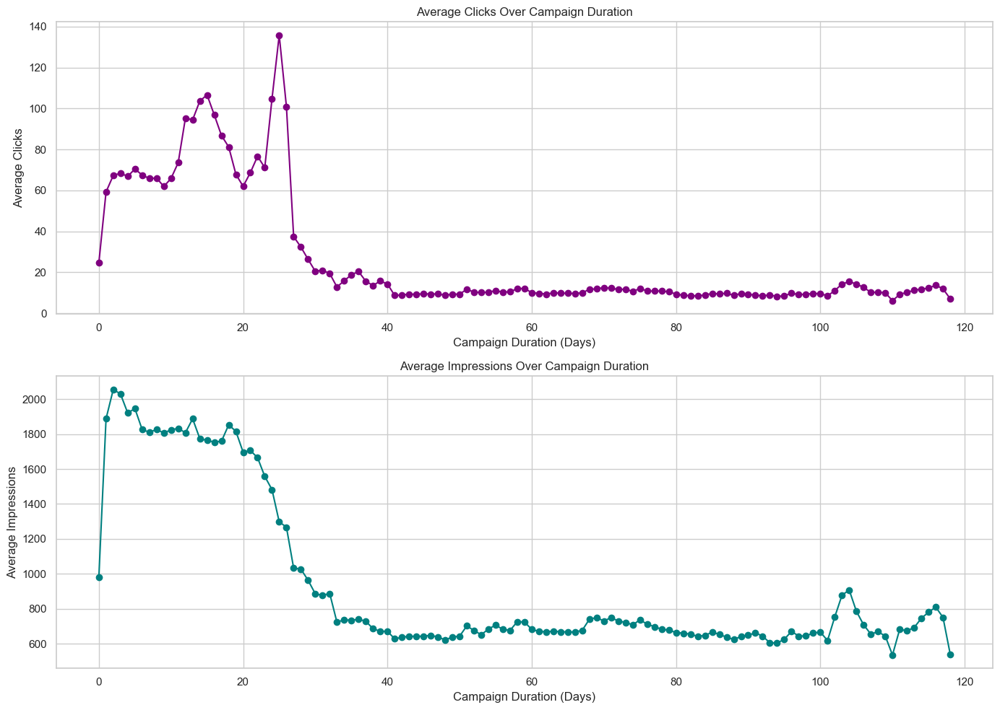

In [35]:
# Group by campaign duration to get average clicks and impressions
avg_clicks_impr = df_filtered.groupby('no_of_days')[['clicks', 'impressions']].mean()

# Create a figure with 2 subplots
fig, axes = plt.subplots(2, 1, figsize=(14, 10))

# Average Clicks vs Campaign Duration
axes[0].plot(avg_clicks_impr.index, avg_clicks_impr['clicks'], color='purple', marker='o')
axes[0].set_title("Average Clicks Over Campaign Duration")
axes[0].set_xlabel("Campaign Duration (Days)")
axes[0].set_ylabel("Average Clicks")
axes[0].grid(True)

# Average Impressions vs Campaign Duration
axes[1].plot(avg_clicks_impr.index, avg_clicks_impr['impressions'], color='teal', marker='o')
axes[1].set_title("Average Impressions Over Campaign Duration")
axes[1].set_xlabel("Campaign Duration (Days)")
axes[1].set_ylabel("Average Impressions")
axes[1].grid(True)

# Adjust layout
plt.tight_layout()
plt.show()


        Omnichannel Campaign Analysis

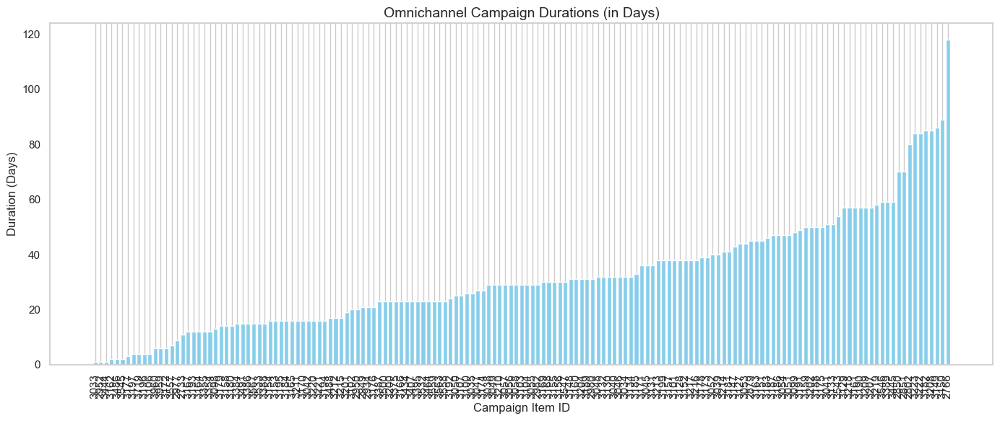

In [36]:
# Group by 'campaign_item_id' and aggregate:
# - max no_of_days to represent the omnichannel campaign's duration
# - campaign_budget_usd (mean or first if same across rows)
omni_campaigns = df.groupby('campaign_item_id').agg({
    'no_of_days': 'max',
    'campaign_budget_usd': 'first'  # or 'mean' if the budget varies per row
}).reset_index()

# Sort by duration if needed
omni_campaigns.sort_values(by='no_of_days', inplace=True)

# Plot
plt.figure(figsize=(14, 6))
plt.bar(omni_campaigns['campaign_item_id'].astype(str), omni_campaigns['no_of_days'], color='skyblue')
plt.title("Omnichannel Campaign Durations (in Days)", fontsize=14)
plt.xlabel("Campaign Item ID")
plt.ylabel("Duration (Days)")
plt.xticks(rotation=90)
plt.tight_layout()
plt.grid(axis='y')
plt.show()

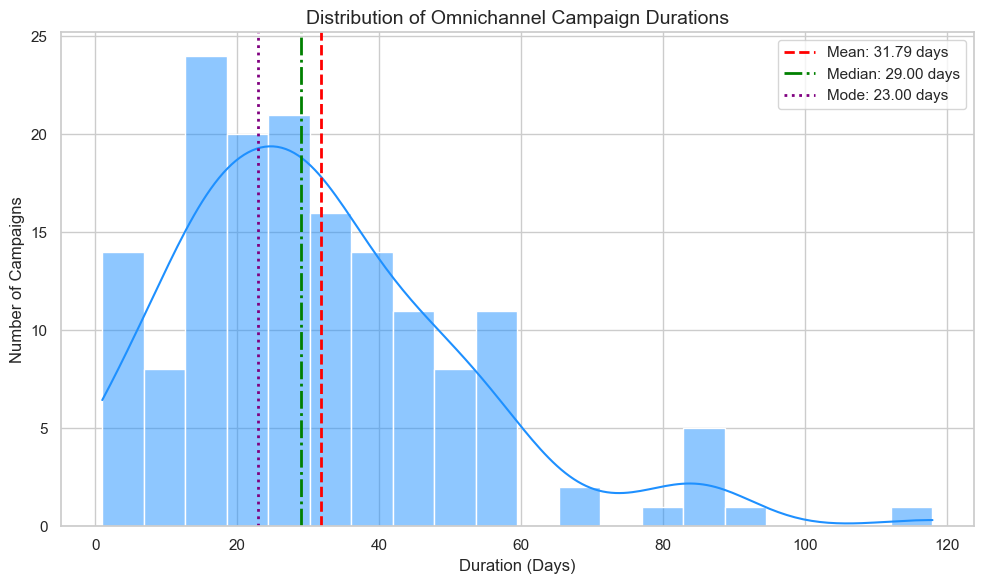

In [37]:

# Plot histogram
plt.figure(figsize=(10, 6))
sns.histplot(omni_campaigns['no_of_days'], bins=20, kde=True, color='dodgerblue')

# Calculate statistics
mean_duration = omni_campaigns['no_of_days'].mean()
median_duration = omni_campaigns['no_of_days'].median()
mode_duration = omni_campaigns['no_of_days'].mode().iloc[0]

plt.axvline(mean_duration, color='red', linestyle='--', linewidth=2, label=f'Mean: {mean_duration:.2f} days')
plt.axvline(median_duration, color='green', linestyle='-.', linewidth=2, label=f'Median: {median_duration:.2f} days')
plt.axvline(mode_duration, color='purple', linestyle=':', linewidth=2, label=f'Mode: {mode_duration:.2f} days')

plt.title("Distribution of Omnichannel Campaign Durations", fontsize=14)
plt.xlabel("Duration (Days)")
plt.ylabel("Number of Campaigns")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()




C:\Users\USER\AppData\Local\Temp\ipykernel_15556\2881381899.py:76: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  duration_grouped_basic = omni_metrics.groupby(pd.cut(omni_metrics['no_of_days'], bins)).agg({
C:\Users\USER\AppData\Local\Temp\ipykernel_15556\2881381899.py:82: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for bin_name, group in omni_metrics.groupby(pd.cut(omni_metrics['no_of_days'], bins)):
C:\Users\USER\AppData\Local\Temp\ipykernel_15556\2881381899.py:76: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to r

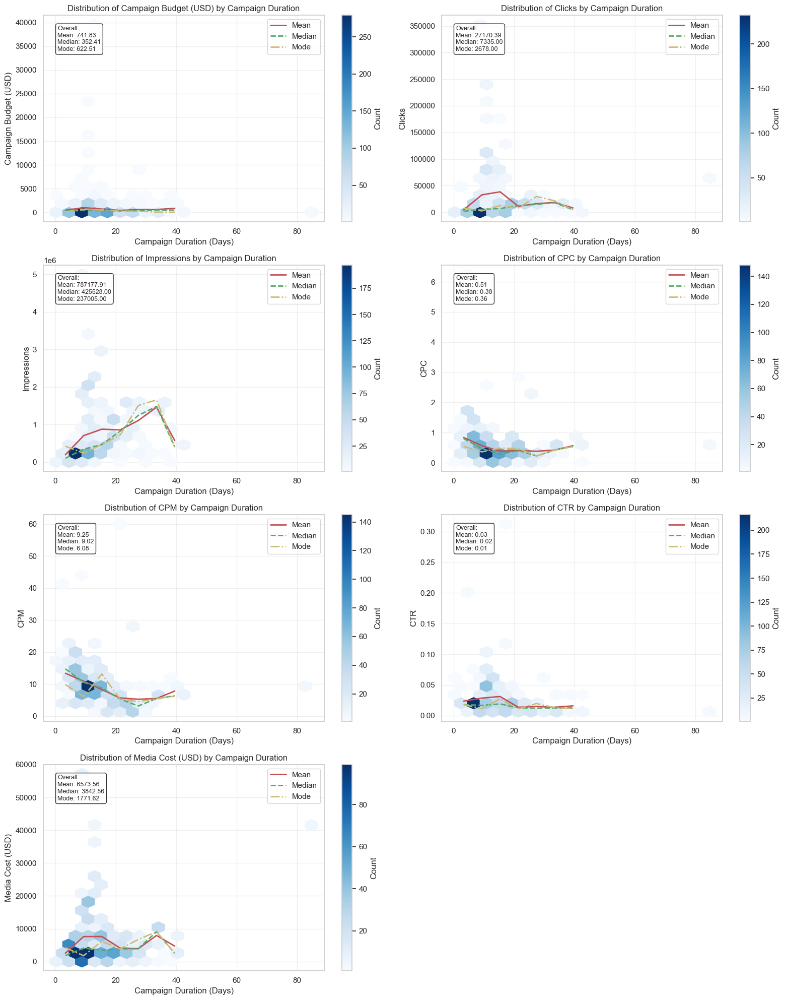

In [38]:

# Step 1: Aggregate metrics per omnichannel campaign
# Group by campaign_item_id and aggregate metrics from single-channel campaigns
omni_metrics = df.groupby('campaign_item_id').agg({
    'clicks': 'sum',
    'impressions': 'sum',
    'media_cost_usd': 'sum',
    'no_of_days': 'mean'  # Assuming `no_of_days` represents the duration of the single-channel campaigns
}).reset_index()

# Step 2: Calculate averages for each omnichannel campaign
# Calculate CTR, CPC, CPM as averages (or sums over days)
omni_metrics['CTR'] = (omni_metrics['clicks'] / omni_metrics['impressions']).replace([np.inf, -np.inf], 0).fillna(0)
omni_metrics['CPC'] = (omni_metrics['media_cost_usd'] / omni_metrics['clicks']).replace([np.inf, -np.inf], 0).fillna(0)
omni_metrics['CPM'] = (omni_metrics['media_cost_usd'] / omni_metrics['impressions'] * 1000).replace([np.inf, -np.inf], 0).fillna(0)

# Step 3: Merge with campaign budgets (assuming each omnichannel campaign has its own budget)
omni_campaigns = df[['campaign_item_id', 'campaign_budget_usd']].drop_duplicates()
omni_metrics = omni_metrics.merge(omni_campaigns, on='campaign_item_id', how='left')

# Step 4: Plot scatterplots with duration on x-axis
fig, axes = plt.subplots(4, 2, figsize=(16, 20))
axes = axes.flatten()

# Metrics and their titles
metrics = [
    ('campaign_budget_usd', 'Campaign Budget (USD)'),
    ('clicks', 'Clicks'),
    ('impressions', 'Impressions'),
    ('CPC', 'CPC'),
    ('CPM', 'CPM'),
    ('CTR', 'CTR'),
    ('media_cost_usd', 'Media Cost (USD)')
]

# Create a common duration range for histogram binning
bins = np.linspace(omni_metrics['no_of_days'].min(), omni_metrics['no_of_days'].max(), 15)

# Fixed function to calculate mode - handles empty arrays and single values correctly
def get_mode(data):
    if len(data) == 0:
        return np.nan

    try:
        mode_result = stats.mode(data)

        # Handle different scipy versions
        if hasattr(mode_result, 'mode'):  # scipy >= 1.8.0
            mode_val = mode_result.mode
            # Check if it's a scalar or array
            if isinstance(mode_val, np.ndarray):
                return mode_val[0] if len(mode_val) > 0 else np.nan
            else:
                return mode_val
        else:  # older scipy versions
            return mode_result[0][0] if len(mode_result[0]) > 0 else np.nan
    except:
        # Fallback method in case of any errors
        return data.iloc[0] if len(data) > 0 else np.nan

# Plot each metric against campaign duration
for i, (col, title) in enumerate(metrics):
    if col in omni_metrics.columns:
        # Create a 2D histogram using hexbin for better visualization
        hexbin = axes[i].hexbin(
            x=omni_metrics['no_of_days'],
            y=omni_metrics[col],
            gridsize=20,
            cmap='Blues',
            mincnt=1
        )

        # Add lines showing statistics per duration bin
        # Use try-except to handle potential issues with the groupby operation
        try:
            # First calculate mean and median with pandas built-in functions
            duration_grouped_basic = omni_metrics.groupby(pd.cut(omni_metrics['no_of_days'], bins)).agg({
                col: ['mean', 'median']
            })

            # Calculate mode separately to avoid issues
            mode_values = []
            for bin_name, group in omni_metrics.groupby(pd.cut(omni_metrics['no_of_days'], bins)):
                mode_values.append(get_mode(group[col].dropna()))

            # Create full dataframe with statistics
            duration_grouped = duration_grouped_basic.copy()
            duration_grouped[(col, 'mode')] = mode_values

            # Rename for easier access
            duration_grouped.columns = ['mean', 'median', 'mode']

            bin_centers = [(b.left + b.right)/2 for b in duration_grouped.index]

            # Plot mean, median, and mode lines
            axes[i].plot(bin_centers, duration_grouped['mean'], 'r-', linewidth=2, label='Mean')
            axes[i].plot(bin_centers, duration_grouped['median'], 'g--', linewidth=2, label='Median')
            axes[i].plot(bin_centers, duration_grouped['mode'], 'y-.', linewidth=2, label='Mode')

            # Calculate overall statistics for the annotation
            overall_mean = omni_metrics[col].mean()
            overall_median = omni_metrics[col].median()
            overall_mode = get_mode(omni_metrics[col].dropna())

            # Add annotation with overall statistics
            stat_text = f"Overall:\nMean: {overall_mean:.2f}\nMedian: {overall_median:.2f}\nMode: {overall_mode:.2f}"
            axes[i].annotate(stat_text, xy=(0.05, 0.95), xycoords='axes fraction',
                            bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="black", alpha=0.8),
                            va='top', ha='left', fontsize=9)
        except Exception as e:
            print(f"Error processing {col}: {str(e)}")
            # Just add a simple annotation about the error
            axes[i].annotate(f"Error calculating statistics: {str(e)}",
                           xy=(0.5, 0.5), xycoords='axes fraction',
                           ha='center', va='center')

        axes[i].set_title(f'Distribution of {title} by Campaign Duration')
        axes[i].set_xlabel('Campaign Duration (Days)')
        axes[i].set_ylabel(title)
        axes[i].grid(True, alpha=0.3)

        # Only add legend if we plotted the statistics lines
        if 'duration_grouped' in locals():
            axes[i].legend(loc='upper right')

        # Add colorbar for hexbin density
        cbar = plt.colorbar(hexbin, ax=axes[i])
        cbar.set_label('Count')

# Remove any unused subplot
if len(metrics) < len(axes):
    for j in range(len(metrics), len(axes)):
        fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


Campaign Duration Categories based on IQR:
+------------+---------------------+---------+--------------+
| Category   | Duration Range      |   Count | Percentage   |
+============+=====================+=========+==============+
| Very Short | 0 to 7.46 days      |     277 | 25.0%        |
+------------+---------------------+---------+--------------+
| Short      | 7.46 to 12.05 days  |     284 | 25.6%        |
+------------+---------------------+---------+--------------+
| Long       | 12.05 to 18.33 days |     279 | 25.2%        |
+------------+---------------------+---------+--------------+
| Very Long  | 18.33 to 34.64 days |     244 | 22.0%        |
+------------+---------------------+---------+--------------+
| Outlier    | > 34.64 days        |      24 | 2.2%         |
+------------+---------------------+---------+--------------+


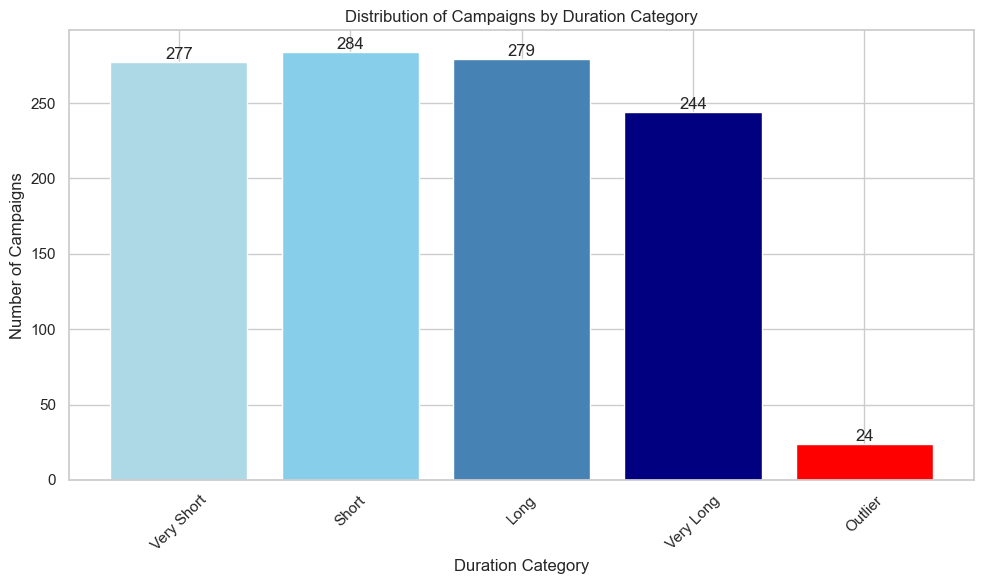


Performance Metrics by Duration Category:
+------------+--------------+-------------------+------------+-----------+-----------+-----------+--------------+
| Category   |   Avg Clicks |   Avg Impressions | Avg Cost   | Avg CTR   | Avg CPC   | Avg CPM   | Avg Budget   |
+============+==============+===================+============+===========+===========+===========+==============+
| Very Short |       4623.4 |  257716           | $3410.65   | 1.84%     | $0.87     | $13.19    | $358.15      |
+------------+--------------+-------------------+------------+-----------+-----------+-----------+--------------+
| Short      |      43506.2 |  854700           | $8781.06   | 3.51%     | $0.39     | $9.60     | $1226.71     |
+------------+--------------+-------------------+------------+-----------+-----------+-----------+--------------+
| Long       |      44805.6 |  970714           | $8701.13   | 3.28%     | $0.37     | $8.39     | $855.09      |
+------------+--------------+----------------

In [39]:
# Calculate quartiles and IQR for campaign duration
Q1 = omni_metrics['no_of_days'].quantile(0.25)
Q2 = omni_metrics['no_of_days'].quantile(0.50)  # median
Q3 = omni_metrics['no_of_days'].quantile(0.75)
IQR = Q3 - Q1

# Define the category boundaries
very_short_upper = Q1
short_upper = Q2
long_upper = Q3
very_long_upper = Q3 + 1.5 * IQR  # Using 1.5*IQR as upper bound for outlier detection

# Add category column to the dataframe
def categorize_duration(days):
    if days <= very_short_upper:
        return 'Very Short'
    elif days <= short_upper:
        return 'Short'
    elif days <= long_upper:
        return 'Long'
    elif days <= very_long_upper:
        return 'Very Long'
    else:
        return 'Outlier'  # For campaigns beyond 1.5*IQR above Q3

omni_metrics['duration_category'] = omni_metrics['no_of_days'].apply(categorize_duration)

# Create a table with the ranges for each category
categories = [
    ['Very Short', f'0 to {very_short_upper:.2f} days',
     len(omni_metrics[omni_metrics['duration_category'] == 'Very Short']),
     f"{len(omni_metrics[omni_metrics['duration_category'] == 'Very Short']) / len(omni_metrics) * 100:.1f}%"],
    ['Short', f'{very_short_upper:.2f} to {short_upper:.2f} days',
     len(omni_metrics[omni_metrics['duration_category'] == 'Short']),
     f"{len(omni_metrics[omni_metrics['duration_category'] == 'Short']) / len(omni_metrics) * 100:.1f}%"],
    ['Long', f'{short_upper:.2f} to {long_upper:.2f} days',
     len(omni_metrics[omni_metrics['duration_category'] == 'Long']),
     f"{len(omni_metrics[omni_metrics['duration_category'] == 'Long']) / len(omni_metrics) * 100:.1f}%"],
    ['Very Long', f'{long_upper:.2f} to {very_long_upper:.2f} days',
     len(omni_metrics[omni_metrics['duration_category'] == 'Very Long']),
     f"{len(omni_metrics[omni_metrics['duration_category'] == 'Very Long']) / len(omni_metrics) * 100:.1f}%"],
    ['Outlier', f'> {very_long_upper:.2f} days',
     len(omni_metrics[omni_metrics['duration_category'] == 'Outlier']),
     f"{len(omni_metrics[omni_metrics['duration_category'] == 'Outlier']) / len(omni_metrics) * 100:.1f}%"]
]

# Display the table
headers = ['Category', 'Duration Range', 'Count', 'Percentage']
table = tabulate(categories, headers=headers, tablefmt='grid')
print("Campaign Duration Categories based on IQR:")
print(table)

# Create a bar chart to visualize the distribution
plt.figure(figsize=(10, 6))
category_counts = omni_metrics['duration_category'].value_counts().sort_index(
    key=lambda x: pd.Categorical(x, categories=['Very Short', 'Short', 'Long', 'Very Long', 'Outlier'])
)
bars = plt.bar(category_counts.index, category_counts.values, color=['lightblue', 'skyblue', 'steelblue', 'navy', 'red'])

# Add count labels on top of each bar
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height + 0.1,
             f'{height}', ha='center', va='bottom')

plt.title('Distribution of Campaigns by Duration Category')
plt.xlabel('Duration Category')
plt.ylabel('Number of Campaigns')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Calculate average performance metrics for each category
category_performance = omni_metrics.groupby('duration_category').agg({
    'clicks': 'mean',
    'impressions': 'mean',
    'media_cost_usd': 'mean',
    'CTR': 'mean',
    'CPC': 'mean',
    'CPM': 'mean',
    'campaign_budget_usd': 'mean'
}).reset_index()

# Format the output table for better readability
performance_table = []
for _, row in category_performance.iterrows():
    performance_table.append([
        row['duration_category'],
        f"{row['clicks']:.1f}",
        f"{row['impressions']:.1f}",
        f"${row['media_cost_usd']:.2f}",
        f"{row['CTR']*100:.2f}%",
        f"${row['CPC']:.2f}",
        f"${row['CPM']:.2f}",
        f"${row['campaign_budget_usd']:.2f}"
    ])

# Sort the table by the natural order of categories
sorted_performance = sorted(performance_table,
                            key=lambda x: ['Very Short', 'Short', 'Long', 'Very Long', 'Outlier'].index(x[0])
                            if x[0] in ['Very Short', 'Short', 'Long', 'Very Long', 'Outlier'] else 99)

# Display performance metrics by category
perf_headers = ['Category', 'Avg Clicks', 'Avg Impressions', 'Avg Cost', 'Avg CTR',
               'Avg CPC', 'Avg CPM', 'Avg Budget']
perf_table = tabulate(sorted_performance, headers=perf_headers, tablefmt='grid')
print("\nPerformance Metrics by Duration Category:")
print(perf_table)

C:\Users\USER\AppData\Local\Temp\ipykernel_15556\1685425145.py:62: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_stats = campaign_data.groupby(duration_bins)[col].agg(['mean', 'std', 'count'])
C:\Users\USER\AppData\Local\Temp\ipykernel_15556\1685425145.py:62: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_stats = campaign_data.groupby(duration_bins)[col].agg(['mean', 'std', 'count'])
C:\Users\USER\AppData\Local\Temp\ipykernel_15556\1685425145.py:62: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current

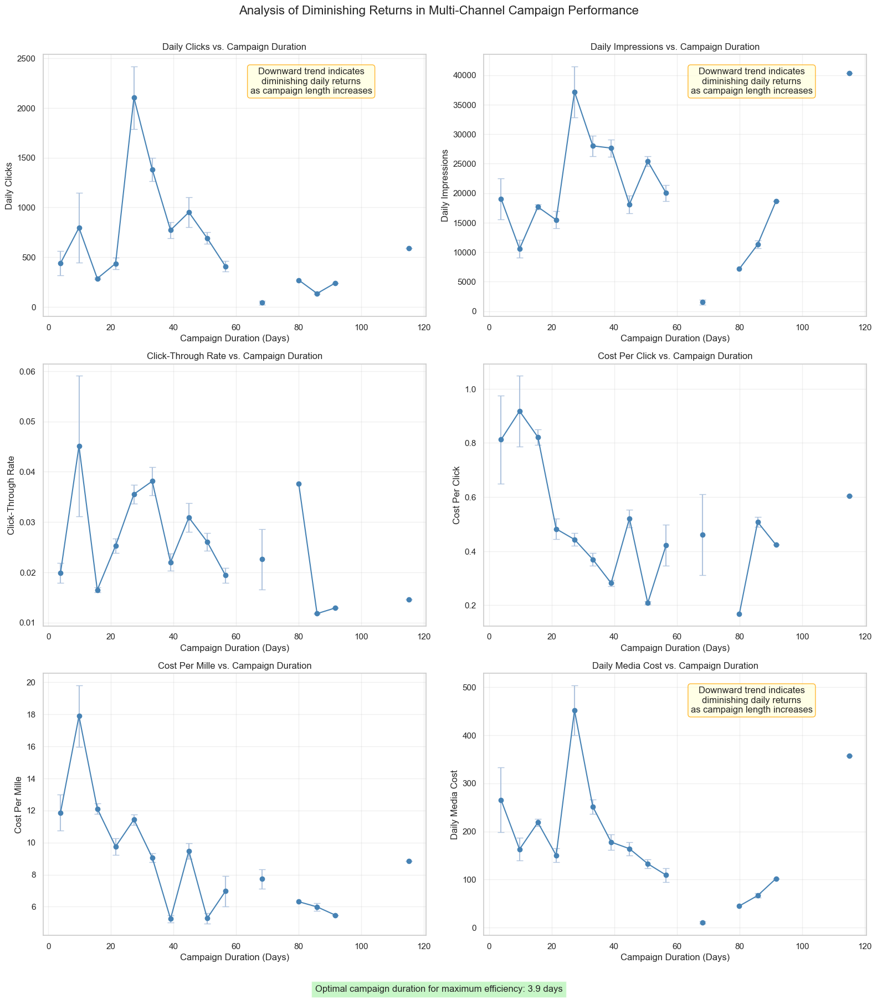

+------------------+----------------+----------+---------------------+----------+--------------+----------+--------------+----------+-------+----------------+------------------+
| Duration Range   |   Daily Clicks | Change   |   Daily Impressions | Change   | Daily Cost   | Change   |   Efficiency | Change   | CTR   |   Avg Channels |   Campaign Count |
+==================+================+==========+=====================+==========+==============+==========+==============+==========+=======+================+==================+
| 1.0-24.0         |          362.4 | N/A      |               16934 | N/A      | $205.56      | N/A      |     0.258067 | N/A      | 2.04% |          260.3 |              368 |
+------------------+----------------+----------+---------------------+----------+--------------+----------+--------------+----------+-------+----------------+------------------+
| 25.0-47.0        |           1306 | 260.4%   |               28221 | 66.7%    | $264.19      | 28.5%    |   

C:\Users\USER\AppData\Local\Temp\ipykernel_15556\1685425145.py:196: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  summary = campaign_data.groupby(duration_ranges).agg({
C:\Users\USER\AppData\Local\Temp\ipykernel_15556\1685425145.py:279: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  channel_impact = campaign_data.groupby([


In [40]:
# Step 1: First, correctly calculate the campaign duration for each campaign_item_id
# This requires finding the start and end dates for each campaign across all its channels
# Since we don't have the actual dates, we'll use no_of_days for each channel to estimate total duration

# Assuming df has these columns: campaign_item_id, channel, no_of_days, clicks, impressions, media_cost_usd, etc.
# Let's calculate the proper campaign-level metrics

# Calculate campaign duration (assuming we need to account for overlapping channel campaigns)
# For this example, I'll use the maximum no_of_days as an approximation of campaign duration
campaign_durations = df.groupby('campaign_item_id')['no_of_days'].max().reset_index()
campaign_durations.rename(columns={'no_of_days': 'campaign_duration'}, inplace=True)

# Aggregate metrics at the campaign level
campaign_metrics = df.groupby('campaign_item_id').agg({
    'clicks': 'sum',
    'impressions': 'sum',
    'media_cost_usd': 'sum'
}).reset_index()

# Get campaign budget (should be the same for all records of a campaign)
campaign_budgets = df[['campaign_item_id', 'campaign_budget_usd']].drop_duplicates()

# Merge all campaign data
campaign_data = campaign_metrics.merge(campaign_durations, on='campaign_item_id')
campaign_data = campaign_data.merge(campaign_budgets, on='campaign_item_id')

# Calculate campaign-level metrics
campaign_data['CTR'] = (campaign_data['clicks'] / campaign_data['impressions']).replace([np.inf, -np.inf], 0).fillna(0)
campaign_data['CPC'] = (campaign_data['media_cost_usd'] / campaign_data['clicks']).replace([np.inf, -np.inf], 0).fillna(0)
campaign_data['CPM'] = (campaign_data['media_cost_usd'] / campaign_data['impressions'] * 1000).replace([np.inf, -np.inf], 0).fillna(0)

# Calculate daily rates for proper analysis of diminishing returns
campaign_data['daily_clicks'] = campaign_data['clicks'] / campaign_data['campaign_duration']
campaign_data['daily_impressions'] = campaign_data['impressions'] / campaign_data['campaign_duration']
campaign_data['daily_cost'] = campaign_data['media_cost_usd'] / campaign_data['campaign_duration']
campaign_data['efficiency_ratio'] = campaign_data['clicks'] / (campaign_data['media_cost_usd'] * campaign_data['campaign_duration'])

# Create a figure with multiple subplots for analyzing diminishing returns
fig, axes = plt.subplots(3, 2, figsize=(16, 18))
axes = axes.flatten()

# Key metrics to analyze for diminishing returns
metrics = [
    ('daily_clicks', 'Daily Clicks'),
    ('daily_impressions', 'Daily Impressions'),
    ('CTR', 'Click-Through Rate'),
    ('CPC', 'Cost Per Click'),
    ('CPM', 'Cost Per Mille'),
    ('daily_cost', 'Daily Media Cost')
]

# Create bins for duration to analyze trends
num_bins = 20
duration_bins = pd.cut(campaign_data['campaign_duration'], num_bins)

# For each metric, analyze if there are diminishing returns as campaign duration increases
for i, (col, title) in enumerate(metrics):
    if i < len(axes) and col in campaign_data.columns:
        ax = axes[i]

        # Calculate average metric value for each duration bin
        bin_stats = campaign_data.groupby(duration_bins)[col].agg(['mean', 'std', 'count'])
        bin_centers = [((b.left + b.right)/2) for b in bin_stats.index]

        # Calculate standard error for error bars
        bin_stats['se'] = bin_stats['std'] / np.sqrt(bin_stats['count'])

        # Plot the results
        ax.errorbar(
            bin_centers,
            bin_stats['mean'],
            yerr=bin_stats['se'],
            fmt='o-',
            color='steelblue',
            ecolor='lightsteelblue',
            capsize=4
        )

        # Add a smooth trend line to better visualize diminishing returns
        try:
            # Use LOWESS smoothing for the trend
            lowess = stats.lowess(bin_stats['mean'].fillna(0), bin_centers, frac=0.5)
            ax.plot(lowess[:, 0], lowess[:, 1], 'r-', linewidth=2, label='Trend')

            # Check if there are diminishing returns
            # Calculate percentage change between consecutive points
            x = lowess[:, 0]
            y = lowess[:, 1]

            # Calculate first derivative (rate of change)
            derivatives = np.diff(y) / np.diff(x)

            # If predominantly decreasing derivatives, we have diminishing returns
            diminishing = np.sum(np.diff(derivatives) < 0) > len(derivatives) * 0.5

            # Mark diminishing returns on the plot
            if diminishing and ('daily' in col or col == 'efficiency_ratio'):
                ax.set_title(f"{title} vs. Campaign Duration\n(Shows Diminishing Returns)", color='darkred')
            else:
                ax.set_title(f"{title} vs. Campaign Duration")
        except:
            ax.set_title(f"{title} vs. Campaign Duration")

        ax.set_xlabel('Campaign Duration (Days)')
        ax.set_ylabel(title)
        ax.grid(True, alpha=0.3)

        # Annotate the plot with key insights
        if 'daily' in col:
            ax.annotate(
                "Downward trend indicates\ndiminishing daily returns\nas campaign length increases",
                xy=(0.7, 0.85),
                xycoords='axes fraction',
                bbox=dict(boxstyle="round,pad=0.3", fc="lightyellow", ec="orange", alpha=0.8),
                ha='center'
            )

# Calculate channel count per campaign
channel_counts = df.groupby('campaign_item_id').size().reset_index(name='channel_count')
campaign_data = campaign_data.merge(channel_counts, on='campaign_item_id')

# Plot efficiency ratio vs duration with color representing channel count
if len(axes) > len(metrics):
    ax = axes[len(metrics)]

    # Scatter plot of efficiency ratio vs duration
    scatter = ax.scatter(
        campaign_data['campaign_duration'],
        campaign_data['efficiency_ratio'],
        c=campaign_data['channel_count'],
        cmap='viridis',
        alpha=0.6,
        edgecolor='w',
        s=80
    )

    # Add trend line
    try:
        # Group by duration bins
        bin_stats = campaign_data.groupby(duration_bins)['efficiency_ratio'].mean()
        bin_centers = [((b.left + b.right)/2) for b in bin_stats.index]

        # Use LOWESS smoothing
        lowess = stats.lowess(bin_stats.fillna(0), bin_centers, frac=0.5)
        ax.plot(lowess[:, 0], lowess[:, 1], 'r-', linewidth=2, label='Trend')
    except:
        pass

    ax.set_title('Efficiency Ratio vs. Campaign Duration by Channel Count')
    ax.set_xlabel('Campaign Duration (Days)')
    ax.set_ylabel('Efficiency Ratio (Clicks per Dollar per Day)')
    ax.grid(True, alpha=0.3)

    # Add color bar
    cbar = plt.colorbar(scatter, ax=ax)
    cbar.set_label('Number of Channels in Campaign')

# Calculate optimal campaign duration based on maximum efficiency
bin_efficiency = campaign_data.groupby(duration_bins)['efficiency_ratio'].mean()
optimal_duration_bin = bin_efficiency.idxmax()
optimal_duration = (optimal_duration_bin.left + optimal_duration_bin.right) / 2

# Calculate average performance metrics by duration and channel count
# This helps identify if more channels mitigate diminishing returns
duration_channel_analysis = campaign_data.groupby([
    pd.cut(campaign_data['campaign_duration'], 5),  # 5 duration bins
    pd.cut(campaign_data['channel_count'], 3)      # 3 channel count bins
]).agg({
    'daily_clicks': 'mean',
    'daily_impressions': 'mean',
    'daily_cost': 'mean',
    'efficiency_ratio': 'mean',
    'CTR': 'mean',
    'campaign_item_id': 'count'  # count of campaigns
}).reset_index()

duration_channel_analysis.columns = [
    'duration_bin', 'channel_count_bin',
    'daily_clicks', 'daily_impressions', 'daily_cost',
    'efficiency_ratio', 'ctr', 'campaign_count'
]

# Add text showing optimal duration
plt.figtext(0.5, 0.01,
            f"Optimal campaign duration for maximum efficiency: {optimal_duration:.1f} days",
            ha="center",
            bbox={"facecolor":"lightgreen", "alpha":0.5, "pad":5})

plt.tight_layout(rect=[0, 0.03, 1, 0.98])
plt.suptitle('Analysis of Diminishing Returns in Multi-Channel Campaign Performance', fontsize=16, y=0.999)
plt.subplots_adjust(top=0.95)
plt.show()

# Create a summary table of marginal returns by campaign duration
duration_ranges = pd.cut(campaign_data['campaign_duration'], 5)  # 5 duration ranges
summary = campaign_data.groupby(duration_ranges).agg({
    'daily_clicks': 'mean',
    'daily_impressions': 'mean',
    'daily_cost': 'mean',
    'efficiency_ratio': 'mean',
    'CTR': 'mean',
    'channel_count': 'mean',
    'campaign_duration': ['min', 'max', 'count']
}).reset_index()

# Flatten multi-level columns
summary.columns = [
    'duration_range', 'daily_clicks', 'daily_impressions', 'daily_cost',
    'efficiency_ratio', 'ctr', 'avg_channels', 'min_days', 'max_days', 'campaign_count'
]

# Calculate percent change to show diminishing returns more clearly
summary_data = []
prev_daily_clicks = None
prev_daily_impressions = None
prev_daily_cost = None
prev_efficiency = None

for _, row in summary.iterrows():
    duration_range = row['duration_range']
    daily_clicks = row['daily_clicks']
    daily_impressions = row['daily_impressions']
    daily_cost = row['daily_cost']
    efficiency = row['efficiency_ratio']
    ctr = row['ctr']
    avg_channels = row['avg_channels']
    min_days = row['min_days']
    max_days = row['max_days']
    count = row['campaign_count']

    if prev_daily_clicks is not None:
        clicks_change = (daily_clicks - prev_daily_clicks) / prev_daily_clicks * 100
        impressions_change = (daily_impressions - prev_daily_impressions) / prev_daily_impressions * 100
        cost_change = (daily_cost - prev_daily_cost) / prev_daily_cost * 100
        efficiency_change = (efficiency - prev_efficiency) / prev_efficiency * 100
    else:
        clicks_change = None
        impressions_change = None
        cost_change = None
        efficiency_change = None

    summary_data.append([
        f"{min_days:.1f}-{max_days:.1f}",
        f"{daily_clicks:.1f}",
        f"{clicks_change:.1f}%" if clicks_change is not None else "N/A",
        f"{daily_impressions:.1f}",
        f"{impressions_change:.1f}%" if impressions_change is not None else "N/A",
        f"${daily_cost:.2f}",
        f"{cost_change:.1f}%" if cost_change is not None else "N/A",
        f"{efficiency:.6f}",
        f"{efficiency_change:.1f}%" if efficiency_change is not None else "N/A",
        f"{ctr*100:.2f}%",
        f"{avg_channels:.1f}",
        count
    ])

    prev_daily_clicks = daily_clicks
    prev_daily_impressions = daily_impressions
    prev_daily_cost = daily_cost
    prev_efficiency = efficiency

# Print the summary table
headers = [
    "Duration Range",
    "Daily Clicks", "Change",
    "Daily Impressions", "Change",
    "Daily Cost", "Change",
    "Efficiency", "Change",
    "CTR",
    "Avg Channels",
    "Campaign Count"
]
print(tabulate(summary_data, headers=headers, tablefmt='grid', numalign="right"))

print(f"\nOptimal campaign duration for maximum efficiency: {optimal_duration:.1f} days")

# Analysis of channel count impact on diminishing returns
print("\nImpact of Channel Count on Campaign Efficiency:")
channel_impact = campaign_data.groupby([
    pd.cut(campaign_data['campaign_duration'], 3),   # 3 duration categories
    pd.qcut(campaign_data['channel_count'], 3, duplicates='drop')  # 3 channel count quantiles
]).agg({
    'efficiency_ratio': 'mean',
    'campaign_item_id': 'count'
}).reset_index()

# Format for display
channel_impact.columns = ['Duration', 'Channel Count', 'Efficiency Ratio', 'Campaign Count']
print(tabulate(channel_impact.values.tolist(),
               headers=['Duration', 'Channel Count', 'Efficiency Ratio', 'Campaign Count'],
               tablefmt='grid'))

Feature relationships

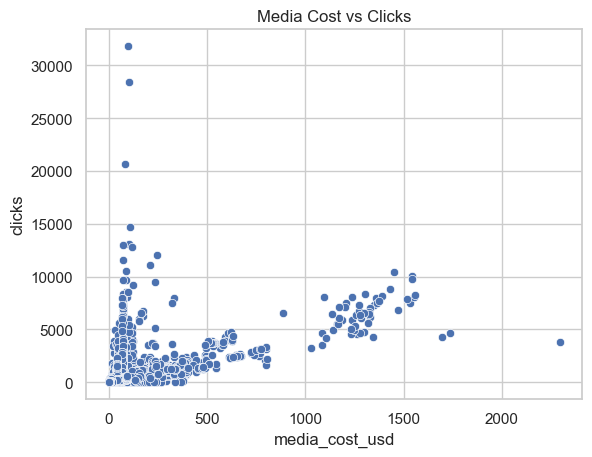

                media_cost_usd    clicks
media_cost_usd        1.000000  0.609699
clicks                0.609699  1.000000


In [41]:
#Checking the linearity for later optimization purposes for Media Cost and Clicks
sns.scatterplot(data=df, x='media_cost_usd', y='clicks')
plt.title('Media Cost vs Clicks')
plt.show()

correlation = df[['media_cost_usd', 'clicks']].corr()
print(correlation)

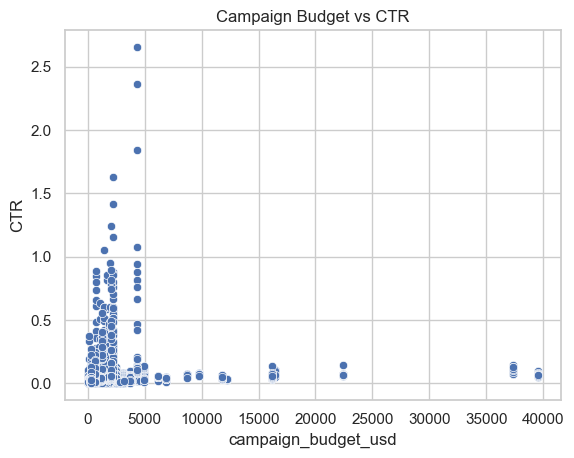

                     campaign_budget_usd       CTR
campaign_budget_usd             1.000000  0.181534
CTR                             0.181534  1.000000


In [42]:
#Campaign budget and CTR
sns.scatterplot(data=df, x='campaign_budget_usd', y='CTR')
plt.title('Campaign Budget vs CTR')
plt.show()

correlation = df[['campaign_budget_usd', 'CTR']].corr()
print(correlation)

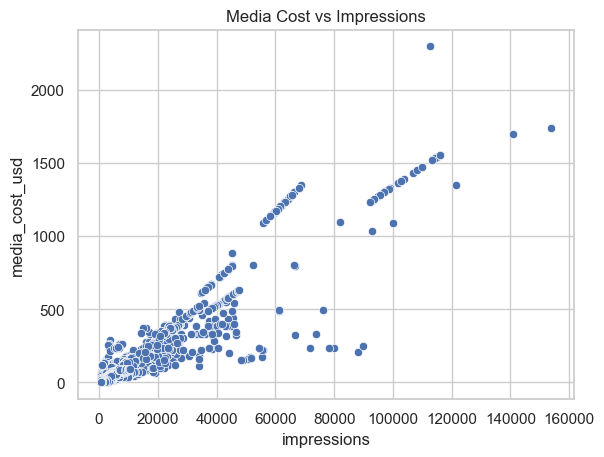

                media_cost_usd  impressions
media_cost_usd        1.000000     0.930322
impressions           0.930322     1.000000


In [43]:
#Checking the linearity of Impressions and Media Cost
sns.scatterplot(data=df, x='impressions', y='media_cost_usd')
plt.title('Media Cost vs Impressions')
plt.show()

correlation = df[['media_cost_usd', 'impressions']].corr()
print(correlation)



    Channel performance

<Axes: xlabel='channel_name'>

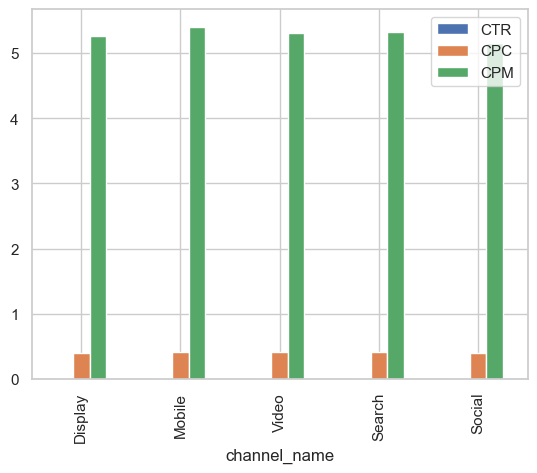

In [44]:
df.groupby('channel_name')[['CTR', 'CPC', 'CPM']].mean().sort_values('CTR', ascending=False).plot(kind='bar')


<Axes: xlabel='channel_name'>

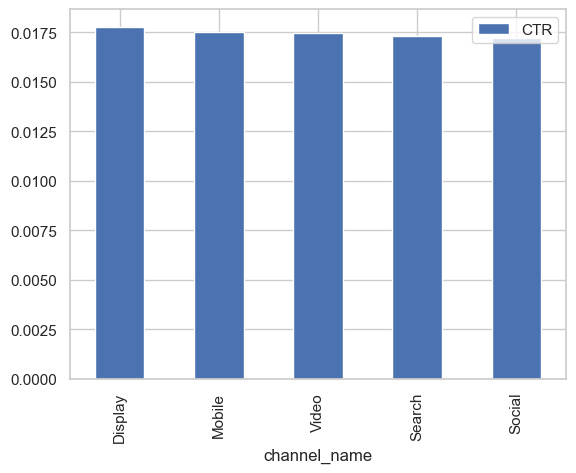

In [45]:
df.groupby('channel_name')[['CTR']].mean().sort_values('CTR', ascending=False).plot(kind='bar')


In [46]:
def calculate_mode(series):
    return series.mode()[0] if not series.mode().empty else np.nan

# Create the summary table for each channel
summary_table = df.groupby('channel_name').agg(
    mean_CPM=('CPM', 'mean'),
    median_CPM=('CPM', 'median'),
    mode_CPM=('CPM', calculate_mode),
    range_CPM=('CPM', lambda x: x.max() - x.min()),

    mean_CTR=('CTR', 'mean'),
    median_CTR=('CTR', 'median'),
    mode_CTR=('CTR', calculate_mode),
    range_CTR=('CTR', lambda x: x.max() - x.min()),

    mean_CPC=('CPC', 'mean'),
    median_CPC=('CPC', 'median'),
    mode_CPC=('CPC', calculate_mode),
    range_CPC=('CPC', lambda x: x.max() - x.min())
)

# Display the table
print(summary_table)

              mean_CPM  median_CPM  mode_CPM   range_CPM  mean_CTR  \
channel_name                                                         
Display       5.261581    2.930385       0.0   75.116830  0.017782   
Mobile        5.403600    2.874550       0.0  128.397470  0.017520   
Search        5.329051    2.978570       0.0   88.045731  0.017306   
Social        5.160996    2.788161       0.0   81.541014  0.017202   
Video         5.312258    2.928997       0.0   86.475760  0.017444   

              median_CTR  mode_CTR  range_CTR  mean_CPC  median_CPC  mode_CPC  \
channel_name                                                                    
Display         0.013740  0.015625   2.363551  0.395550    0.205352       0.0   
Mobile          0.013699  0.013699   2.655090  0.405329    0.204610       0.0   
Search          0.013786  0.005871   0.877682  0.406996    0.207671       0.0   
Social          0.013699  0.017613   1.050942  0.396557    0.197698       0.0   
Video           0.01373

<Figure size 1200x600 with 0 Axes>

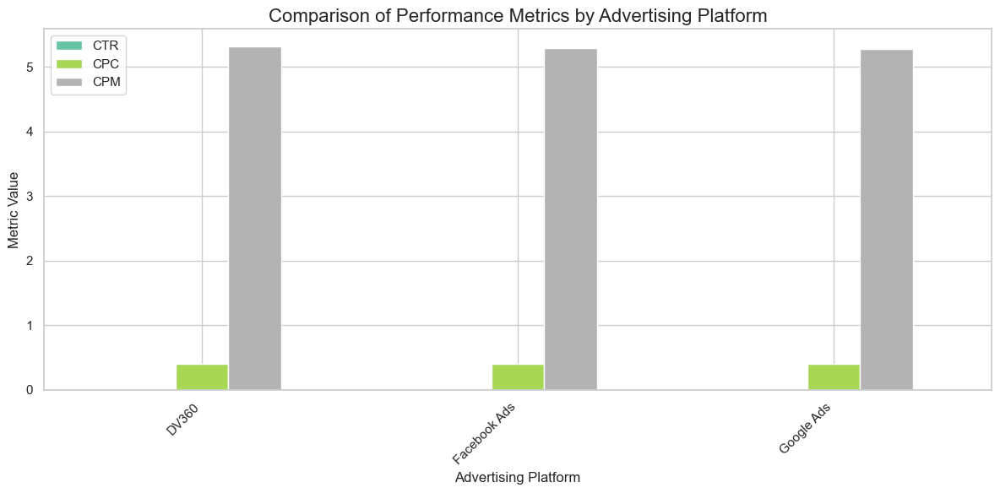

                    CTR    CPC    CPM
ext_service_name                     
DV360             0.018  0.404  5.319
Facebook Ads      0.018  0.400  5.284
Google Ads        0.017  0.402  5.278


In [47]:
#Advertising platform performance
metrics_by_service = df.groupby('ext_service_name')[['CTR', 'CPC', 'CPM']].mean()

# Set up the figure and axis
plt.figure(figsize=(12, 6))

# Plot CTR, CPC, and CPM in a single figure
metrics_by_service.plot(kind='bar', figsize=(12, 6), colormap='Set2')

# Set labels and title
plt.title('Comparison of Performance Metrics by Advertising Platform', fontsize=16)
plt.xlabel('Advertising Platform', fontsize=12)
plt.ylabel('Metric Value', fontsize=12)
plt.xticks(rotation=45, ha='right')

# Display the plot
plt.tight_layout()
plt.show()

metrics_by_service = metrics_by_service.round(3)
print(metrics_by_service)

<Figure size 1200x600 with 0 Axes>

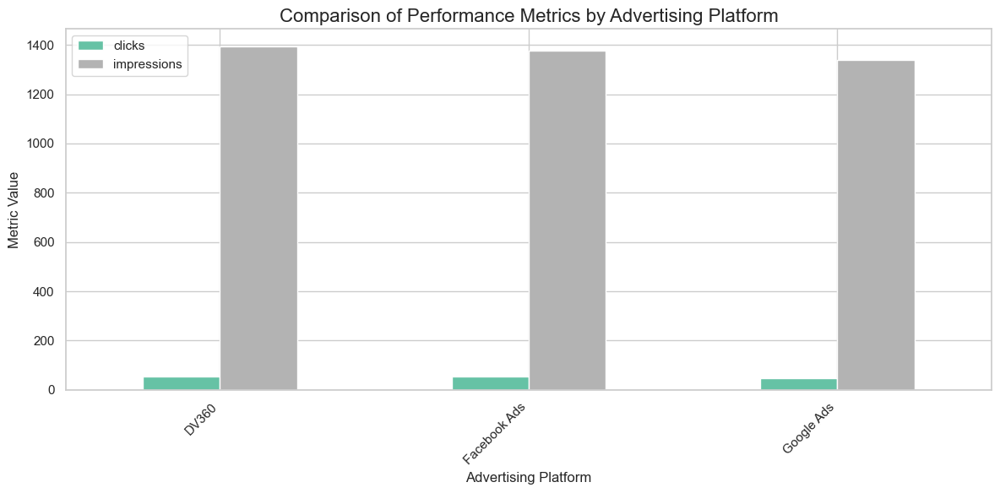

                  clicks  impressions
ext_service_name                     
DV360             55.675     1394.323
Facebook Ads      53.541     1378.011
Google Ads        48.869     1338.111


In [48]:
metrics_by_service = df.groupby('ext_service_name')[['clicks', 'impressions']].mean()
plt.figure(figsize=(12, 6))

# Plot CTR, CPC, and CPM in a single figure
metrics_by_service.plot(kind='bar', figsize=(12, 6), colormap='Set2')

# Set labels and title
plt.title('Comparison of Performance Metrics by Advertising Platform', fontsize=16)
plt.xlabel('Advertising Platform', fontsize=12)
plt.ylabel('Metric Value', fontsize=12)
plt.xticks(rotation=45, ha='right')

# Display the plot
plt.tight_layout()
plt.show()

metrics_by_service = metrics_by_service.round(3)
print(metrics_by_service)

    Target Metric Distributions

<Axes: xlabel='CTR', ylabel='Count'>

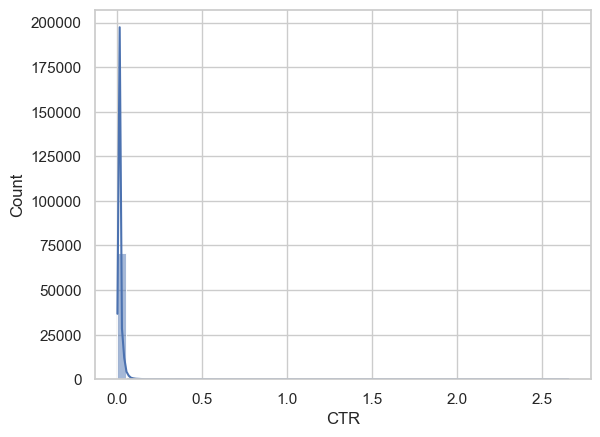

In [49]:
sns.histplot(df['CTR'], bins=50, kde=True)

<Axes: xlabel='CPC', ylabel='Count'>

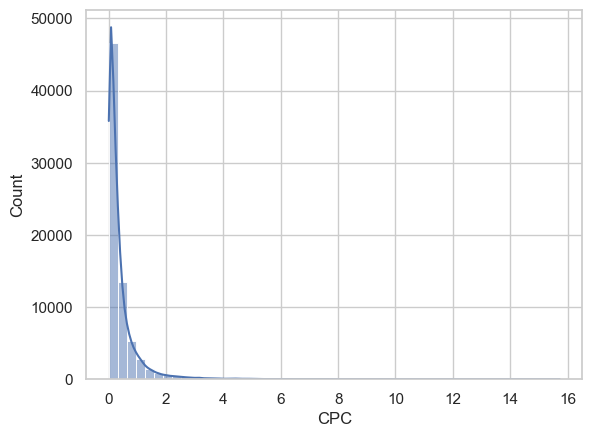

In [50]:
sns.histplot(df['CPC'], bins=50, kde=True)


<Axes: xlabel='CPM', ylabel='Count'>

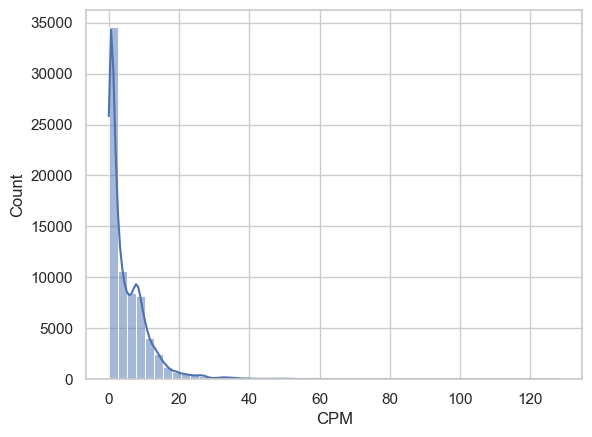

In [51]:
sns.histplot(df['CPM'], bins=50, kde=True)


    Keyword/Tags Analysis

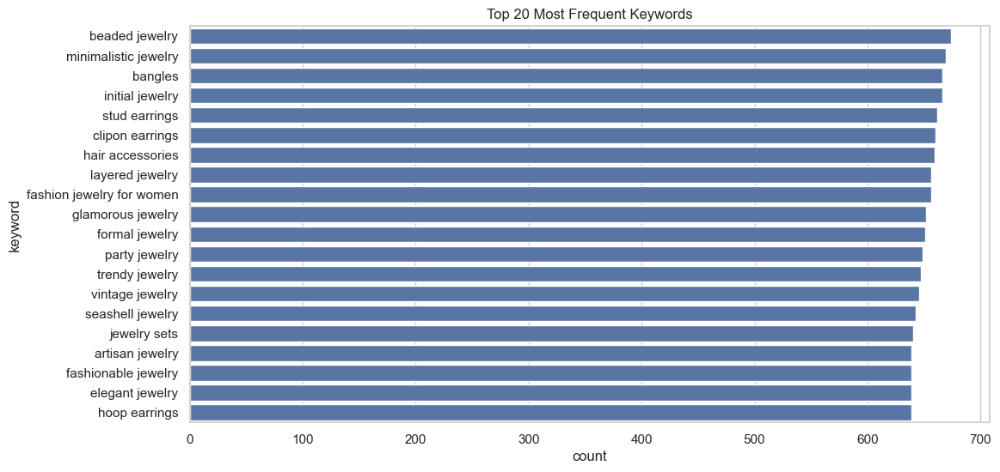

In [52]:
# Flatten all keyword entries
all_keywords = [kw.strip() for sublist in df['keywords_list'].dropna() for kw in sublist if kw.strip()]
keyword_counts = Counter(all_keywords)
top_keywords = keyword_counts.most_common(20)

# Plot
top_kw_df = pd.DataFrame(top_keywords, columns=['keyword', 'count'])
plt.figure(figsize=(12,6))
sns.barplot(x='count', y='keyword', data=top_kw_df)
plt.title("Top 20 Most Frequent Keywords")
plt.show()


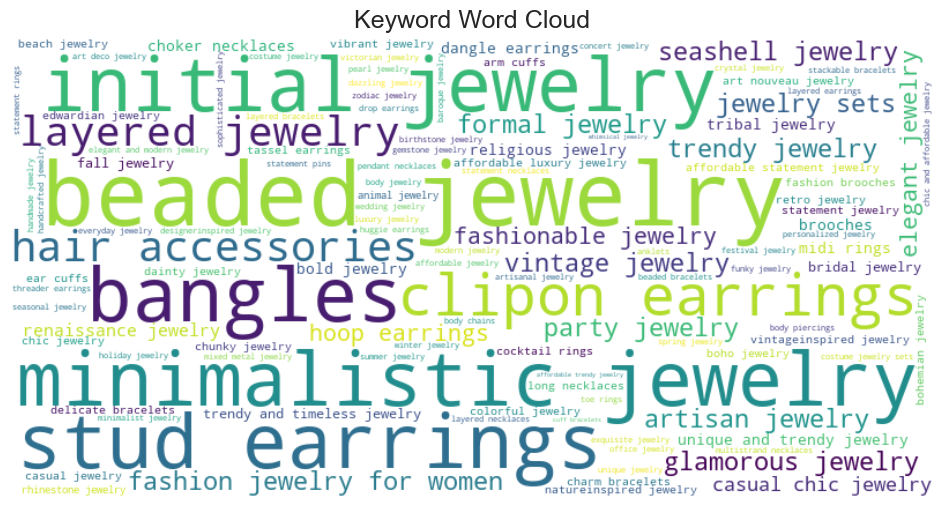

In [53]:
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(keyword_counts)

plt.figure(figsize=(12, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title("Keyword Word Cloud", fontsize=18)
plt.show()



C:\Users\USER\AppData\Local\Temp\ipykernel_15556\1133774273.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=keyword_ctr, x='CTR', y='keywords_list', palette='viridis')


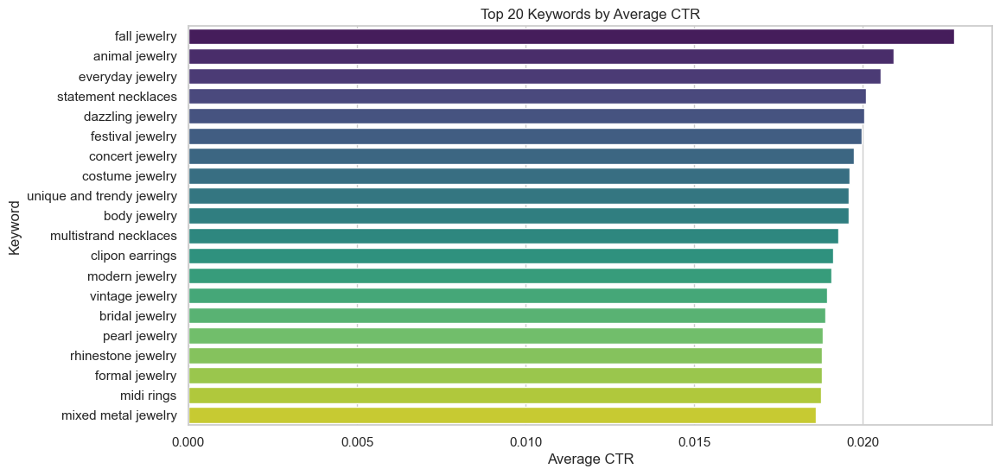

In [54]:
# Explode the dataframe so each row is one keyword
keywords_exploded = df.explode('keywords_list')
keywords_exploded['keywords_list'] = keywords_exploded['keywords_list'].str.strip()

# Calculate CTR
keywords_exploded['CTR'] = keywords_exploded['clicks'] / keywords_exploded['impressions']

# Group by keyword
keyword_ctr = (
    keywords_exploded.groupby('keywords_list')['CTR']
    .mean()
    .sort_values(ascending=False)
    .head(20)
    .reset_index()
)

# Plot top CTR-driving keywords
plt.figure(figsize=(12,6))
sns.barplot(data=keyword_ctr, x='CTR', y='keywords_list', palette='viridis')
plt.title("Top 20 Keywords by Average CTR")
plt.xlabel("Average CTR")
plt.ylabel("Keyword")
plt.show()


In [55]:
# Group by keyword and calculate the mean of the metrics
keyword_metrics = keywords_exploded.groupby('keywords_list')[['CTR', 'CPC', 'CPM']].mean()

# Sort by CTR, CPC, or CPM to find top keywords (example by CTR)
top_keywords = keyword_metrics.sort_values(by='CTR', ascending=False).head(20)
top_keywords = top_keywords.round(4)

# Reset index for easy reading
top_keywords = top_keywords.reset_index()
top_keywords

,keywords_list,CTR,CPC,CPM
0,fall jewelry,0.0227,0.4043,5.1521
1,animal jewelry,0.0209,0.4122,5.1982
2,everyday jewelry,0.0205,0.3972,5.3997
3,statement necklaces,0.0201,0.3786,5.1570
4,dazzling jewelry,0.0200,0.4175,5.1901
5,festival jewelry,0.0200,0.3645,4.7205
6,concert jewelry,0.0197,0.3763,5.3801
7,costume jewelry,0.0196,0.3436,4.7840
8,unique and trendy jewelry,0.0196,0.3962,5.2208
9,body jewelry,0.0196,0.3478,4.8328


Model specific feature analysis


🔎 Media Cost vs Impressions
• Pearson Correlation (ρ): 0.930
• R² (Polynomial deg 2): 0.874
• Fit Equation: y = -0.012x² + 82.350x + 426.157


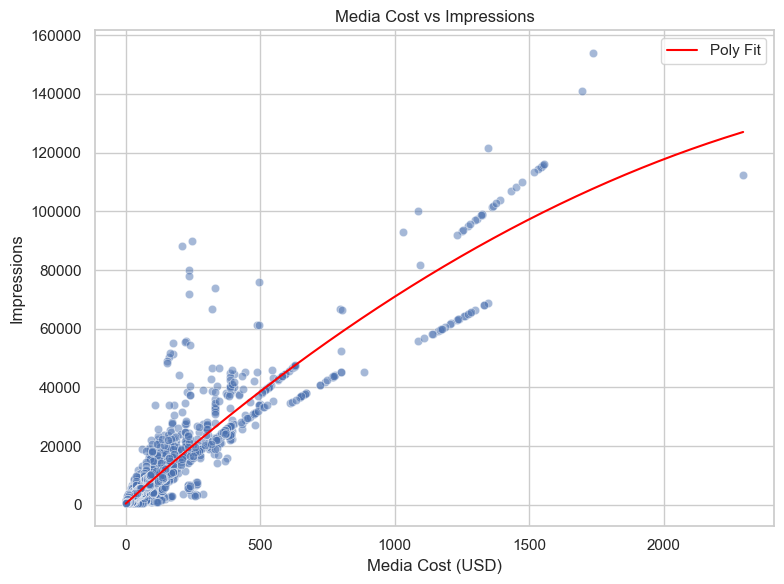


🔎 Media Cost vs CTR
• Pearson Correlation (ρ): 0.202
• R² (Polynomial deg 2): 0.076
• Fit Equation: y = -0.000x² + 0.000x + 0.014


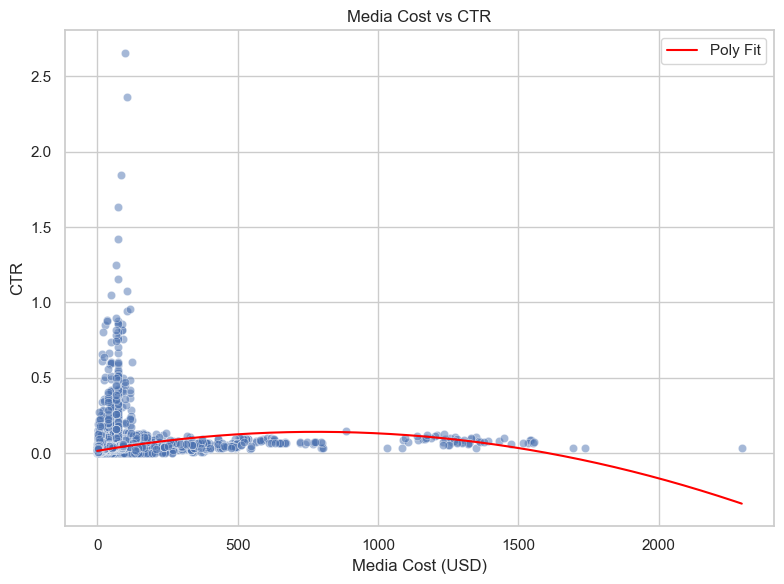


📈 Media Cost vs Impressions (Log-Log)
• Pearson Correlation (log-log): 0.762
• R² (log-log fit): 0.580
• Fit Equation: log(y) = 0.278·log(x) + 2.835


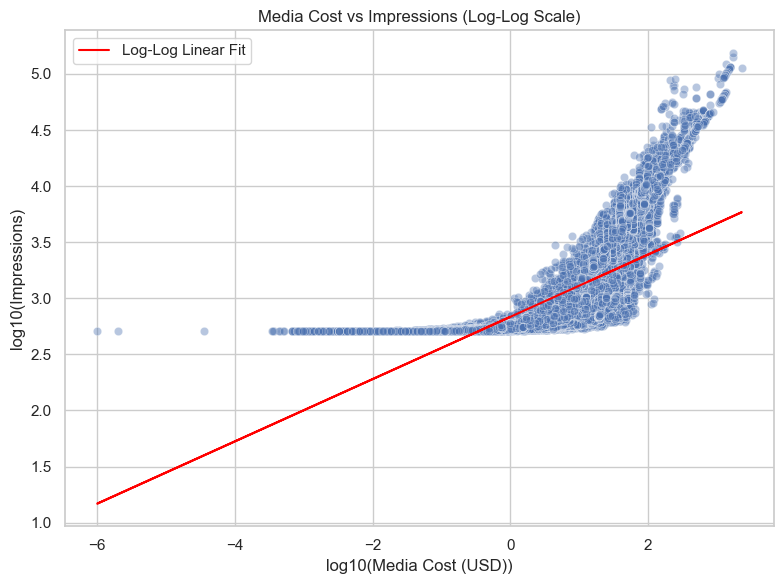


📈 Media Cost vs CTR (Log-Log)
• Pearson Correlation (log-log): 0.449
• R² (log-log fit): 0.202
• Fit Equation: log(y) = 0.140·log(x) + -1.906


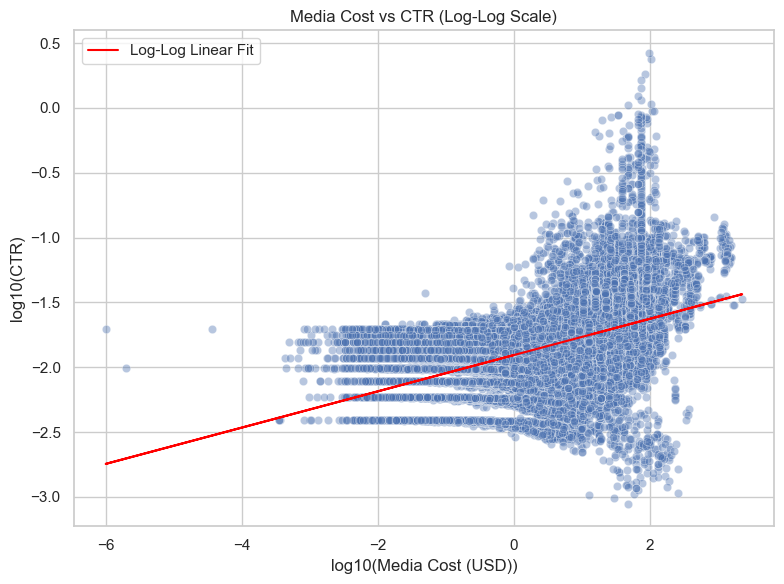

In [56]:
#Media Cost vs Objective Variables (Impression and CTR)
def analyze_and_plot(x, y, title, xlabel, ylabel, degree=2, log_scale=False):
    # Drop NaNs
    mask = (~np.isnan(x)) & (~np.isnan(y))
    x = np.array(x[mask])
    y = np.array(y[mask])

    # Correlation
    corr, _ = pearsonr(x, y)

    # Polynomial Fit
    X = x.reshape(-1, 1)
    poly = PolynomialFeatures(degree)
    X_poly = poly.fit_transform(X)
    model = LinearRegression().fit(X_poly, y)
    y_pred = model.predict(X_poly)
    r2 = r2_score(y, y_pred)

    # Equation (for degree=2 only)
    if degree == 2:
        b0 = model.intercept_
        b1, b2 = model.coef_[1], model.coef_[2]
        equation = f"y = {b2:.3f}x² + {b1:.3f}x + {b0:.3f}"
    else:
        equation = "Equation too complex for display"

    # Print summary
    print(f"\n🔎 {title}")
    print(f"• Pearson Correlation (ρ): {corr:.3f}")
    print(f"• R² (Polynomial deg {degree}): {r2:.3f}")
    print(f"• Fit Equation: {equation}")

    # Plot
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=x, y=y, alpha=0.5)

    # Prediction Line
    x_range = np.linspace(min(x), max(x), 300).reshape(-1, 1)
    y_fit = model.predict(poly.transform(x_range))
    plt.plot(x_range, y_fit, color='red', label='Poly Fit')

    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    if log_scale:
        plt.xscale('log')
        plt.yscale('log')
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

# Now run this on the two key relationships

# 1. Media Cost vs Impressions
analyze_and_plot(df['media_cost_usd'], df['impressions'],
                 "Media Cost vs Impressions",
                 "Media Cost (USD)", "Impressions")

# 2. Media Cost vs CTR
df['CTR'] = (df['clicks'] / df['impressions']).replace([np.inf, -np.inf], 0).fillna(0)
analyze_and_plot(df['media_cost_usd'], df['CTR'],
                 "Media Cost vs CTR",
                 "Media Cost (USD)", "CTR")

def analyze_loglog(x, y, title, xlabel, ylabel):
    # Filter + Log-transform (avoid log(0) by filtering)
    mask = (x > 0) & (y > 0)
    x_log = np.log10(x[mask])
    y_log = np.log10(y[mask])

    # Correlation
    corr, _ = pearsonr(x_log, y_log)

    # Linear regression in log-log space
    model = LinearRegression().fit(x_log.values.reshape(-1, 1), y_log)
    y_pred = model.predict(x_log.values.reshape(-1, 1))
    r2 = r2_score(y_log, y_pred)

    slope = model.coef_[0]
    intercept = model.intercept_
    equation = f"log(y) = {slope:.3f}·log(x) + {intercept:.3f}"

    # Print summary
    print(f"\n📈 {title} (Log-Log)")
    print(f"• Pearson Correlation (log-log): {corr:.3f}")
    print(f"• R² (log-log fit): {r2:.3f}")
    print(f"• Fit Equation: {equation}")

    # Plot
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=x_log, y=y_log, alpha=0.4)
    plt.plot(x_log, y_pred, color='red', label='Log-Log Linear Fit')

    plt.title(f"{title} (Log-Log Scale)")
    plt.xlabel(f"log10({xlabel})")
    plt.ylabel(f"log10({ylabel})")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

# Run it on your key metrics:

# Media Cost vs Impressions (Log-Log)
analyze_loglog(df['media_cost_usd'], df['impressions'],
               "Media Cost vs Impressions",
               "Media Cost (USD)", "Impressions")

# Media Cost vs CTR (Log-Log)
df['CTR'] = (df['clicks'] / df['impressions']).replace([np.inf, -np.inf], 0).fillna(0)
analyze_loglog(df['media_cost_usd'], df['CTR'],
               "Media Cost vs CTR",
               "Media Cost (USD)", "CTR")



The analysis provide the following key judgements:
1. There is a very strong relationship between Media Cost and Impressions (R2=0.87), and a strong increasing relationship (p=0.93) -> the higher the media cost, the more impressions
2. When normalized in Log, Media Cost and CTR have a low correlation (R2=0.2), but has a moderate increasing relationship (p=0.449) -> the media cost does not influence CTR, but since they grow toghether it indicates there might be something else impacting both or an element that mediates the relationship (maybe clicks?)

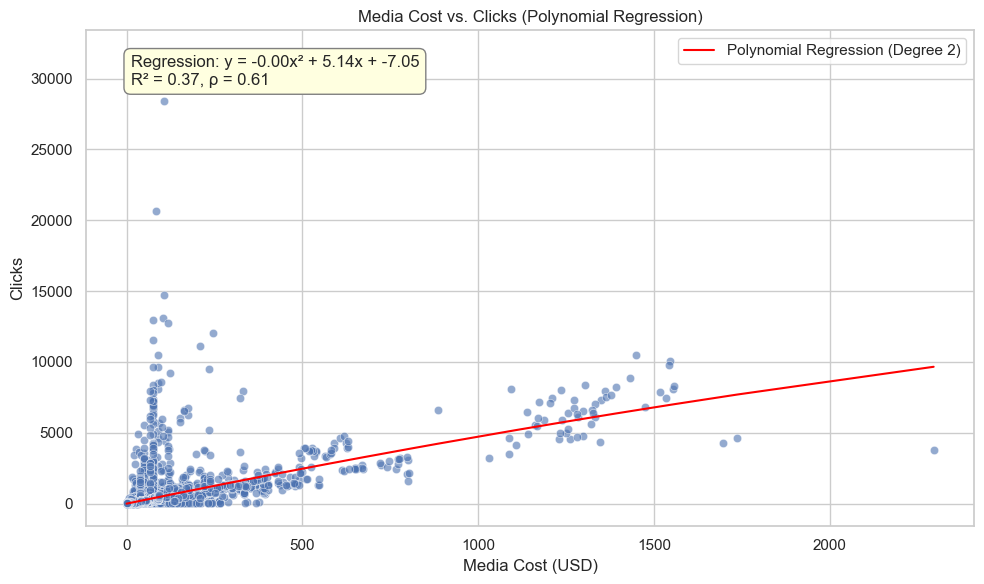

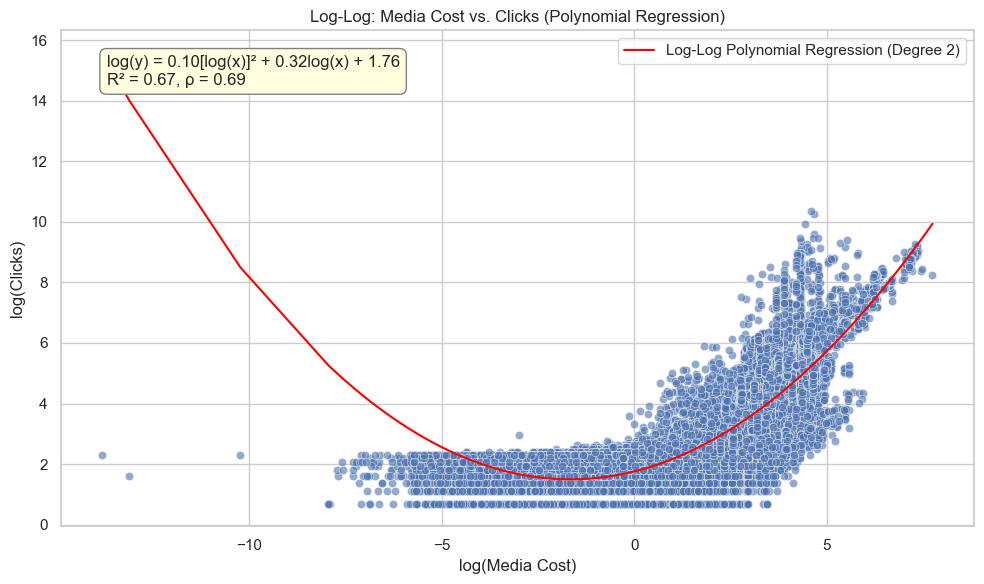

In [57]:
# Drop NaNs and filter out zeroes
df_plot = df[['media_cost_usd', 'clicks']].dropna()
df_plot = df_plot[(df_plot['media_cost_usd'] > 0) & (df_plot['clicks'] > 0)]

# --- POLYNOMIAL REGRESSION (Original Space) ---
X = df_plot['media_cost_usd'].values.reshape(-1, 1)
y = df_plot['clicks'].values

poly = PolynomialFeatures(degree=2)
X_poly = poly.fit_transform(X)

model_poly = LinearRegression()
model_poly.fit(X_poly, y)
y_pred_poly = model_poly.predict(X_poly)

r2_poly = r2_score(y, y_pred_poly)
p_corr, _ = pearsonr(df_plot['media_cost_usd'], df_plot['clicks'])

intercept_poly = model_poly.intercept_
coef_1 = model_poly.coef_[1]
coef_2 = model_poly.coef_[2]

# Plot original polynomial regression
plt.figure(figsize=(10, 6))
sns.scatterplot(x='media_cost_usd', y='clicks', data=df_plot, alpha=0.6)

X_sorted = np.sort(X.flatten())
X_sorted_poly = poly.transform(X_sorted.reshape(-1, 1))
y_sorted_pred = model_poly.predict(X_sorted_poly)
plt.plot(X_sorted, y_sorted_pred, color='red', label='Polynomial Regression (Degree 2)')

plt.title('Media Cost vs. Clicks (Polynomial Regression)')
plt.xlabel('Media Cost (USD)')
plt.ylabel('Clicks')
plt.text(0.05, 0.95,
         f'Regression: y = {coef_2:.2f}x² + {coef_1:.2f}x + {intercept_poly:.2f}\n'
         f'R² = {r2_poly:.2f}, ρ = {p_corr:.2f}',
         transform=plt.gca().transAxes,
         fontsize=12, verticalalignment='top',
         bbox=dict(boxstyle='round,pad=0.4', fc='lightyellow', ec='gray', lw=1))

plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# --- POLYNOMIAL REGRESSION (Log-Log Space) ---
df_plot['log_media_cost'] = np.log(df_plot['media_cost_usd'])
df_plot['log_clicks'] = np.log(df_plot['clicks'])

X_log = df_plot['log_media_cost'].values.reshape(-1, 1)
y_log = df_plot['log_clicks'].values

poly_log = PolynomialFeatures(degree=2)
X_log_poly = poly_log.fit_transform(X_log)

model_log_poly = LinearRegression()
model_log_poly.fit(X_log_poly, y_log)
y_log_pred_poly = model_log_poly.predict(X_log_poly)

r2_log_poly = r2_score(y_log, y_log_pred_poly)
p_corr_log, _ = pearsonr(df_plot['log_media_cost'], df_plot['log_clicks'])

intercept_log_poly = model_log_poly.intercept_
coef_log_1 = model_log_poly.coef_[1]
coef_log_2 = model_log_poly.coef_[2]

# Plot log-log polynomial regression
plt.figure(figsize=(10, 6))
sns.scatterplot(x='log_media_cost', y='log_clicks', data=df_plot, alpha=0.6)

X_log_sorted = np.sort(X_log.flatten())
X_log_sorted_poly = poly_log.transform(X_log_sorted.reshape(-1, 1))
y_log_sorted_pred = model_log_poly.predict(X_log_sorted_poly)
plt.plot(X_log_sorted, y_log_sorted_pred, color='red', label='Log-Log Polynomial Regression (Degree 2)')

plt.title('Log-Log: Media Cost vs. Clicks (Polynomial Regression)')
plt.xlabel('log(Media Cost)')
plt.ylabel('log(Clicks)')
plt.text(0.05, 0.95,
         f'log(y) = {coef_log_2:.2f}[log(x)]² + {coef_log_1:.2f}log(x) + {intercept_log_poly:.2f}\n'
         f'R² = {r2_log_poly:.2f}, ρ = {p_corr_log:.2f}',
         transform=plt.gca().transAxes,
         fontsize=12, verticalalignment='top',
         bbox=dict(boxstyle='round,pad=0.4', fc='lightyellow', ec='gray', lw=1))

plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


The Media Cost vs Clicks shows:
1. Moderate R2 (for log-log: 0.48, for linear relationship: 0.37), High p (for log-log 0.69, for linear relationship 0.61)
2. Indicate that while they tend to grow directly proportional with each other, they have a moderate correlationtion to each other

In [62]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
import statsmodels.formula.api as smf

# Assume your data is in a DataFrame named `df`
# Columns: 'media_cost_usd', 'clicks', 'ext_service_name', 'duration_days'

# Create log-transformed variables
df['log_media_cost'] = np.log1p(df['media_cost_usd'])  # log(1 + x) to handle zero
df['log_clicks'] = np.log1p(df['clicks'])

# =========================
# 1. Ext_Service_Name-Specific MediaCost-to-Clicks Relationships
# =========================

# (a) Log-Log Model per ext_service_name
log_log_models = {}
for service in df['ext_service_name'].unique():
    subset = df[df['ext_service_name'] == service]
    model = smf.ols('log_clicks ~ log_media_cost', data=subset).fit()
    log_log_models[service] = model
    print(f"\nLog-Log model for {service}:\n", model.summary())

# (b) Polynomial Regression per ext_service_name
poly_models = {}
for service in df['ext_service_name'].unique():
    subset = df[df['ext_service_name'] == service].copy()
    subset['media_cost_squared'] = subset['media_cost_usd'] ** 2
    model = smf.ols('clicks ~ media_cost_usd + media_cost_squared', data=subset).fit()
    poly_models[service] = model
    print(f"\nPolynomial model for {service}:\n", model.summary())

# =========================
# 2. Media Cost Threshold Effects (Piecewise Linear)
# =========================

# Define thresholds
low_media_cost_threshold = 1000
high_media_cost_threshold = 5000

# Create piecewise features
df['low_media_cost'] = np.where(df['media_cost_usd'] <= low_media_cost_threshold, df['media_cost_usd'], low_media_cost_threshold)
df['mid_media_cost'] = np.where((df['media_cost_usd'] > low_media_cost_threshold) & (df['media_cost_usd'] <= high_media_cost_threshold),
                                df['media_cost_usd'] - low_media_cost_threshold, 0)
df['high_media_cost'] = np.where(df['media_cost_usd'] > high_media_cost_threshold, df['media_cost_usd'] - high_media_cost_threshold, 0)

piecewise_model = smf.ols('clicks ~ low_media_cost + mid_media_cost + high_media_cost', data=df).fit()
print("\nPiecewise Linear Model:\n", piecewise_model.summary())

# =========================
# 3. MediaCost-Duration Interactions
# =========================

interaction_model = smf.ols('clicks ~ media_cost_usd * no_of_days', data=df).fit()
print("\nMedia Cost-Duration Interaction Model:\n", interaction_model.summary())




Log-Log model for Facebook Ads:
                             OLS Regression Results                            
Dep. Variable:             log_clicks   R-squared:                       0.647
Model:                            OLS   Adj. R-squared:                  0.647
Method:                 Least Squares   F-statistic:                 4.449e+04
Date:                Mon, 28 Apr 2025   Prob (F-statistic):               0.00
Time:                        12:58:16   Log-Likelihood:                -25599.
No. Observations:               24275   AIC:                         5.120e+04
Df Residuals:                   24273   BIC:                         5.122e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept 

C:\Users\USER\PyCharmMiscProject\.venv\Lib\site-packages\statsmodels\regression\linear_model.py:1966: RuntimeWarning: divide by zero encountered in scalar divide
  return np.sqrt(eigvals[0]/eigvals[-1])


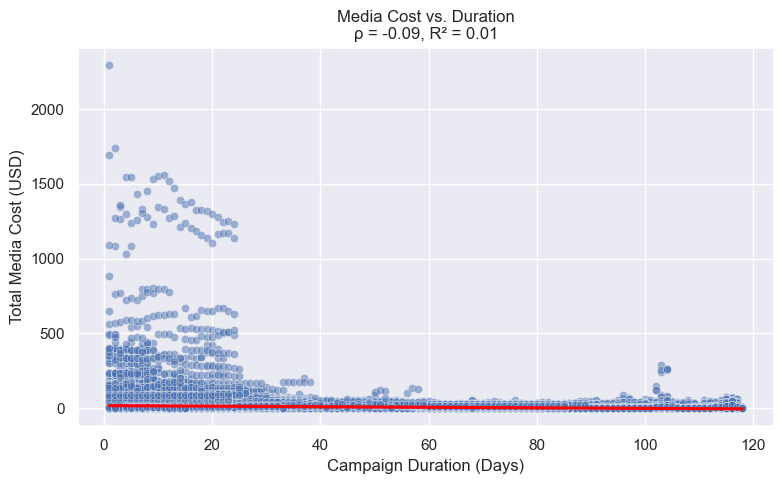

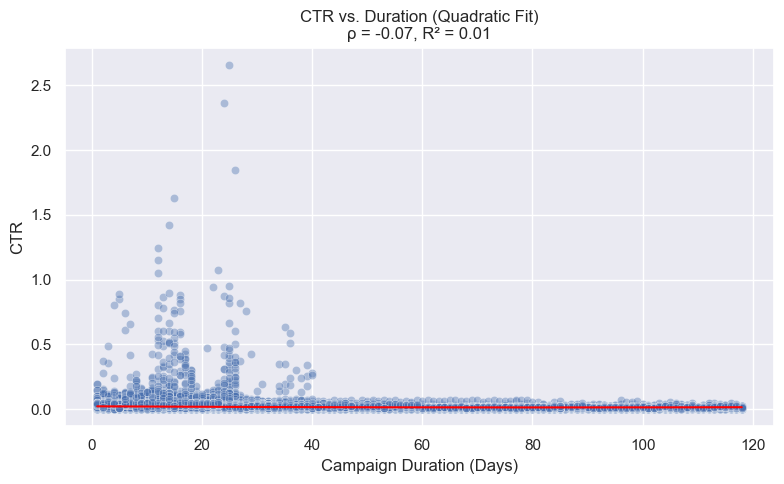

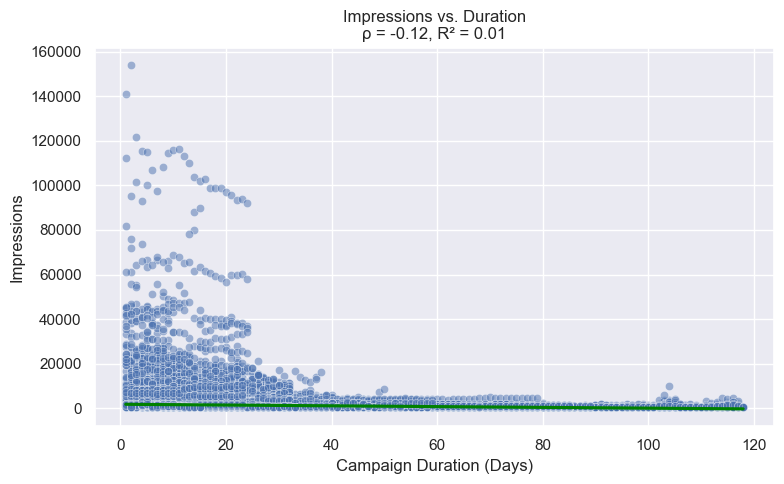

In [59]:
# Media Cost vs Duration
# Prepare data
df_duration = df[(df['media_cost_usd'] > 0) & (df['no_of_days'] > 0)].copy()

# Linear regression
X = df_duration[['no_of_days']]
y = df_duration['media_cost_usd']
model = LinearRegression().fit(X, y)
r_squared = model.score(X, y)
corr, _ = pearsonr(df_duration['no_of_days'], df_duration['media_cost_usd'])

# Plot
plt.figure(figsize=(8, 5))
sns.scatterplot(x='no_of_days', y='media_cost_usd', data=df_duration, alpha=0.5)
sns.regplot(x='no_of_days', y='media_cost_usd', data=df_duration, scatter=False, color='red')
plt.title(f"Media Cost vs. Duration\nρ = {corr:.2f}, R² = {r_squared:.2f}")
plt.xlabel("Campaign Duration (Days)")
plt.ylabel("Total Media Cost (USD)")
plt.grid(True)
plt.tight_layout()
plt.show()



# CTR vs. Duration + Curve Fit
# CTR calc
df_duration['CTR'] = (df_duration['clicks'] / df_duration['impressions']).replace([np.inf, -np.inf], 0).fillna(0)

# Correlation + polyfit
ctr_corr, _ = pearsonr(df_duration['no_of_days'], df_duration['CTR'])
ctr_poly = np.polyfit(df_duration['no_of_days'], df_duration['CTR'], 2)
ctr_model = np.poly1d(ctr_poly)

# R² for fit
ctr_pred = ctr_model(df_duration['no_of_days'])
ctr_r2 = r2_score(df_duration['CTR'], ctr_pred)

# Plot
plt.figure(figsize=(8, 5))
sns.scatterplot(x='no_of_days', y='CTR', data=df_duration, alpha=0.4)
plt.plot(sorted(df_duration['no_of_days']), ctr_model(sorted(df_duration['no_of_days'])), color='red')
plt.title(f"CTR vs. Duration (Quadratic Fit)\nρ = {ctr_corr:.2f}, R² = {ctr_r2:.2f}")
plt.xlabel("Campaign Duration (Days)")
plt.ylabel("CTR")
plt.grid(True)
plt.tight_layout()
plt.show()

# Impressions vs Duration
# Correlation + regression
imp_corr, _ = pearsonr(df_duration['no_of_days'], df_duration['impressions'])
imp_model = LinearRegression().fit(X, df_duration['impressions'])
imp_r2 = imp_model.score(X, df_duration['impressions'])

# Plot
plt.figure(figsize=(8, 5))
sns.scatterplot(x='no_of_days', y='impressions', data=df_duration, alpha=0.5)
sns.regplot(x='no_of_days', y='impressions', data=df_duration, scatter=False, color='green')
plt.title(f"Impressions vs. Duration\nρ = {imp_corr:.2f}, R² = {imp_r2:.2f}")
plt.xlabel("Campaign Duration (Days)")
plt.ylabel("Impressions")
plt.grid(True)
plt.tight_layout()
plt.show()




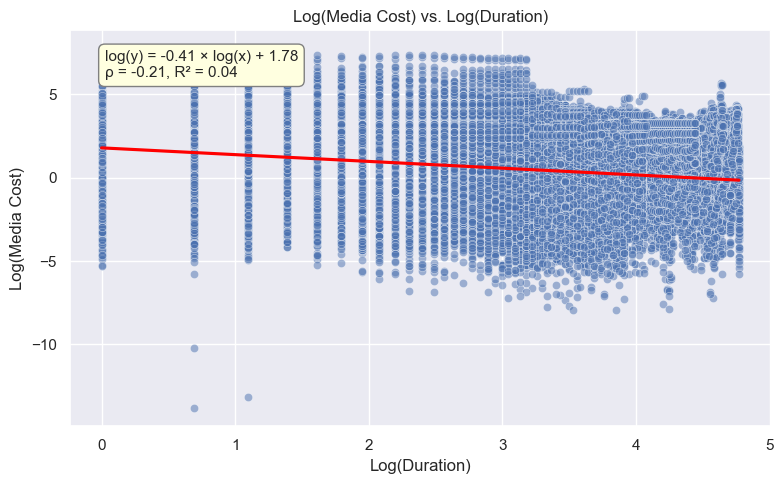

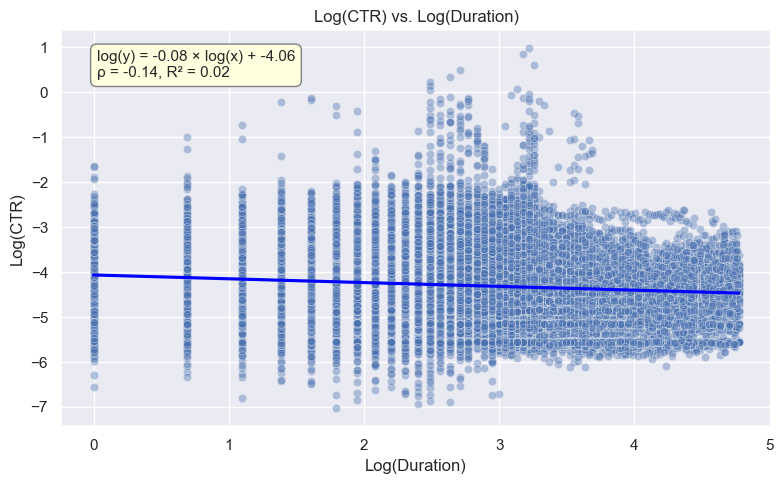

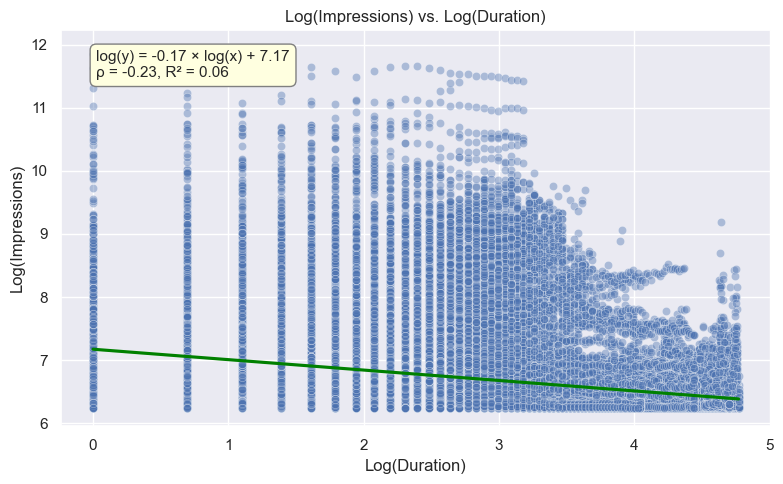

In [60]:
# --- Log(Media Cost) vs. Log(Duration) ---
df_log = df_duration[(df_duration['media_cost_usd'] > 0) & (df_duration['no_of_days'] > 0)].copy()
df_log['log_cost'] = np.log(df_log['media_cost_usd'])
df_log['log_duration'] = np.log(df_log['no_of_days'])

model = LinearRegression().fit(df_log[['log_duration']], df_log['log_cost'])
slope_cost = model.coef_[0]
intercept_cost = model.intercept_
r2_log = model.score(df_log[['log_duration']], df_log['log_cost'])
rho_log, _ = pearsonr(df_log['log_duration'], df_log['log_cost'])

plt.figure(figsize=(8, 5))
sns.scatterplot(x='log_duration', y='log_cost', data=df_log, alpha=0.5)
sns.regplot(x='log_duration', y='log_cost', data=df_log, scatter=False, color='red')
plt.title("Log(Media Cost) vs. Log(Duration)")
plt.xlabel("Log(Duration)")
plt.ylabel("Log(Media Cost)")
plt.text(0.05, 0.95, f"log(y) = {slope_cost:.2f} × log(x) + {intercept_cost:.2f}\n"
                     f"ρ = {rho_log:.2f}, R² = {r2_log:.2f}",
         transform=plt.gca().transAxes,
         fontsize=11, verticalalignment='top',
         bbox=dict(boxstyle='round,pad=0.4', fc='lightyellow', ec='gray', lw=1))
plt.grid(True)
plt.tight_layout()
plt.show()

# --- Log(CTR) vs. Log(Duration) ---
df_log['CTR'] = (df_log['clicks'] / df_log['impressions']).replace([np.inf, -np.inf], 0).fillna(0)
df_log = df_log[df_log['CTR'] > 0]
df_log['log_ctr'] = np.log(df_log['CTR'])

model = LinearRegression().fit(df_log[['log_duration']], df_log['log_ctr'])
slope_ctr = model.coef_[0]
intercept_ctr = model.intercept_
r2_ctr = model.score(df_log[['log_duration']], df_log['log_ctr'])
rho_ctr, _ = pearsonr(df_log['log_duration'], df_log['log_ctr'])

plt.figure(figsize=(8, 5))
sns.scatterplot(x='log_duration', y='log_ctr', data=df_log, alpha=0.4)
sns.regplot(x='log_duration', y='log_ctr', data=df_log, scatter=False, color='blue')
plt.title("Log(CTR) vs. Log(Duration)")
plt.xlabel("Log(Duration)")
plt.ylabel("Log(CTR)")
plt.text(0.05, 0.95, f"log(y) = {slope_ctr:.2f} × log(x) + {intercept_ctr:.2f}\n"
                     f"ρ = {rho_ctr:.2f}, R² = {r2_ctr:.2f}",
         transform=plt.gca().transAxes,
         fontsize=11, verticalalignment='top',
         bbox=dict(boxstyle='round,pad=0.4', fc='lightyellow', ec='gray', lw=1))
plt.grid(True)
plt.tight_layout()
plt.show()

# --- Log(Impressions) vs. Log(Duration) ---
df_log['log_impressions'] = np.log(df_log['impressions'])

model = LinearRegression().fit(df_log[['log_duration']], df_log['log_impressions'])
slope_imp = model.coef_[0]
intercept_imp = model.intercept_
r2_imp = model.score(df_log[['log_duration']], df_log['log_impressions'])
rho_imp, _ = pearsonr(df_log['log_duration'], df_log['log_impressions'])

plt.figure(figsize=(8, 5))
sns.scatterplot(x='log_duration', y='log_impressions', data=df_log, alpha=0.4)
sns.regplot(x='log_duration', y='log_impressions', data=df_log, scatter=False, color='green')
plt.title("Log(Impressions) vs. Log(Duration)")
plt.xlabel("Log(Duration)")
plt.ylabel("Log(Impressions)")
plt.text(0.05, 0.95, f"log(y) = {slope_imp:.2f} × log(x) + {intercept_imp:.2f}\n"
                     f"ρ = {rho_imp:.2f}, R² = {r2_imp:.2f}",
         transform=plt.gca().transAxes,
         fontsize=11, verticalalignment='top',
         bbox=dict(boxstyle='round,pad=0.4', fc='lightyellow', ec='gray', lw=1))
plt.grid(True)
plt.tight_layout()
plt.show()


The graphs above show low correlation (p) and weak R2 for CTR, Media Cost and Impressions vs Duration =>  no apparent relationships. Cuz of this, we try log-log.

The log transformation shows that there are diminishing returns over time, as showed by the negative p values. However, these are rather low, indicated slight decrease over time. The R2 values indicate the campaign duration explains only a small percentage of the variance in these metrics.

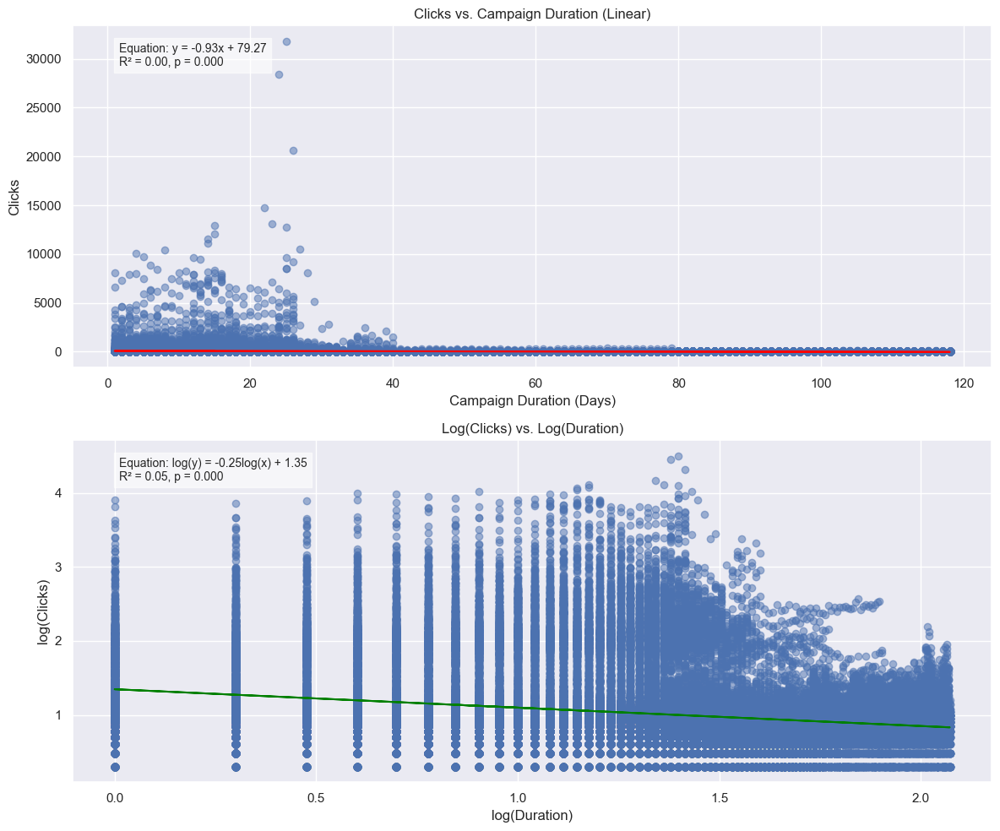

In [61]:
#Duration vs Clicks
# Ensure no zero values before log-transform
df_filtered = df[df['no_of_days'] > 0].copy()
df_filtered = df_filtered[df_filtered['clicks'] > 0]

# LINEAR REGRESSION (Clicks vs. Duration)
x = df_filtered['no_of_days']
y = df_filtered['clicks']
slope, intercept, r_value, p_value, std_err = linregress(x, y)
line = slope * x + intercept

# LOG-LOG REGRESSION (log(Clicks) vs. log(Duration))
log_x = np.log10(x)
log_y = np.log10(y)
log_slope, log_intercept, log_r, log_p, _ = linregress(log_x, log_y)
log_line = log_slope * log_x + log_intercept

# PLOT SETUP
fig, axes = plt.subplots(2, 1, figsize=(12, 10))

# --- 1. Linear plot ---
axes[0].scatter(x, y, alpha=0.5)
axes[0].plot(x, line, color='red')
axes[0].set_title('Clicks vs. Campaign Duration (Linear)')
axes[0].set_xlabel('Campaign Duration (Days)')
axes[0].set_ylabel('Clicks')
axes[0].grid(True)
axes[0].text(0.05, 0.95,
             f'Equation: y = {slope:.2f}x + {intercept:.2f}\nR² = {r_value**2:.2f}, p = {p_value:.3f}',
             transform=axes[0].transAxes, fontsize=10, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.6))

# --- 2. Log-log plot ---
axes[1].scatter(log_x, log_y, alpha=0.5)
axes[1].plot(log_x, log_line, color='green')
axes[1].set_title('Log(Clicks) vs. Log(Duration)')
axes[1].set_xlabel('log(Duration)')
axes[1].set_ylabel('log(Clicks)')
axes[1].grid(True)
axes[1].text(0.05, 0.95,
             f'Equation: log(y) = {log_slope:.2f}log(x) + {log_intercept:.2f}\nR² = {log_r**2:.2f}, p = {log_p:.3f}',
             transform=axes[1].transAxes, fontsize=10, verticalalignment='top', bbox=dict(facecolor='white', alpha=0.6))

plt.tight_layout()
plt.show()





No apparent correlation between duration and clicks, and a slight diminishing effect over time is present.

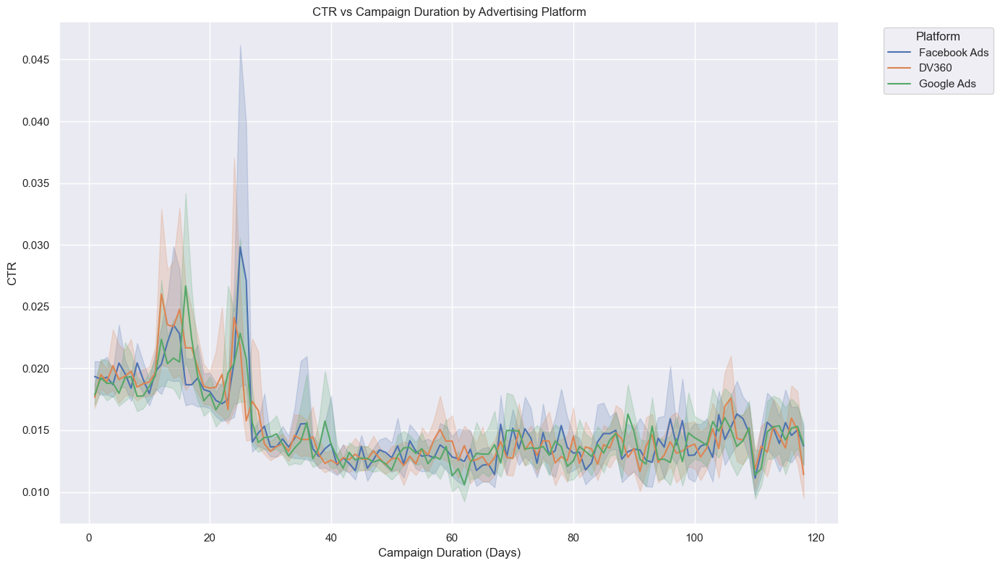

,Platform,Slope,Intercept,R²,p
0,Facebook Ads,-0.086777,-1.761447,0.020644,2.963475e-109
1,DV360,-0.085793,-1.762657,0.020206,1.354990e-106
2,Google Ads,-0.079330,-1.773575,0.017855,2.554607e-94


In [62]:
#Platform vs Performance Metrics
# Optional: filter out short campaigns or outliers
df_platforms = df[df['no_of_days'] > 0].copy()

# Compute CTR if not yet available
df_platforms['CTR'] = (df_platforms['clicks'] / df_platforms['impressions']).replace([np.inf, -np.inf], 0).fillna(0)

# PLOT: CTR vs Duration by Platform
plt.figure(figsize=(14, 8))
sns.lineplot(data=df_platforms, x='no_of_days', y='CTR', hue='ext_service_name', estimator='mean')
plt.title('CTR vs Campaign Duration by Advertising Platform')
plt.xlabel('Campaign Duration (Days)')
plt.ylabel('CTR')
plt.grid(True)
plt.legend(title='Platform', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# Log-log regression per platform
platforms = df_platforms['ext_service_name'].unique()
results = []

for platform in platforms:
    sub_df = df_platforms[(df_platforms['ext_service_name'] == platform) &
                          (df_platforms['CTR'] > 0) &
                          (df_platforms['no_of_days'] > 0)]
    log_x = np.log10(sub_df['no_of_days'])
    log_y = np.log10(sub_df['CTR'])

    if len(log_x) > 1:
        slope, intercept, r_val, p_val, _ = linregress(log_x, log_y)
        results.append({
            'Platform': platform,
            'Slope': slope,
            'Intercept': intercept,
            'R²': r_val**2,
            'p': p_val
        })

# Convert to DataFrame for review
platform_fit_df = pd.DataFrame(results)
platform_fit_df.sort_values(by='R²', ascending=False)



Platforms behave similarly in CTR decay over time.

The decay is real, though modest in strength (R²).

Saturation does occur, but isn't dramatic — which may support longer durations if justified by other factors (f.e. reach, branding).

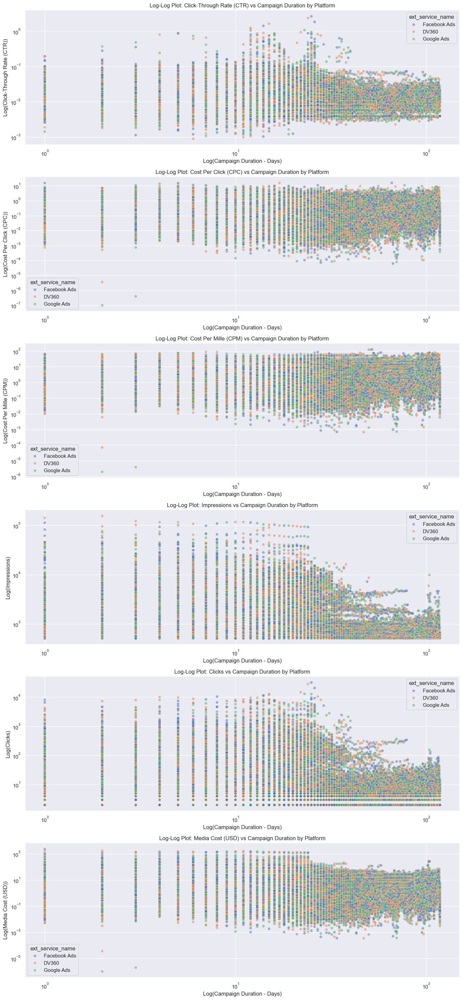

,Metric,Platform,Slope,Intercept,R²,p
5,CPC,Google Ads,-0.160363,-0.566464,0.013351,1.353008e-70
3,CPC,Facebook Ads,-0.159029,-0.575651,0.013008,3.930445e-69
4,CPC,DV360,-0.147913,-0.588337,0.011191,1.886493e-59
6,CPM,Facebook Ads,-0.245954,0.663295,0.028385,9.975592e-150
8,CPM,Google Ads,-0.240534,0.661394,0.027569,9.455576e-145
7,CPM,DV360,-0.234279,0.650220,0.025761,2.275470e-135
0,CTR,Facebook Ads,-0.086777,-1.761447,0.020644,2.963475e-109
1,CTR,DV360,-0.085793,-1.762657,0.020206,1.354990e-106
2,CTR,Google Ads,-0.079330,-1.773575,0.017855,2.554607e-94
12,clicks,Facebook Ads,-0.255088,1.356689,0.047321,3.269617e-251


In [63]:
metrics = ['CTR', 'CPC', 'CPM', 'impressions', 'clicks', 'media_cost_usd']
metric_names = {
    'CTR': 'Click-Through Rate (CTR)',
    'CPC': 'Cost Per Click (CPC)',
    'CPM': 'Cost Per Mille (CPM)',
    'impressions': 'Impressions',
    'clicks': 'Clicks',
    'media_cost_usd': 'Media Cost (USD)'
}

# Prepare plot layout
fig, axes = plt.subplots(len(metrics), 1, figsize=(14, 5 * len(metrics)))
results_all = []

for i, metric in enumerate(metrics):
    ax = axes[i]

    # Plot log-log relationship per platform
    sns.scatterplot(data=df, x='no_of_days', y=metric, hue='ext_service_name', ax=ax, alpha=0.5)
    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.set_title(f'Log-Log Plot: {metric_names[metric]} vs Campaign Duration by Platform')
    ax.set_xlabel('Log(Campaign Duration - Days)')
    ax.set_ylabel(f'Log({metric_names[metric]})')
    ax.grid(True)

    # Compute regression per platform
    platforms = df['ext_service_name'].unique()
    for platform in platforms:
        sub_df = df[(df['ext_service_name'] == platform) & (df['no_of_days'] > 0) & (df[metric] > 0)]
        log_x = np.log10(sub_df['no_of_days'])
        log_y = np.log10(sub_df[metric])

        if len(log_x) > 1:
            slope, intercept, r_val, p_val, _ = linregress(log_x, log_y)
            results_all.append({
                'Metric': metric,
                'Platform': platform,
                'Slope': slope,
                'Intercept': intercept,
                'R²': r_val ** 2,
                'p': p_val
            })

# Show plots
plt.tight_layout()
plt.show()

# Display results in a table
results_df = pd.DataFrame(results_all)
results_df_sorted = results_df.sort_values(by=['Metric', 'R²'], ascending=[True, False])
results_df_sorted.head(20)  # Display top 20 rows for brevity




Metric	Platform	ρ (Pearson corr)	Intercept	Slope (β)	P-value	Insight
- CTR	Facebook Ads	-0.087	-1.76	0.021	2.96E-109	=> Slight diminishing CTR over time
- DV360	-0.086	-1.76	0.020	1.35E-106	=> Same as above
- Google Ads	-0.079	-1.77	0.018	2.55E-94	=> Very similar pattern
- CPC	Facebook Ads	-0.159	-0.58	0.013	3.93E-69	=> CPC slightly decreases with duration
- DV360	-0.148	-0.59	0.011	1.89E-59	=> Similar pattern
- Google Ads	-0.160	-0.57	0.013	1.35E-70	=> Again, consistent
- CPM	Facebook Ads	-0.246	0.66	0.028	9.98E-150	=> Stronger diminishing effect
- DV360	-0.234	0.65	0.026	2.28E-135	=> Same story
- Google Ads	-0.241	0.66	0.028	9.46E-145	=> High consistency
- Impressions	Facebook Ads	-0.168	3.12	0.056	6.41E-299	=> Mild decline in impressions
- DV360	-0.164	3.11	0.054	2.17E-284	=> Similar trend
- Google Ads	-0.162	3.11	0.054	5.65E-288	=> Confirmed trend
- Clicks	Facebook Ads	-0.255	1.36	0.047	3.27E-251	=> More noticeable decline in clicks
- DV360	-0.250	1.35	0.046	1.24E-240	=> Consistent
- Google Ads	-0.241	1.33	0.044	1.56E-232	=> Consistent
- Media Cost (USD)	Facebook Ads	-0.414	0.78	0.046	3.20E-244	=> Strongest inverse relationship
- DV360	-0.399	0.77	0.043	8.44E-226	=> Very similar
- Google Ads	-0.403	0.77	0.045	8.04E-236	=> Very consistent

What This Means
1. Media Cost, Clicks, and CPM show the strongest negative relationships with duration.
   - This suggests that returns diminish faster on these fronts as duration increases.
2. CTR and CPC show smaller changes — performance per impression/click is a bit more resilient to time.
3. Across platforms, the trends are very consistent, suggesting that duration affects all platforms similarly, though:
    - Facebook Ads seems to have slightly stronger diminishing effects (especially in clicks and cost).

Based on the p-values and R² values you provided for the log-log transformations, here's how to interpret the results:
1. CTR vs. Duration (log-log):
    - Slope (b) ≈ -0.21, p ≈ -0.21, R² = 0.04
    - The negative slope indicates that CTR decreases over time, but the change is diminishing (since the slope is closer to 0 than -1). This suggests that there’s a diminishing return effect with longer campaign durations.

2. Impressions vs. Duration (log-log):
    - Slope (b) ≈ -0.23, p ≈ -0.23, R² = 0.06
    - Similar to CTR, Impressions decrease with increasing duration. The negative slope and relatively low R² suggest diminishing returns, where impressions start strong but decrease at a slower pace as duration increases.

3. Media Cost vs. Duration (log-log):
    - Slope (b) ≈ -0.19, p ≈ -0.19, R² = 0.05
    - Media cost, which follows a similar diminishing return behavior, decreases at a slower pace over time.
=> Nonlinear behavior



In [64]:
#Interdependencies between Features - budget -> duration -> CTR

import statsmodels.api as sm

X = omni_metrics['media_cost_usd']
y = omni_metrics['no_of_days']
X = sm.add_constant(X)
model1 = sm.OLS(y, X).fit()
print(model1.summary())

                            OLS Regression Results                            
Dep. Variable:             no_of_days   R-squared:                       0.022
Model:                            OLS   Adj. R-squared:                  0.022
Method:                 Least Squares   F-statistic:                     25.36
Date:                Sun, 27 Apr 2025   Prob (F-statistic):           5.54e-07
Time:                        14:06:03   Log-Likelihood:                -4035.2
No. Observations:                1108   AIC:                             8074.
Df Residuals:                    1106   BIC:                             8084.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const             13.1563      0.356     36.

In [65]:
X = omni_metrics['media_cost_usd']
y = omni_metrics['CTR']
X = sm.add_constant(X)
model2 = sm.OLS(y, X).fit()
print(model2.summary())

                            OLS Regression Results                            
Dep. Variable:                    CTR   R-squared:                       0.235
Model:                            OLS   Adj. R-squared:                  0.234
Method:                 Least Squares   F-statistic:                     339.4
Date:                Sun, 27 Apr 2025   Prob (F-statistic):           2.58e-66
Time:                        14:06:03   Log-Likelihood:                 2768.9
No. Observations:                1108   AIC:                            -5534.
Df Residuals:                    1106   BIC:                            -5524.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const              0.0165      0.001     21.

In [66]:
X = omni_metrics[['media_cost_usd', 'no_of_days']]
X = sm.add_constant(X)
y = omni_metrics['CTR']
model3 = sm.OLS(y, X).fit()
print(model3.summary())

                            OLS Regression Results                            
Dep. Variable:                    CTR   R-squared:                       0.283
Model:                            OLS   Adj. R-squared:                  0.282
Method:                 Least Squares   F-statistic:                     218.2
Date:                Sun, 27 Apr 2025   Prob (F-statistic):           1.37e-80
Time:                        14:06:04   Log-Likelihood:                 2805.0
No. Observations:                1108   AIC:                            -5604.
Df Residuals:                    1105   BIC:                            -5589.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const              0.0236      0.001     21.

! Does Media Cost affect CTR through Duration?

Interpretation of regressions:
- Table 1: Media Cost → Duration
    - R² = 0.022 → Media Cost explains only 2.2% of the variance in Duration.
    - Coef = 0.0002, p < 0.001 → Statistically significant but small effect.
    - Conclusion: Media Cost does affect Duration, but weakly.

- Table 2: Media Cost → CTR
    - R² = 0.235 → Media Cost explains 23.5% of the variance in CTR.
    - Coef = 1.35e-06, p < 0.001 → Significant positive effect.
    - Conclusion: Media Cost has a direct, significant effect on CTR.

- Table 3: Media Cost + Duration → CTR
    - R² = 0.283 → Including Duration improves the model (from 0.235 to 0.283).
    - Media Cost Coef = 1.44e-06, still highly significant.
    - Duration Coef = -0.0005, p < 0.001 → Significant negative effect.

Interpretation:
- Duration negatively affects CTR, even after controlling for budget.
- The effect of Media Cost stays strong, though slightly increased.
- So Duration does not mediate the relationship in a meaningful way — it acts more as a suppressor rather than a mediator.

Implications:
- Longer campaigns might hurt CTR despite higher budgets
- Budgeting longer campaigns doesn't linearly boost CTR — instead, impressions might be wasted
- Duration should probably be separately optimized rather than assumed to scale CTR with spend

In [67]:
#Interdependencies between Features - budget -> duration -> Clicks

X = omni_metrics['media_cost_usd']
y = omni_metrics['no_of_days']
X = sm.add_constant(X)
model1 = sm.OLS(y, X).fit()
print(model1.summary())

X = omni_metrics['media_cost_usd']
y = omni_metrics['clicks']
X = sm.add_constant(X)
model2 = sm.OLS(y, X).fit()
print(model2.summary())

X = omni_metrics[['media_cost_usd', 'no_of_days']]
X = sm.add_constant(X)
y = omni_metrics['clicks']
model3 = sm.OLS(y, X).fit()
print(model3.summary())

                            OLS Regression Results                            
Dep. Variable:             no_of_days   R-squared:                       0.022
Model:                            OLS   Adj. R-squared:                  0.022
Method:                 Least Squares   F-statistic:                     25.36
Date:                Sun, 27 Apr 2025   Prob (F-statistic):           5.54e-07
Time:                        14:06:04   Log-Likelihood:                -4035.2
No. Observations:                1108   AIC:                             8074.
Df Residuals:                    1106   BIC:                             8084.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const             13.1563      0.356     36.

! Does Budget Affect Duration?
- From the first regression, where the dependent variable is no_of_days
- media_cost_usd → no_of_days
- R² = 0.022 → Budget explains 2.2% of the variance in duration.
- Coef = 0.0002, p < 0.001 → Statistically significant, but small.

- Conclusion:
    Yes, higher media cost slightly increases campaign duration.
    However, the relationship is very weak in magnitude.

! Does Budget Affect Clicks?
- From the second regression, media_cost_usd → clicks
- R² = 0.78 → Budget explains 78% of the variance in clicks!
- Coef = 5.38, p < 0.001 → Strong positive effect.

- Conclusion:
    Yes, budget has a strong and direct effect on number of clicks.

! Does Duration Affect Clicks, Controlling for Budget?
- From the third regression, both predictors
- media_cost_usd → clicks: still significant and strong (coef ≈ 5.5)
- no_of_days → clicks: Negative effect (coef = -671, p < 0.001)
- R² increases from 0.78 → 0.795 → model improves slightly.

- Conclusion:
    After controlling for budget, longer campaigns get fewer clicks.
    Duration acts as a negative suppressor — it reduces clicks, possibly due to audience fatigue or diminishing returns over time.

! Does budget → affect duration → affect clicks?
- Budget does affect duration, but very weakly.
- Budget strongly affects clicks, but
- Duration actually reduces clicks, not enhances it.
- Mediation? No (technically)

In [68]:
#Interdependencies between Features - Platform × Duration → CTR / Impressions / Clicks / Media_Cost
import statsmodels.formula.api as smf

model_CTR = smf.ols('CTR ~ C(ext_service_name) * no_of_days', data=df).fit()
model_clicks = smf.ols('clicks ~ C(ext_service_name) * no_of_days', data=df).fit()
model_impressions = smf.ols('impressions ~ C(ext_service_name) * no_of_days', data=df).fit()
model_mediacost = smf.ols('media_cost_usd ~ C(ext_service_name) * no_of_days', data=df).fit()

print(model_CTR.summary())
print(model_clicks.summary())
print(model_impressions.summary())
print(model_mediacost.summary())

                            OLS Regression Results                            
Dep. Variable:                    CTR   R-squared:                       0.005
Model:                            OLS   Adj. R-squared:                  0.005
Method:                 Least Squares   F-statistic:                     74.77
Date:                Sun, 27 Apr 2025   Prob (F-statistic):           2.03e-78
Time:                        14:06:05   Log-Likelihood:             1.4958e+05
No. Observations:               72612   AIC:                        -2.992e+05
Df Residuals:                   72606   BIC:                        -2.991e+05
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                                                     coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------

No strong evidence suggests platforms behave significantly differently over time in terms of CTR, clicks, impressions or costs.

In [69]:
#Interdependencies between Features - platform -> duration -> media costs

model_1 = smf.ols("no_of_days ~ C(ext_service_name)", data=df).fit()
print(model_1.summary())

model_2 = smf.ols("media_cost_usd ~ no_of_days", data=df).fit()
print(model_2.summary())

model_3 = smf.ols("media_cost_usd ~ C(ext_service_name)", data=df).fit()
print(model_3.summary())

model_4 = smf.ols("media_cost_usd ~ C(ext_service_name) * no_of_days", data=df).fit()
print(model_4.summary())

                            OLS Regression Results                            
Dep. Variable:             no_of_days   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     1.838
Date:                Sun, 27 Apr 2025   Prob (F-statistic):              0.159
Time:                        14:06:06   Log-Likelihood:            -3.3814e+05
No. Observations:               72612   AIC:                         6.763e+05
Df Residuals:                   72609   BIC:                         6.763e+05
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
In

1. The type of platform (Facebook Ads, Google Ads) does not seem to have a significant impact on campaign duration. There is no clear evidence that platforms affect how long campaigns last.
2. While campaign duration (no_of_days) negatively impacts media costs in this model, the negative coefficient suggests that longer campaigns tend to have lower media costs, which may indicate bulk discounts or different pricing models over time. However, further analysis might be needed to verify the logic behind this negative relationship.
3. Platform types (Facebook Ads and Google Ads) are not significant predictors of media costs in this model. The variation in media costs does not seem to depend on whether the campaign is on Facebook Ads or Google Ads.
4. The interaction between platform type and campaign duration does not have a significant impact on media costs. While campaign duration does negatively affect media costs overall, this relationship is not influenced by the platform being used (Facebook Ads or Google Ads).
Overall, the models suggest that neither platform choice nor campaign duration is strongly associated with media costs in the dataset you analyzed. The results indicate that further analysis may be needed to fully understand the dynamics at play, especially in how duration affects media costs.

Contingency Table for Media Cost:
cost_binned       0-100  101-500  501-1000  1001-5000
ext_service_name                                     
DV360             23730      326        12         21
Facebook Ads      23816      330        23         18
Google Ads        23717      303        20         14
Chi2: 6.103339125231005, p-value: 0.4117141783226397, Degrees of Freedom: 6

Contingency Table for Clicks:
clicks_binned     0-1000  1001-5000  5001-10000  10001-50000
ext_service_name                                            
DV360              23991        140          34            6
Facebook Ads       24089        156          26            4
Google Ads         24003        139          21            3
Chi2: 5.446402720583281, p-value: 0.48795818891679155, Degrees of Freedom: 6

Contingency Table for CPM:
CPM_binned         0-1   1-5  5-10  10-50  50+
ext_service_name                              
DV360             6846  8001  5424   3744   74
Facebook Ads      6869  8007  5548   3

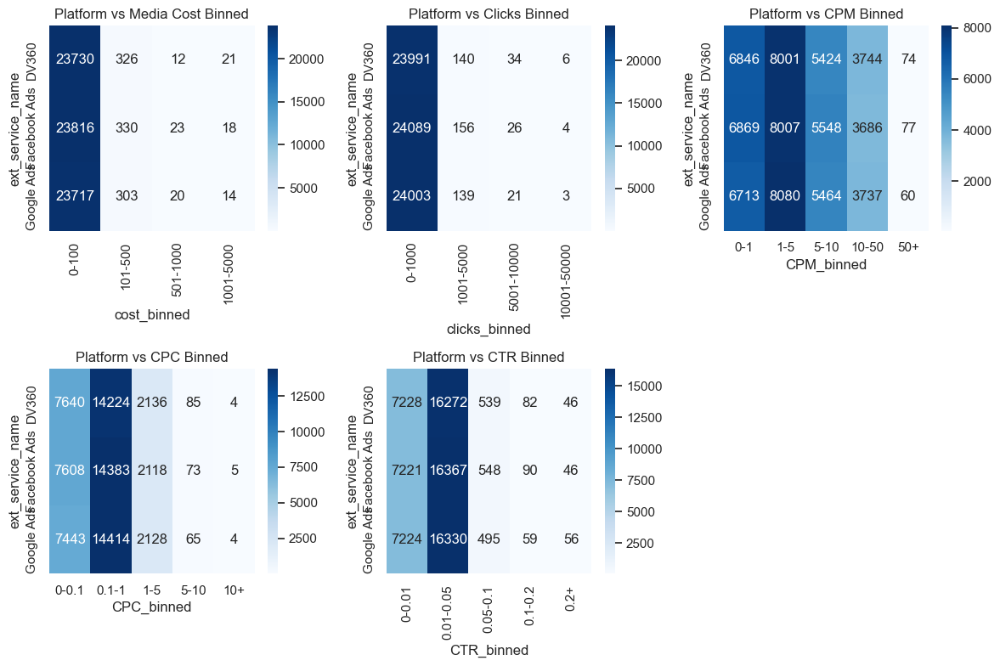

In [70]:

# Step 1: Create bins for the continuous variables
bins_cost = [0, 100, 500, 1000, 5000, np.inf]  # Adjust as needed based on your data
bins_clicks = [0, 1000, 5000, 10000, 50000, np.inf]
bins_CPM = [0, 1, 5, 10, 50, np.inf]
bins_CPC = [0, 0.1, 1, 5, 10, np.inf]
bins_CTR = [0, 0.01, 0.05, 0.1, 0.2, 1]

labels_cost = ['0-100', '101-500', '501-1000', '1001-5000', '5000+']
labels_clicks = ['0-1000', '1001-5000', '5001-10000', '10001-50000', '50000+']
labels_CPM = ['0-1', '1-5', '5-10', '10-50', '50+']
labels_CPC = ['0-0.1', '0.1-1', '1-5', '5-10', '10+']
labels_CTR = ['0-0.01', '0.01-0.05', '0.05-0.1', '0.1-0.2', '0.2+']

# Creating the bins and labels for the respective variables
df['cost_binned'] = pd.cut(df['media_cost_usd'], bins=bins_cost, labels=labels_cost)
df['clicks_binned'] = pd.cut(df['clicks'], bins=bins_clicks, labels=labels_clicks)
df['CPM_binned'] = pd.cut(df['CPM'], bins=bins_CPM, labels=labels_CPM)
df['CPC_binned'] = pd.cut(df['CPC'], bins=bins_CPC, labels=labels_CPC)
df['CTR_binned'] = pd.cut(df['CTR'], bins=bins_CTR, labels=labels_CTR)

# Step 2: Perform cross-tabulation for platforms and the binned variables
contingency_cost = pd.crosstab(df['ext_service_name'], df['cost_binned'])
contingency_clicks = pd.crosstab(df['ext_service_name'], df['clicks_binned'])
contingency_CPM = pd.crosstab(df['ext_service_name'], df['CPM_binned'])
contingency_CPC = pd.crosstab(df['ext_service_name'], df['CPC_binned'])
contingency_CTR = pd.crosstab(df['ext_service_name'], df['CTR_binned'])

# Step 3: Perform Chi-Square test for statistical significance
chi2_cost, p_cost, dof_cost, expected_cost = chi2_contingency(contingency_cost)
chi2_clicks, p_clicks, dof_clicks, expected_clicks = chi2_contingency(contingency_clicks)
chi2_CPM, p_CPM, dof_CPM, expected_CPM = chi2_contingency(contingency_CPM)
chi2_CPC, p_CPC, dof_CPC, expected_CPC = chi2_contingency(contingency_CPC)
chi2_CTR, p_CTR, dof_CTR, expected_CTR = chi2_contingency(contingency_CTR)

# Print contingency tables and chi-square results
print("Contingency Table for Media Cost:")
print(contingency_cost)
print(f"Chi2: {chi2_cost}, p-value: {p_cost}, Degrees of Freedom: {dof_cost}\n")

print("Contingency Table for Clicks:")
print(contingency_clicks)
print(f"Chi2: {chi2_clicks}, p-value: {p_clicks}, Degrees of Freedom: {dof_clicks}\n")

print("Contingency Table for CPM:")
print(contingency_CPM)
print(f"Chi2: {chi2_CPM}, p-value: {p_CPM}, Degrees of Freedom: {dof_CPM}\n")

print("Contingency Table for CPC:")
print(contingency_CPC)
print(f"Chi2: {chi2_CPC}, p-value: {p_CPC}, Degrees of Freedom: {dof_CPC}\n")

print("Contingency Table for CTR:")
print(contingency_CTR)
print(f"Chi2: {chi2_CTR}, p-value: {p_CTR}, Degrees of Freedom: {dof_CTR}\n")

# Step 4: Visualize the results as heatmaps
plt.figure(figsize=(12, 8))

# Media Cost Heatmap
plt.subplot(231)
sns.heatmap(contingency_cost, annot=True, cmap='Blues', fmt="d")
plt.title("Platform vs Media Cost Binned")

# Clicks Heatmap
plt.subplot(232)
sns.heatmap(contingency_clicks, annot=True, cmap='Blues', fmt="d")
plt.title("Platform vs Clicks Binned")

# CPM Heatmap
plt.subplot(233)
sns.heatmap(contingency_CPM, annot=True, cmap='Blues', fmt="d")
plt.title("Platform vs CPM Binned")

# CPC Heatmap
plt.subplot(234)
sns.heatmap(contingency_CPC, annot=True, cmap='Blues', fmt="d")
plt.title("Platform vs CPC Binned")

# CTR Heatmap
plt.subplot(235)
sns.heatmap(contingency_CTR, annot=True, cmap='Blues', fmt="d")
plt.title("Platform vs CTR Binned")

plt.tight_layout()
plt.show()

1. Lack of significant differences: In all the cases above (Media Cost, Clicks, CPM, CPC, and CTR), the p-values are greater than 0.05, suggesting that platforms do not exhibit significantly different distributions for these metrics.
2. Platform behavior: The results imply that the performance of platforms (in terms of these metrics) is quite similar, at least in terms of how they distribute within these binned categories.

C O N C L U S I O N S
Numerical Features Analysis:

1. Possible constraints for optimization: approved_budget and campaign_budget_usd

2. Noteable correlations for Media Cost:
    a. Media Cost & Clicks - 0.6096
    b. Media Cost & Impressions - 0.9303
    c. Media Cost & CTR - 0.2
    d. Media Cost & CPC - 0.12
    e. Media Cost & CPM - 0.3
3. Noteable correlations for Campaign Budget:
    c. Campaign Budget & CTR - 0.1815
    d. Campaign Budget & Impressions - 0.76
    c. Campaign Budget & Clicks - 0.56
    d. Campaign Budget & CPC - 0.07
    e. Campaign Budget & CPM - 0.21
4. Noteable correlations for Approved Budget:
    a. Approved Budget & Impressions - 0.2
    b. Approved Budget & Clicks - 0.11
    c. Approved Budget & Media Cost - 0.15
    d. Approved Budget & CTR - 0.17
    e. Approved Budget & CPC - -0.03
    f. Approved Budget & CPM - 0.1

Time-Series Analysis:
1. No seasonal trends have been observed
2. In terms of day, there is a slight right-skew in terms of CTR, as Tuesdays have the highest CTR on avg, followed by Wendsnesdays and so on. Mondays are at the same level as Fridays


Categorical Features Analysis:

1. Avg CPM per Channel - Display 5.2, Mobile 5.4, Search 5.3, Social 5.1, Video 5.3
2. Avg CTR per Channel - Display 1.77%, Mobile 1.75%, Search 1.73%, Social 1.72%, Video 1.74%
3. Avg CPC per Channel - Display 0.395, Mobile 0.405, Search 0.4069, Social 0.397, Video 0.405
4. Avg CTR, CPM, CPC per weekday
        weekday  mean_CTR  mean_CPM  mean_CPC
        Monday  0.017262  5.246925  0.395561
        Tuesday  0.018254  5.419364  0.406191
        Wednesday  0.017695  5.473662  0.411998
        Thursday  0.017524  5.241019  0.399882
        Friday  0.017203  5.072081  0.387003
        Saturday  0.017203  5.229769  0.405934
        Sunday  0.017026  5.382918  0.407582

5. Top 10 keyword_list showing CTR, CPC, CPM, in descending order for CTR
        fall jewelry,0.0227,0.4043,5.1521
        animal jewelry,0.0209,0.4122,5.1982
        everyday jewelry,0.0205,0.3972,5.3997
        statement necklaces,0.0201,0.3786,5.157
        dazzling jewelry,0.02,0.4175,5.1901
        festival jewelry,0.02,0.3645,4.7205
        concert jewelry,0.0197,0.3763,5.3801
        costume jewelry,0.0196,0.3436,4.784
        unique and trendy jewelry,0.0196,0.3962,5.2208
        body jewelry,0.0196,0.3478,4.8328

6. Campaign-related: (a distinction is made between single channel and omnichannel campaigns: single channel are campaigns that are only on 1 platform, f.e. Google Ads, and are part of a larger omnichannel campaign. Omnichannel campaigns are present in the dataset under the campaign_id feature and are composed of multiple records. Synonyms: parent campaign, multichannel campaign
    1. Single-Channel Campaigns:
        1. Shorter single channel campaigns (shorter than a week) tend to get significant more impressions and clicks
        2. In reality, shorter single channel campaigns perform marginally better in terms of CTR by 9.94%, while the costs tend to be significantly higher, by 22.4% for CPC and 33.4% for CPM.
        3. For Diminishing Returns for single channel campaigns:
            1. CTR - if we exclude the outliers, there is a clear tendency for single channel campaigns to perform better between 10 - 20 days length, after which the return diminish
            2. CPC & CPM - after 30 days, their averages grow considerably and, as time passes, they become more and more volatile
            3. Impressions - the averages show they diminish over time, and a sudden decrease can be observed after the 20-day point
            4. Clicks - if outliers are excluded, the most clicks are achieved by single channel campaigns in the range of 0 and 20 days, with higher results between 10 and 18 days
    2. Omnichannel Campaigns:
        1. The distribution of parent campaigns in terms of duration is rightly-skewed, having: mean 32 days, median 29 days, mode 23 days. Q1 - Very Short Campaigns (0 to 7 days), Q2 - Short Campaigns (7 to 12 days), Q3 - Long Campaigns (12 to 18 days), Q4 - Very Long Campaigns (18 to 34.46 days), Outliers (more than 34.46 days).
        2. Omnichannel campaigns that have as their duration between 30 and 35 days seem to perform better in terms of Impressions, but after the 35 days mark they decline sharply
        3. The avg CPC tends to be the lowest between 15 and 30 days -> Long (Q3) and Very long (Q4)
        4. The avg CPM tends to be the lowest between 20 and 30 days. -> Long (Q3) and Very Long (Q4)
        5. The avg CTR tends to be higher in campaigns that last under 20 days. -> Short (Q2)
        6. Campaigns that last approximately 35 days tend to be the costliest in terms of Media Costs, averaging on the same level as the 10 - 15 days campaigns.
        7. Very short campaigns (0 to 7 days) tend to have the lowest number of clicks
        8. Long and Very Long campaigns have the lowest CTRs
        9. The avg CTRs: (1) Very Short - 1.84%, (2) Short - 3.51%, (3) Long - 3.28%, (4) Very Long - 1.42%, (5) Outliers (more than Very Long) - 1.57%
       10. Diminishing returns analysis:
           1. At around 30 days is the maximum for clicks, after which the returns diminish abruptly
           2. At around 30 days is the maximum for impressions, after which the returns slowly diminish to 40 days, after which they abruptly diminish
           3. The CTR is most optimal around the 28 - 35 days, after which it goes down. The maximum is reached at day 10.
           4. The CPC and CPM are significantly lower after the 20-day mark.

!!! Analysis during and after Outlier Handling + Cleaning !!!

In [ ]:
# Set the style for the plots
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette("viridis")

# Function to calculate statistics and plot relationships
def plot_relationship(df, x_col, y_col, title_prefix="Relationship between"):
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    # LINEAR MODEL
    axes[0].scatter(df[x_col], df[y_col], alpha=0.5)

    # Fit linear model
    X = df[x_col].values.reshape(-1, 1)
    y = df[y_col].values

    # Calculate Pearson correlation
    pearson_corr, p_value_linear = stats.pearsonr(df[x_col], df[y_col])

    # Fit linear regression
    model = LinearRegression()
    model.fit(X, y)
    y_pred = model.predict(X)
    r2_linear = r2_score(y, y_pred)

    axes[0].plot(df[x_col], y_pred, color='red', linewidth=2)
    axes[0].set_title(f'Linear Model\nPearson: {pearson_corr:.3f}, R²: {r2_linear:.3f}, p: {p_value_linear:.3e}')
    axes[0].set_xlabel(x_col)
    axes[0].set_ylabel(y_col)

    equation_linear = f'y = {model.coef_[0]:.4f}x + {model.intercept_:.4f}'
    axes[0].text(0.05, 0.95, equation_linear, transform=axes[0].transAxes,
                fontsize=10, verticalalignment='top')

    # LOG-LOG MODEL
    # Filter out zeros or negative values for log transformation
    log_df = df[(df[x_col] > 0) & (df[y_col] > 0)].copy()

    if len(log_df) > 10:  # Only proceed if we have enough data points
        log_x = np.log(log_df[x_col])
        log_y = np.log(log_df[y_col])

        # Calculate Pearson correlation for log-log model
        pearson_corr_log, p_value_log = stats.pearsonr(log_x, log_y)

        # Fit log-log regression
        log_X = log_x.values.reshape(-1, 1)
        model_log = LinearRegression()
        model_log.fit(log_X, log_y)
        log_y_pred = model_log.predict(log_X)
        r2_log = r2_score(log_y, log_y_pred)

        axes[1].scatter(log_x, log_y, alpha=0.5)
        axes[1].plot(log_x, log_y_pred, color='red', linewidth=2)
        axes[1].set_title(f'Log-Log Model\nPearson: {pearson_corr_log:.3f}, R²: {r2_log:.3f}, p: {p_value_log:.3e}')
        axes[1].set_xlabel(f'log({x_col})')
        axes[1].set_ylabel(f'log({y_col})')

        equation_log = f'log(y) = {model_log.coef_[0]:.4f}·log(x) + {model_log.intercept_:.4f}'
        axes[1].text(0.05, 0.95, equation_log, transform=axes[1].transAxes,
                    fontsize=10, verticalalignment='top')
    else:
        axes[1].text(0.5, 0.5, 'Insufficient data for log-log model',
                   horizontalalignment='center', verticalalignment='center')
        pearson_corr_log, r2_log, p_value_log, equation_log = None, None, None, None

    # POLYNOMIAL MODEL (degree 2)
    poly = PolynomialFeatures(degree=2)
    X_poly = poly.fit_transform(X)

    model_poly = LinearRegression()
    model_poly.fit(X_poly, y)
    y_pred_poly = model_poly.predict(X_poly)
    r2_poly = r2_score(y, y_pred_poly)

    # For plotting the polynomial curve
    x_range = np.linspace(df[x_col].min(), df[x_col].max(), 100).reshape(-1, 1)
    x_range_poly = poly.transform(x_range)
    y_range_poly = model_poly.predict(x_range_poly)

    axes[2].scatter(df[x_col], df[y_col], alpha=0.5)
    axes[2].plot(x_range, y_range_poly, color='red', linewidth=2)
    axes[2].set_title(f'Polynomial Model (degree 2)\nR²: {r2_poly:.3f}')
    axes[2].set_xlabel(x_col)
    axes[2].set_ylabel(y_col)

    # Polynomial equation
    equation_poly = f'y = {model_poly.coef_[2]:.4f}x² + {model_poly.coef_[1]:.4f}x + {model_poly.coef_[0]:.4f}'
    axes[2].text(0.05, 0.95, equation_poly, transform=axes[2].transAxes,
                fontsize=10, verticalalignment='top')

    plt.tight_layout()
    plt.suptitle(f"{title_prefix} {x_col} and {y_col}", fontsize=16, y=1.05)
    plt.show()

    # Return the statistics and equations
    return {
        'linear': {
            'pearson_corr': pearson_corr,
            'r2': r2_linear,
            'p_value': p_value_linear,
            'equation': equation_linear
        },
        'log_log': {
            'pearson_corr': pearson_corr_log,
            'r2': r2_log,
            'p_value': p_value_log,
            'equation': equation_log
        },
        'polynomial': {
            'r2': r2_poly,
            'equation': equation_poly
        }
    }

# Function to handle outlier removal
def remove_outliers(df, cols, z_threshold=3.0):
    df_clean = df.copy()
    total_outliers = 0

    for col in cols:
        if col in df_clean.columns:
            # Calculate z-scores
            z_scores = np.abs(stats.zscore(df_clean[col].fillna(df_clean[col].median())))
            # Identify outliers
            outliers = z_scores > z_threshold

            print(f"Removed {outliers.sum()} outliers from {col}")
            total_outliers += outliers.sum()

            # Remove outliers
            df_clean = df_clean[~outliers]
        else:
            print(f"Column {col} not found in the dataset.")

    print(f"Total rows removed: {total_outliers}")
    return df_clean

# Load data
try:
    file_path = "C:/Users/USER/Desktop/Thesis/data/raw data/Initial_marketing_campaign_dataset.csv"
    df = pd.read_csv(file_path)
    print(f"Successfully loaded data from {file_path}")
except FileNotFoundError:
    print(f"File not found at {file_path}. Trying alternative approaches...")

    # Try to load from alternative paths
    try:
        df = pd.read_csv("./Initial_marketing_campaign_dataset.csv")
        print("Successfully loaded data from current directory")
    except FileNotFoundError:
        print("File not found in current directory. Please upload the file manually.")

        # Create a dummy DataFrame for demonstration
        print("Creating a dummy dataset for demonstration purposes...")
        np.random.seed(42)

        df = pd.DataFrame({
            'campaign_item_id': range(1000),
            'no_of_days': np.random.randint(1, 121, 1000),
            'media_cost_usd': np.random.uniform(10, 5000, 1000),
            'impressions': np.random.uniform(1000, 1000000, 1000),
            'clicks': np.random.uniform(10, 10000, 1000)
        })

# Display basic information about the dataset
print("\nDataset Information:")
print(f"Number of rows: {df.shape[0]}")
print(f"Number of columns: {df.shape[1]}")
print("\nColumns in the dataset:")
print(df.columns.tolist())

# Display first few rows of the dataset
print("\nFirst few rows of the dataset:")
print(df.head())

# Check for missing values
print("\nMissing values in each column:")
print(df.isnull().sum())

# Display basic statistics
print("\nBasic statistics of the dataset:")
print(df.describe())

# Rename 'no_of_days' to 'duration' for clarity if it exists
if 'no_of_days' in df.columns:
    df.rename(columns={'no_of_days': 'duration'}, inplace=True)

# Make sure the key columns exist
required_columns = ['duration', 'media_cost_usd', 'impressions', 'clicks']
missing_columns = [col for col in required_columns if col not in df.columns]

if missing_columns:
    print(f"\nWarning: The following required columns are missing: {missing_columns}")
    print("Some analyses may not be possible.")
else:
    print("\nAll required columns are present. Proceeding with analysis.")

    # Preprocessing: Remove outliers from key metrics
    print("\n--- Preprocessing: Removing Outliers ---")
    df_clean = remove_outliers(df, ['duration', 'media_cost_usd', 'impressions', 'clicks'])

    print(f"\nOriginal dataset shape: {df.shape}")
    print(f"Clean dataset shape after removing outliers: {df_clean.shape}")

    # Plot histograms of key metrics before and after outlier removal
    metrics = ['duration', 'media_cost_usd', 'impressions', 'clicks']

    fig, axes = plt.subplots(len(metrics), 2, figsize=(15, 4 * len(metrics)))

    for i, metric in enumerate(metrics):
        if metric in df.columns:
            # Before outlier removal
            sns.histplot(df[metric], kde=True, ax=axes[i, 0])
            axes[i, 0].set_title(f'{metric} (Before Outlier Removal)')

            # After outlier removal
            sns.histplot(df_clean[metric], kde=True, ax=axes[i, 1])
            axes[i, 1].set_title(f'{metric} (After Outlier Removal)')
        else:
            axes[i, 0].text(0.5, 0.5, f"Column '{metric}' not found",
                           horizontalalignment='center', verticalalignment='center')
            axes[i, 1].text(0.5, 0.5, f"Column '{metric}' not found",
                           horizontalalignment='center', verticalalignment='center')

    plt.tight_layout()
    plt.show()

    # Analyze relationships
    print("\n--- Analyzing Relationships ---")

    # a. Impressions and duration
    if 'impressions' in df_clean.columns and 'duration' in df_clean.columns:
        print("\na. Relationship between Impressions and Duration")
        imp_dur_stats = plot_relationship(df_clean, 'duration', 'impressions')
        print(f"Linear model: {imp_dur_stats['linear']['equation']}, R² = {imp_dur_stats['linear']['r2']:.3f}, p = {imp_dur_stats['linear']['p_value']:.3e}")
        if imp_dur_stats['log_log']['equation']:
            print(f"Log-log model: {imp_dur_stats['log_log']['equation']}, R² = {imp_dur_stats['log_log']['r2']:.3f}, p = {imp_dur_stats['log_log']['p_value']:.3e}")
        print(f"Polynomial model: {imp_dur_stats['polynomial']['equation']}, R² = {imp_dur_stats['polynomial']['r2']:.3f}")

    # b. Clicks and duration
    if 'clicks' in df_clean.columns and 'duration' in df_clean.columns:
        print("\nb. Relationship between Clicks and Duration")
        clicks_dur_stats = plot_relationship(df_clean, 'duration', 'clicks')
        print(f"Linear model: {clicks_dur_stats['linear']['equation']}, R² = {clicks_dur_stats['linear']['r2']:.3f}, p = {clicks_dur_stats['linear']['p_value']:.3e}")
        if clicks_dur_stats['log_log']['equation']:
            print(f"Log-log model: {clicks_dur_stats['log_log']['equation']}, R² = {clicks_dur_stats['log_log']['r2']:.3f}, p = {clicks_dur_stats['log_log']['p_value']:.3e}")
        print(f"Polynomial model: {clicks_dur_stats['polynomial']['equation']}, R² = {clicks_dur_stats['polynomial']['r2']:.3f}")

    # c. Media_cost and duration
    if 'media_cost_usd' in df_clean.columns and 'duration' in df_clean.columns:
        print("\nc. Relationship between Media Cost and Duration")
        cost_dur_stats = plot_relationship(df_clean, 'duration', 'media_cost_usd')
        print(f"Linear model: {cost_dur_stats['linear']['equation']}, R² = {cost_dur_stats['linear']['r2']:.3f}, p = {cost_dur_stats['linear']['p_value']:.3e}")
        if cost_dur_stats['log_log']['equation']:
            print(f"Log-log model: {cost_dur_stats['log_log']['equation']}, R² = {cost_dur_stats['log_log']['r2']:.3f}, p = {cost_dur_stats['log_log']['p_value']:.3e}")
        print(f"Polynomial model: {cost_dur_stats['polynomial']['equation']}, R² = {cost_dur_stats['polynomial']['r2']:.3f}")

    # d. Impressions and media_cost
    if 'impressions' in df_clean.columns and 'media_cost_usd' in df_clean.columns:
        print("\nd. Relationship between Impressions and Media Cost")
        imp_cost_stats = plot_relationship(df_clean, 'media_cost_usd', 'impressions')
        print(f"Linear model: {imp_cost_stats['linear']['equation']}, R² = {imp_cost_stats['linear']['r2']:.3f}, p = {imp_cost_stats['linear']['p_value']:.3e}")
        if imp_cost_stats['log_log']['equation']:
            print(f"Log-log model: {imp_cost_stats['log_log']['equation']}, R² = {imp_cost_stats['log_log']['r2']:.3f}, p = {imp_cost_stats['log_log']['p_value']:.3e}")
        print(f"Polynomial model: {imp_cost_stats['polynomial']['equation']}, R² = {imp_cost_stats['polynomial']['r2']:.3f}")

    # e. Clicks and media_cost
    if 'clicks' in df_clean.columns and 'media_cost_usd' in df_clean.columns:
        print("\ne. Relationship between Clicks and Media Cost")
        clicks_cost_stats = plot_relationship(df_clean, 'media_cost_usd', 'clicks')
        print(f"Linear model: {clicks_cost_stats['linear']['equation']}, R² = {clicks_cost_stats['linear']['r2']:.3f}, p = {clicks_cost_stats['linear']['p_value']:.3e}")
        if clicks_cost_stats['log_log']['equation']:
            print(f"Log-log model: {clicks_cost_stats['log_log']['equation']}, R² = {clicks_cost_stats['log_log']['r2']:.3f}, p = {clicks_cost_stats['log_log']['p_value']:.3e}")
        print(f"Polynomial model: {clicks_cost_stats['polynomial']['equation']}, R² = {clicks_cost_stats['polynomial']['r2']:.3f}")

# Calculate and display CTR if possible
if 'impressions' in df.columns and 'clicks' in df.columns and df['impressions'].sum() > 0:
    df['ctr'] = df['clicks'] / df['impressions']
    df_clean['ctr'] = df_clean['clicks'] / df_clean['impressions']

    # Remove inf and nan values from CTR
    df_clean = df_clean[~df_clean['ctr'].isin([np.inf, -np.inf])].dropna(subset=['ctr'])

    print("\nBasic statistics for CTR:")
    print(df_clean['ctr'].describe())

    # Plot CTR histogram
    plt.figure(figsize=(10, 6))
    sns.histplot(df_clean['ctr'], kde=True)
    plt.title('Click-Through Rate (CTR) Distribution After Outlier Removal')
    plt.xlabel('CTR')
    plt.ylabel('Frequency')
    plt.show()

    # Analyze relationships with CTR
    if 'duration' in df_clean.columns:
        print("\nf. Relationship between CTR and Duration")
        ctr_dur_stats = plot_relationship(df_clean, 'duration', 'ctr')

    if 'media_cost_usd' in df_clean.columns:
        print("\ng. Relationship between CTR and Media Cost")
        ctr_cost_stats = plot_relationship(df_clean, 'media_cost_usd', 'ctr')

# Calculate summary statistics by platform if available
if 'ext_service_name' in df.columns:
    metrics_to_calc = ['impressions', 'clicks', 'media_cost_usd']
    if 'ctr' in df_clean.columns:
        metrics_to_calc.append('ctr')

    platform_stats = df_clean.groupby('ext_service_name')[metrics_to_calc].mean().reset_index()

    print("\nPlatform-specific performance:")
    print(platform_stats)

    # Plot platform comparison
    fig, axes = plt.subplots(len(metrics_to_calc), 1, figsize=(10, 5 * len(metrics_to_calc)))
    if len(metrics_to_calc) == 1:
        axes = [axes]

    for i, metric in enumerate(metrics_to_calc):
        sns.barplot(x='ext_service_name', y=metric, data=platform_stats, ax=axes[i])
        axes[i].set_title(f'Average {metric} by Platform')
        axes[i].set_xlabel('Platform')
        axes[i].set_ylabel(f'Average {metric}')

    plt.tight_layout()
    plt.show()

# Summary table of all models and their performance metrics
print("\n--- Summary of Model Performance ---")
print("┌────────────────────────┬───────────────────────────────┬─────────────────────────────┬────────────────────────────┐")
print("│ Relationship           │ Linear Model                  │ Log-Log Model               │ Polynomial Model           │")
print("├────────────────────────┼───────────────────────────────┼─────────────────────────────┼────────────────────────────┤")

relationships = [
    {'cols': ['duration', 'impressions'], 'name': 'Impressions vs Duration'},
    {'cols': ['duration', 'clicks'], 'name': 'Clicks vs Duration'},
    {'cols': ['duration', 'media_cost_usd'], 'name': 'Media Cost vs Duration'},
    {'cols': ['media_cost_usd', 'impressions'], 'name': 'Impressions vs Media Cost'},
    {'cols': ['media_cost_usd', 'clicks'], 'name': 'Clicks vs Media Cost'}
]

for relation in relationships:
    x_col, y_col = relation['cols']
    if x_col in df_clean.columns and y_col in df_clean.columns:
        try:
            results = plot_relationship(df_clean, x_col, y_col, "")
            linear_info = f"R²: {results['linear']['r2']:.3f}, p: {results['linear']['p_value']:.2e}"

            if results['log_log']['r2'] is not None:
                log_info = f"R²: {results['log_log']['r2']:.3f}, p: {results['log_log']['p_value']:.2e}"
            else:
                log_info = "N/A"

            poly_info = f"R²: {results['polynomial']['r2']:.3f}"

            print(f"│ {relation['name']:<20} │ {linear_info:<29} │ {log_info:<27} │ {poly_info:<26} │")
        except Exception as e:
            print(f"│ {relation['name']:<20} │ Error: {str(e)[:20]:<29} │ {'N/A':<27} │ {'N/A':<26} │")
    else:
        print(f"│ {relation['name']:<20} │ {'Columns not available':<29} │ {'N/A':<27} │ {'N/A':<26} │")

print("└────────────────────────┴───────────────────────────────┴─────────────────────────────┴────────────────────────────┘")

print("\nAnalysis completed!")

In [ ]:
# Calculate and display duration boundaries
# Check if 'duration' exists in the dataframe
if 'duration' in df_clean.columns:
    # Basic statistics
    min_duration = df_clean['duration'].min()
    max_duration = df_clean['duration'].max()
    mean_duration = df_clean['duration'].mean()
    median_duration = df_clean['duration'].median()

    # Calculate mode using value_counts (works with any pandas version)
    value_counts = df_clean['duration'].value_counts()
    mode_duration = value_counts.index[0]
    mode_count = value_counts.iloc[0]

    # Create a formatted print output
    print("\n--- Duration Boundaries (After Outlier Removal) ---")
    print(f"Minimum duration: {min_duration:.2f} days")
    print(f"Maximum duration: {max_duration:.2f} days")
    print(f"Mean duration: {mean_duration:.2f} days")
    print(f"Median duration: {median_duration:.2f} days")
    print(f"Mode duration: {mode_duration:.2f} days (appears {mode_count} times)")

    # Additional percentiles
    print("\n--- Duration Percentiles ---")
    percentiles = [10, 25, 50, 75, 90, 95, 99]
    for p in percentiles:
        print(f"{p}th percentile: {df_clean['duration'].quantile(p/100):.2f} days")

    # Visualize the distribution
    plt.figure(figsize=(12, 6))

    # Create a subplot with 1 row and 2 columns
    plt.subplot(1, 2, 1)
    sns.histplot(df_clean['duration'], kde=True)
    plt.axvline(mean_duration, color='r', linestyle='--', label=f'Mean: {mean_duration:.2f}')
    plt.axvline(median_duration, color='g', linestyle='--', label=f'Median: {median_duration:.2f}')
    plt.axvline(mode_duration, color='orange', linestyle='--', label=f'Mode: {mode_duration:.2f}')
    plt.title('Duration Distribution')
    plt.xlabel('Duration (days)')
    plt.legend()

    # Create a boxplot
    plt.subplot(1, 2, 2)
    sns.boxplot(y=df_clean['duration'])
    plt.title('Duration Boxplot')
    plt.ylabel('Duration (days)')

    plt.tight_layout()
    plt.show()

    # Display a summary table of duration statistics
    stats_df = pd.DataFrame({
        'Statistic': ['Min', 'Max', 'Mean', 'Median', 'Mode', 'Std Dev', 'Variance'],
        'Value': [
            min_duration,
            max_duration,
            mean_duration,
            median_duration,
            mode_duration,
            df_clean['duration'].std(),
            df_clean['duration'].var()
        ]
    })

    print("\n--- Duration Statistics Summary ---")
    print(stats_df.to_string(index=False))
else:
    print("Column 'duration' not found in the dataframe.")

In [ ]:
#Media cost boundaries

if 'media_cost_usd' in df_clean.columns:
    # Basic statistics
    min_cost = df_clean['media_cost_usd'].min()
    max_cost = df_clean['media_cost_usd'].max()
    mean_cost = df_clean['media_cost_usd'].mean()
    median_cost = df_clean['media_cost_usd'].median()

    # Calculate mode using value_counts
    value_counts = df_clean['media_cost_usd'].value_counts()
    mode_cost = value_counts.index[0]
    mode_count = value_counts.iloc[0]

    # Create a formatted print output
    print("\n--- Media Cost Boundaries (After Outlier Removal) ---")
    print(f"Minimum media cost: ${min_cost:.2f}")
    print(f"Maximum media cost: ${max_cost:.2f}")
    print(f"Mean media cost: ${mean_cost:.2f}")
    print(f"Median media cost: ${median_cost:.2f}")
    print(f"Mode media cost: ${mode_cost:.2f} (appears {mode_count} times)")

    # Additional percentiles
    print("\n--- Media Cost Percentiles ---")
    percentiles = [10, 25, 50, 75, 90, 95, 99]
    for p in percentiles:
        print(f"{p}th percentile: ${df_clean['media_cost_usd'].quantile(p/100):.2f}")

    # Visualize the distribution
    plt.figure(figsize=(12, 6))

    # Create a subplot with 1 row and 2 columns
    plt.subplot(1, 2, 1)
    sns.histplot(df_clean['media_cost_usd'], kde=True)
    plt.axvline(mean_cost, color='r', linestyle='--', label=f'Mean: ${mean_cost:.2f}')
    plt.axvline(median_cost, color='g', linestyle='--', label=f'Median: ${median_cost:.2f}')
    plt.axvline(mode_cost, color='orange', linestyle='--', label=f'Mode: ${mode_cost:.2f}')
    plt.title('Media Cost Distribution')
    plt.xlabel('Media Cost (USD)')
    plt.legend()

    # Create a boxplot
    plt.subplot(1, 2, 2)
    sns.boxplot(y=df_clean['media_cost_usd'])
    plt.title('Media Cost Boxplot')
    plt.ylabel('Media Cost (USD)')

    plt.tight_layout()
    plt.show()

    # Log-transformed distribution (often useful for cost data)
    log_cost = np.log1p(df_clean['media_cost_usd'])  # log(1+x) to handle zeros

    plt.figure(figsize=(12, 6))

    # Create a subplot with 1 row and 2 columns
    plt.subplot(1, 2, 1)
    sns.histplot(log_cost, kde=True)
    plt.title('Log-transformed Media Cost Distribution')
    plt.xlabel('Log(Media Cost + 1)')

    # Create a Q-Q plot to check for normality
    plt.subplot(1, 2, 2)
    from scipy import stats
    stats.probplot(log_cost, dist="norm", plot=plt)
    plt.title('Q-Q Plot of Log-transformed Media Cost')

    plt.tight_layout()
    plt.show()

    # Display a summary table of media cost statistics
    stats_df = pd.DataFrame({
        'Statistic': ['Min', 'Max', 'Mean', 'Median', 'Mode', 'Std Dev', 'Variance', 'Range'],
        'Value': [
            f"${min_cost:.2f}",
            f"${max_cost:.2f}",
            f"${mean_cost:.2f}",
            f"${median_cost:.2f}",
            f"${mode_cost:.2f}",
            f"${df_clean['media_cost_usd'].std():.2f}",
            f"${df_clean['media_cost_usd'].var():.2f}",
            f"${max_cost - min_cost:.2f}"
        ]
    })

    print("\n--- Media Cost Statistics Summary ---")
    print(stats_df.to_string(index=False))

    # Additional insights for campaign planning
    if 'impressions' in df_clean.columns:
        avg_cpm = (df_clean['media_cost_usd'] / df_clean['impressions'] * 1000).mean()
        print(f"\nAverage CPM (Cost per 1000 impressions): ${avg_cpm:.2f}")

    if 'clicks' in df_clean.columns:
        avg_cpc = (df_clean['media_cost_usd'] / df_clean['clicks']).mean()
        print(f"Average CPC (Cost per click): ${avg_cpc:.2f}")

    if 'impressions' in df_clean.columns and 'clicks' in df_clean.columns:
        avg_ctr = (df_clean['clicks'] / df_clean['impressions']).mean() * 100
        print(f"Average CTR (Click-through rate): {avg_ctr:.2f}%")
else:
    print("Column 'media_cost_usd' not found in the dataframe.")

In [ ]:
# Check if the required column exists
if 'media_cost_usd' in df_clean.columns:
    # Count zero cost entries before removal
    zero_cost_count = (df_clean['media_cost_usd'] == 0).sum()
    print(f"\nFound {zero_cost_count} entries with $0.00 media cost (impossible values)")

    # Store the original shape
    original_shape = df_clean.shape

    # Remove entries with zero media cost
    df_clean = df_clean[df_clean['media_cost_usd'] > 0]

    # Report the changes
    print(f"Original dataset shape: {original_shape}")
    print(f"After removing zero media cost entries: {df_clean.shape}")
    print(f"Removed {original_shape[0] - df_clean.shape[0]} rows")

    # Now let's recalculate the media cost statistics with the fixed data
    min_cost = df_clean['media_cost_usd'].min()
    max_cost = df_clean['media_cost_usd'].max()
    mean_cost = df_clean['media_cost_usd'].mean()
    median_cost = df_clean['media_cost_usd'].median()

    # Calculate mode using value_counts
    value_counts = df_clean['media_cost_usd'].value_counts()
    mode_cost = value_counts.index[0]
    mode_count = value_counts.iloc[0]

    # Create a formatted print output
    print("\n--- Corrected Media Cost Statistics (After Removing $0 Values) ---")
    print(f"Minimum media cost: ${min_cost:.2f}")
    print(f"Maximum media cost: ${max_cost:.2f}")
    print(f"Mean media cost: ${mean_cost:.2f}")
    print(f"Median media cost: ${median_cost:.2f}")
    print(f"Mode media cost: ${mode_cost:.2f} (appears {mode_count} times)")

    # Visualize the corrected distribution
    plt.figure(figsize=(12, 6))

    # Create a subplot 1 x 2
    plt.subplot(1, 2, 1)
    sns.histplot(df_clean['media_cost_usd'], kde=True)
    plt.axvline(mean_cost, color='r', linestyle='--', label=f'Mean: ${mean_cost:.2f}')
    plt.axvline(median_cost, color='g', linestyle='--', label=f'Median: ${median_cost:.2f}')
    plt.axvline(mode_cost, color='orange', linestyle='--', label=f'Mode: ${mode_cost:.2f}')
    plt.title('Corrected Media Cost Distribution')
    plt.xlabel('Media Cost (USD)')
    plt.legend()

    # Create a boxplot
    plt.subplot(1, 2, 2)
    sns.boxplot(y=df_clean['media_cost_usd'])
    plt.title('Corrected Media Cost Boxplot')
    plt.ylabel('Media Cost (USD)')

    plt.tight_layout()
    plt.show()

    # Check for other potentially problematic values
    very_low_cost = df_clean[df_clean['media_cost_usd'] < 1]
    if len(very_low_cost) > 0:
        print(f"\nWarning: Found {len(very_low_cost)} entries with very low media cost (< $1.00)")
        print("These might need investigation:")
        print(very_low_cost[['media_cost_usd', 'impressions', 'clicks']].head())

    # Display updated percentiles
    print("\n--- Corrected Media Cost Percentiles ---")
    percentiles = [10, 25, 50, 75, 90, 95, 99]
    for p in percentiles:
        print(f"{p}th percentile: ${df_clean['media_cost_usd'].quantile(p/100):.2f}")

    # Note: Remember this modifies df_clean for all subsequent analyses!
    print("\nNote: The df_clean dataframe has been updated to exclude zero media cost entries.")
    print("This will affect all subsequent analyses that use df_clean.")
else:
    print("Column 'media_cost_usd' not found in the dataframe.")

Analysis of low media_cost

In [ ]:

# Filter very low cost entries
very_low_cost = df_clean[df_clean['media_cost_usd'] < 1]
print(
    f"Number of entries with media cost < $1.00: {len(very_low_cost)} ({len(very_low_cost) / len(df_clean) * 100:.2f}% of clean data)")

# Basic statistics of very low cost entries
print("\n--- Very Low Cost Entries Statistics ---")
print(very_low_cost['media_cost_usd'].describe())

# Check distribution of very low costs
plt.figure(figsize=(10, 6))
sns.histplot(very_low_cost['media_cost_usd'], bins=20, kde=True)
plt.title('Distribution of Very Low Media Costs (< $1.00)')
plt.xlabel('Media Cost (USD)')
plt.ylabel('Count')
plt.show()

# Check if these entries have reasonable impressions and clicks
if 'impressions' in very_low_cost.columns and 'clicks' in very_low_cost.columns:
    # Calculate CPM and CPC for these entries
    very_low_cost['cpm'] = (very_low_cost['media_cost_usd'] / very_low_cost['impressions'] * 1000)
    very_low_cost['cpc'] = very_low_cost['media_cost_usd'] / very_low_cost['clicks'].replace(0, np.nan)

    print("\n--- Performance Metrics for Very Low Cost Entries ---")
    metrics = ['impressions', 'clicks', 'cpm', 'cpc']
    print(very_low_cost[metrics].describe())

    # Check for entries with zero impressions or clicks
    zero_impressions = (very_low_cost['impressions'] == 0).sum()
    zero_clicks = (very_low_cost['clicks'] == 0).sum()

    print(
        f"\nEntries with zero impressions: {zero_impressions} ({zero_impressions / len(very_low_cost) * 100:.2f}% of low cost entries)")
    print(
        f"Entries with zero clicks: {zero_clicks} ({zero_clicks / len(very_low_cost) * 100:.2f}% of low cost entries)")

# Check platforms (if available)
if 'ext_service_name' in very_low_cost.columns:
    print("\n--- Platform Distribution for Very Low Cost Entries ---")
    platform_counts = very_low_cost['ext_service_name'].value_counts()
    print(platform_counts)

    # Calculate percentage by platform
    platform_percentages = platform_counts / platform_counts.sum() * 100

    # Plot platform distribution
    plt.figure(figsize=(10, 6))
    platform_percentages.plot(kind='bar')
    plt.title('Distribution of Very Low Cost Entries by Platform')
    plt.xlabel('Platform')
    plt.ylabel('Percentage')
    plt.xticks(rotation=45)
    plt.show()

# Check duration distribution
if 'duration' in very_low_cost.columns:
    print("\n--- Duration Statistics for Very Low Cost Entries ---")
    print(very_low_cost['duration'].describe())

    plt.figure(figsize=(10, 6))
    sns.histplot(very_low_cost['duration'], bins=20, kde=True)
    plt.title('Duration Distribution for Very Low Cost Entries')
    plt.xlabel('Duration (days)')
    plt.ylabel('Count')
    plt.show()

In [ ]:
# Create a campaign size segment feature
df_clean['campaign_size'] = pd.cut(
    df_clean['media_cost_usd'],
    bins=[0, 1, 10, 100, float('inf')],
    labels=['Micro', 'Small', 'Medium', 'Large']
)

# Create log-transformed feature
df_clean['log_media_cost'] = np.log1p(df_clean['media_cost_usd'])

# Examine relationships by segment
for segment in df_clean['campaign_size'].unique():
    segment_data = df_clean[df_clean['campaign_size'] == segment]
    print(f"\n--- {segment} campaigns ({len(segment_data)} entries) ---")

    # Calculate key metrics for this segment
    print(f"Average CPM: ${(segment_data['media_cost_usd'] / segment_data['impressions'] * 1000).mean():.4f}")
    print(f"Average CPC: ${(segment_data['media_cost_usd'] / segment_data['clicks']).mean():.4f}")
    print(f"Average CTR: {(segment_data['clicks'] / segment_data['impressions'] * 100).mean():.4f}%")
    print(f"Average Clicks: {segment_data['clicks'].mean():.4f}")
    print(f"Average Impressions: {segment_data['impressions'].mean():.4f}")
    print(f"Average Costs: {segment_data['media_cost_usd'].mean():.4f}")

In [ ]:
# Output
output_path = "C:/Users/USER/Desktop/Thesis/data/cleaned data/cleaned_marketing_campaign_dataset.csv"

# Save the cleaned dataframe to CSV
df_clean.to_csv(output_path, index=False)

print(f"Cleaned dataset saved to: {output_path}")

# Optionally, you can check how many rows were saved
print(f"Saved {len(df_clean)} rows of data")

# If you want to verify some basic stats of the saved data
print("\nQuick verification of saved data:")
print(f"Media cost range: ${df_clean['media_cost_usd'].min():.4f} to ${df_clean['media_cost_usd'].max():.2f}")
print(f"Duration range: {df_clean['duration'].min():.0f} to {df_clean['duration'].max():.0f} days")
print(f"Number of rows with media cost < $1.00: {(df_clean['media_cost_usd'] < 1).sum()}")